# Separate runs by HKLE due to size limits

In [1]:
datafile='TCGA/focused.1000.T.csv.gz'

In [2]:
hkle='SVA_C'

['HERVK113', 'SVA_A', 'SVA_B', 'SVA_C', 'SVA_D', 'SVA_E', 'SVA_F']

In [3]:
threshold=3

---

In [4]:
import numpy as np
np.__version__

'1.20.3'

In [5]:
import pandas as pd
pd.__version__

'1.2.4'

In [6]:
import matplotlib
matplotlib.__version__

'3.4.2'

In [7]:
import matplotlib.pyplot as plt

In [8]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [9]:
import scipy
scipy.__version__

'1.7.0'

In [10]:
from scipy import stats

In [11]:
import seaborn as sns
sns.__version__

'0.11.1'

In [12]:
from datetime import datetime

In [13]:
import sklearn
sklearn.__version__

'0.24.2'

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [15]:
default_max_columns=pd.get_option('display.max_columns')

In [16]:
default_max_rows=pd.get_option('display.max_rows')

In [17]:
default_precision=pd.get_option('display.precision')

In [18]:
pd.set_option('display.precision', 2)

In [19]:
#default_threshold=np.get_printoptions()['threshold']

In [20]:
#np.set_printoptions(threshold=10000000)

---

# Read Metadata 1

In [21]:
mt1=pd.read_csv("TCGA/metadata.cart.TCGA.GBM-LGG.WGS.bam.2020-07-17.csv",header=None,
 names=['subject','sequencing','days_to_death','gender','disease_type','center_name','unknown'])
mt1.head()

,subject,sequencing,days_to_death,gender,disease_type,center_name,unknown
0,02-2483,02-2483-01A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,02-2483,02-2483-10A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,02-2485,02-2485-01A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,02-2485,02-2485-10A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,06-0125,06-0125-01A-01D-1490-08,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


In [22]:
mt1.shape

(278, 7)

In [23]:
mt1.rename(columns={"submitter": "subject"},inplace=True)
mt1.rename(columns={"gender": "gender1"},inplace=True)
mt1.shape

(278, 7)

In [24]:
mt1=mt1.drop('sequencing',axis='columns')
mt1=mt1.drop_duplicates()
mt1.shape

(127, 6)

In [25]:
list(mt1)

['subject',
 'days_to_death',
 'gender1',
 'disease_type',
 'center_name',
 'unknown']

In [26]:
mt1['subject']

0      02-2483
2      02-2485
4      06-0125
7      06-0152
8      06-0157
        ...   
263    IK-7675
265    TM-A7CF
268    TQ-A7RK
272    TQ-A7RV
275    TQ-A8XE
Name: subject, Length: 127, dtype: object

---

# Read Metadata 2

In [27]:
mt2=pd.read_csv("TCGA/TCGA.Glioma.metadata.tsv",sep="\t")

In [28]:
mt2.shape

(1114, 18)

In [29]:
mt2.head()

,case_submitter_id,project_id,primary_diagnosis,race,ethnicity,gender,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,WHO_groups,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status
0,TCGA-02-0001,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,44.0,11.76,1.0
1,TCGA-02-0003,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,50.0,4.73,1.0
2,TCGA-02-0004,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,NaN,NaN,IDH-WT:1p19q-NA,NaN,IDH-WT:1p19q-NA:TERT-NA,MD Anderson Cancer Center,NaN,59.0,11.33,1.0
3,TCGA-02-0006,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,56.0,18.33,1.0
4,TCGA-02-0007,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,40.0,23.16,1.0


In [30]:
list(mt2)

['case_submitter_id',
 'project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status']

In [31]:
mt2['subject']=mt2['case_submitter_id'].astype(str).str[5:12]

In [32]:
mt2[['subject','case_submitter_id']].head()

,subject,case_submitter_id
0,02-0001,TCGA-02-0001
1,02-0003,TCGA-02-0003
2,02-0004,TCGA-02-0004
3,02-0006,TCGA-02-0006
4,02-0007,TCGA-02-0007


In [33]:
mt2.drop('case_submitter_id',axis='columns',inplace=True)
mt2.rename(columns={"gender": "gender2"},inplace=True)

In [34]:
list(mt2)

['project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender2',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status',
 'subject']

---

# Merge Metadata

In [35]:
meta=mt2.merge(mt1,on='subject',suffixes=["_mt2","_mt1"],how='inner')

In [36]:
del mt1
del mt2

In [37]:
meta.head()

,project_id,primary_diagnosis,race,ethnicity,gender2,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,...,MGMT,Age,Survival_months,Vital_status,subject,days_to_death,gender1,disease_type,center_name,unknown
0,TCGA-GBM,Glioblastoma,asian,not hispanic or latino,male,02-2483-01A-01R-1849-01+1,Mutant,non-codel,WT,IDH-Mutant:1p19q-non-codel,...,Methylated,43.0,15.31,0.0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,TCGA-GBM,Glioblastoma,black or african american,not hispanic or latino,male,02-2485-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Unmethylated,53.0,15.44,0.0,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0125-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Methylated,63.0,47.57,1.0,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,...,NaN,68.0,12.32,1.0,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0157-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,NaN,63.0,3.19,1.0,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


In [38]:
meta.drop(meta[(meta['subject']=='CS-6186') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [39]:
meta.drop(meta[(meta['subject']=='DU-5872') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [40]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name', 'unknown'],
      dtype='object')

In [41]:
meta['primary_diagnosis'].value_counts()

Glioblastoma                     35
Oligodendroglioma, NOS           33
Astrocytoma, anaplastic          24
Mixed glioma                     16
Astrocytoma, NOS                  9
Oligodendroglioma, anaplastic     8
Name: primary_diagnosis, dtype: int64

In [42]:
meta['TERT'].value_counts()

Mutant    68
WT        54
Name: TERT, dtype: int64

In [43]:
meta['IDH'].value_counts()

Mutant    74
WT        50
Name: IDH, dtype: int64

In [44]:
meta['x1p19q'].value_counts()

non-codel    102
codel         23
Name: x1p19q, dtype: int64

In [45]:
meta['disease_type'].value_counts()

Brain Lower Grade Glioma    90
Glioblastoma Multiforme     35
Name: disease_type, dtype: int64

In [46]:
meta['gender1'].value_counts()

male      72
female    53
Name: gender1, dtype: int64

In [47]:
meta['race'].value_counts()

white                        114
black or african american      7
not reported                   3
asian                          1
Name: race, dtype: int64

In [48]:
meta['ethnicity'].value_counts()

not hispanic or latino    108
not reported               11
hispanic or latino          6
Name: ethnicity, dtype: int64

In [49]:
meta['IDH_1p19q_status'].value_counts()

IDH-Mutant:1p19q-non-codel    51
IDH-WT:1p19q-non-codel        50
IDH-Mutant:1p19q-codel        23
IDH-NA:1p19q-non-codel         1
Name: IDH_1p19q_status, dtype: int64

In [50]:
meta['WHO_groups'].value_counts()

glioblastoma:IDH-WT:1p19q-non-codel             29
oligodendroglioma:IDH-Mutant:1p19q-codel        23
astrocytoma:IDH-Mutant:1p19q-non-codel          18
astrocytoma:IDH-WT:1p19q-non-codel              13
oligodendroglioma:IDH-Mutant:1p19q-non-codel    13
oligoastrocytoma:IDH-Mutant:1p19q-non-codel     11
glioblastoma:IDH-Mutant:1p19q-non-codel          5
oligoastrocytoma:IDH-WT:1p19q-non-codel          4
oligodendroglioma:IDH-WT:1p19q-non-codel         4
Name: WHO_groups, dtype: int64

In [51]:
meta['Triple_group'].value_counts()

IDH-Mutant:1p19q-non-codel:TERT-WT        49
IDH-WT:1p19q-non-codel:TERT-Mutant        44
IDH-Mutant:1p19q-codel:TERT-Mutant        22
IDH-WT:1p19q-non-codel:TERT-WT             4
IDH-WT:1p19q-non-codel:TERT-NA             2
IDH-Mutant:1p19q-non-codel:TERT-Mutant     1
IDH-Mutant:1p19q-non-codel:TERT-NA         1
IDH-Mutant:1p19q-codel:TERT-WT             1
IDH-NA:1p19q-non-codel:TERT-Mutant         1
Name: Triple_group, dtype: int64

In [52]:
meta['MGMT'].value_counts()

Methylated      87
Unmethylated    27
Name: MGMT, dtype: int64

In [53]:
meta['center_name'].value_counts()

Broad Institute of MIT and Harvard    75
Harvard Medical School                50
Name: center_name, dtype: int64

---

# Read raw data and cleanup

In [54]:
#df=pd.read_csv("focused.csv.gz",header=[0,1,2,3],index_col=[0,1])
#df.columns.names=['sample','pup','hkle','q']
#df=df.T
df=pd.read_csv(datafile,header=[0,1],index_col=[0,1,2,3])
#df.reset_index(inplace=True)
#df=pd.read_csv(datafile,header=[0,1]) #,index_col=[0,1,2,3])
df.head()

chromosome                                   chr1                          \
position                                  1102000 1308000 1409000 1410000   
sample               pup    hkle     mapq                                   
02-2483-01A-01D-1494 paired HERVK113 Q20        0       0       4       1   
                            SVA_A    Q20        0       0       0       0   
                            SVA_B    Q20        0       0       0       0   
                            SVA_C    Q20        0       0       0       0   
                            SVA_D    Q20        0       0       0       0   

chromosome                                                                 \
position                                  1580000 1581000 2211000 3129000   
sample               pup    hkle     mapq                                   
02-2483-01A-01D-1494 paired HERVK113 Q20        4       0       0       0   
                            SVA_A    Q20        0       0       0       0   
                            SVA_B    Q20        0       0       0       0   
                            SVA_C    Q20        0       0       0       0   
                            SVA_D    Q20        0       0       0       0   

chromosome                                                 ...     chrY  \
position                                  3315000 3321000  ... 15075000   
sample               pup    hkle     mapq                  ...            
02-2483-01A-01D-1494 paired HERVK113 Q20        0       0  ...        0   
                            SVA_A    Q20        0       0  ...        0   
                            SVA_B    Q20        0       0  ...        0   
                            SVA_C    Q20        0       0  ...        0   
                            SVA_D    Q20        0       0  ...        0   

chromosome                                                                     \
position                                  15774000 17181000 19536000 19699000   
sample               pup    hkle     mapq                                       
02-2483-01A-01D-1494 paired HERVK113 Q20         0        0        0        2   
                            SVA_A    Q20         0        0        0        0   
                            SVA_B    Q20         0        0        0        0   
                            SVA_C    Q20         0        0        0        0   
                            SVA_D    Q20         0        0        0        0   

chromosome                                                                     \
position                                  19700000 20553000 20976000 21047000   
sample               pup    hkle     mapq                                       
02-2483-01A-01D-1494 paired HERVK113 Q20         0        0        0        0   
                            SVA_A    Q20         0        0        0        0   
                            SVA_B    Q20         0        0        0        0   
                            SVA_C    Q20         0        0        0        0   
                            SVA_D    Q20         0        0        0        0   

chromosome                                          
position                                  21217000  
sample               pup    hkle     mapq           
02-2483-01A-01D-1494 paired HERVK113 Q20         0  
                            SVA_A    Q20         0  
                            SVA_B    Q20         0  
                            SVA_C    Q20         0  
                            SVA_D    Q20         0  

[5 rows x 12550 columns]

In [55]:
df.columns= [' '.join(col).strip() for col in df.columns.values]
df.head()

chr1 1102000  chr1 1308000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 1409000  chr1 1410000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              4             1   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 1580000  chr1 1581000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              4             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 2211000  chr1 3129000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 3315000  chr1 3321000  ...  \
sample               pup    hkle     mapq                              ...   
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0  ...   
                            SVA_A    Q20              0             0  ...   
                            SVA_B    Q20              0             0  ...   
                            SVA_C    Q20              0             0  ...   
                            SVA_D    Q20              0             0  ...   

                                           chrY 15075000  chrY 15774000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               0              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                            SVA_C    Q20               0              0   
                            SVA_D    Q20               0              0   

                                           chrY 17181000  chrY 19536000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               0              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                            SVA_C    Q20               0              0   
                            SVA_D    Q20               0              0   

                                           chrY 19699000  chrY 19700000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               2              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                     

In [56]:
df.reset_index(inplace=True)

In [57]:
df.rename(columns={"sample": "sequencing"},inplace=True)
df['sample']=df['sequencing'].str[0:11]
#df['sample']=df['sample'].str[0:11]
df['subject']=df['sample'].str[0:7]
df['subject']

0       02-2483
1       02-2483
2       02-2483
3       02-2483
4       02-2483
         ...   
1024    TQ-A8XE
1025    TQ-A8XE
1026    TQ-A8XE
1027    TQ-A8XE
1028    TQ-A8XE
Name: subject, Length: 1029, dtype: object

In [58]:
df.columns

Index(['sequencing', 'pup', 'hkle', 'mapq', 'chr1 1102000', 'chr1 1308000',
       'chr1 1409000', 'chr1 1410000', 'chr1 1580000', 'chr1 1581000',
       ...
       'chrY 17181000', 'chrY 19536000', 'chrY 19699000', 'chrY 19700000',
       'chrY 20553000', 'chrY 20976000', 'chrY 21047000', 'chrY 21217000',
       'sample', 'subject'],
      dtype='object', length=12556)

In [59]:
df.head()

,sequencing,pup,hkle,mapq,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,...,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,sample,subject
0,02-2483-01A-01D-1494,paired,HERVK113,Q20,0,0,4,1,4,0,...,0,0,2,0,0,0,0,0,02-2483-01A,02-2483
1,02-2483-01A-01D-1494,paired,SVA_A,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
2,02-2483-01A-01D-1494,paired,SVA_B,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
3,02-2483-01A-01D-1494,paired,SVA_C,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
4,02-2483-01A-01D-1494,paired,SVA_D,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483


In [60]:
df=df[df['hkle']==hkle]

In [61]:
#df.set_index(['subject','sample','sequencing','pup','hkle','mapq'],inplace=True)
df.set_index(['subject','sample','sequencing','pup','hkle','mapq'],inplace=True)
df.head()

chr1 1102000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_C Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_C Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_C Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_C Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_C Q20              0   

                                                            chr1 1308000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_C Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_C Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_C Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_C Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_C Q20              0   

                                                            chr1 1409000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_C Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_C Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_C Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_C Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_C Q20              0   

                                                            chr1 1410000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_C Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_C Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_C Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_C Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_C Q20              0   

                                                            chr1 1580000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_C Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_C Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_C Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_C Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_C Q20              0   

                                                            chr1 1581000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_C Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_C Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_C Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_C Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_C Q20              0   

                                                            chr1 2211000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_C Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_C Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_C Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_C Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_C Q20              0   

                                                            chr1 3129000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_C Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_C Q20              0   
02-2485 02-2485-01A 02-24

In [62]:
df.shape

(147, 12550)

---

## Remove "pup" and "q" as they are useless in this dataset.

In [63]:
df=df.droplevel('pup',axis='index').droplevel('mapq',axis='index').droplevel('hkle',axis='index')

In [64]:
df.head()

chr1 1102000  chr1 1308000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 1409000  chr1 1410000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 1580000  chr1 1581000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 2211000  chr1 3129000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 3315000  chr1 3321000  ...  \
subject sample      sequencing                                        ...   
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0  ...   
        02-2483-10A 02-2483-10A-01D-1494             0             0  ...   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0  ...   
        02-2485-10A 02-2485-10A-01D-1494             0             0  ...   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0  ...   

                                          chrY 15075000  chrY 15774000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490              0              0   

                                          chrY 17181000  chrY 19536000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490              0              0   

                                          chrY 19699000  chrY 19700000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   


In [65]:
df.shape

(147, 12550)

---

## Drop recurrent tumor (-02?)

---

## Drop solid normal (-11?) (I've seen a couple)

---

## Drop solitary tumor / normal ( not sure how to do this programmatically )

* FG-5963-01A
* CS-5390-10A

In [66]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [67]:
df.drop(df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index,axis='index',inplace=True)

In [68]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [69]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([('CS-5390', 'CS-5390-10A', 'CS-5390-10A-01D-1468')],
           names=['subject', 'sample', 'sequencing'])

In [70]:
df.drop(df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index,axis='index',inplace=True)

In [71]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [72]:
df.shape

(146, 12550)

In [73]:
df

chr1 1102000  chr1 1308000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             1             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 1409000  chr1 1410000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 1580000  chr1 1581000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 2211000  chr1 3129000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 3315000  chr1 3321000  ...  \
subject sample      sequencing                                        ...   
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0  ...   
        02-2483-10A 02-2483-10A-01D-1494             0         

---

In [74]:
#df.set_index(['subject','sample'],inplace=True)

In [75]:
tmp=df[df>threshold].count(axis='columns')
tmp

subject  sample       sequencing          
02-2483  02-2483-01A  02-2483-01A-01D-1494     302
         02-2483-10A  02-2483-10A-01D-1494     243
02-2485  02-2485-01A  02-2485-01A-01D-1494     309
         02-2485-10A  02-2485-10A-01D-1494     221
06-0125  06-0125-01A  06-0125-01A-01D-1490    1179
                                              ... 
TQ-A7RK  TQ-A7RK-10A  TQ-A7RK-10A-01D-A33W      37
TQ-A7RV  TQ-A7RV-01A  TQ-A7RV-01A-21D-A34A     163
         TQ-A7RV-10A  TQ-A7RV-10A-01D-A34A      77
TQ-A8XE  TQ-A8XE-01A  TQ-A8XE-01A-11D-A36O     120
         TQ-A8XE-10A  TQ-A8XE-10A-01D-A367     111
Length: 146, dtype: int64

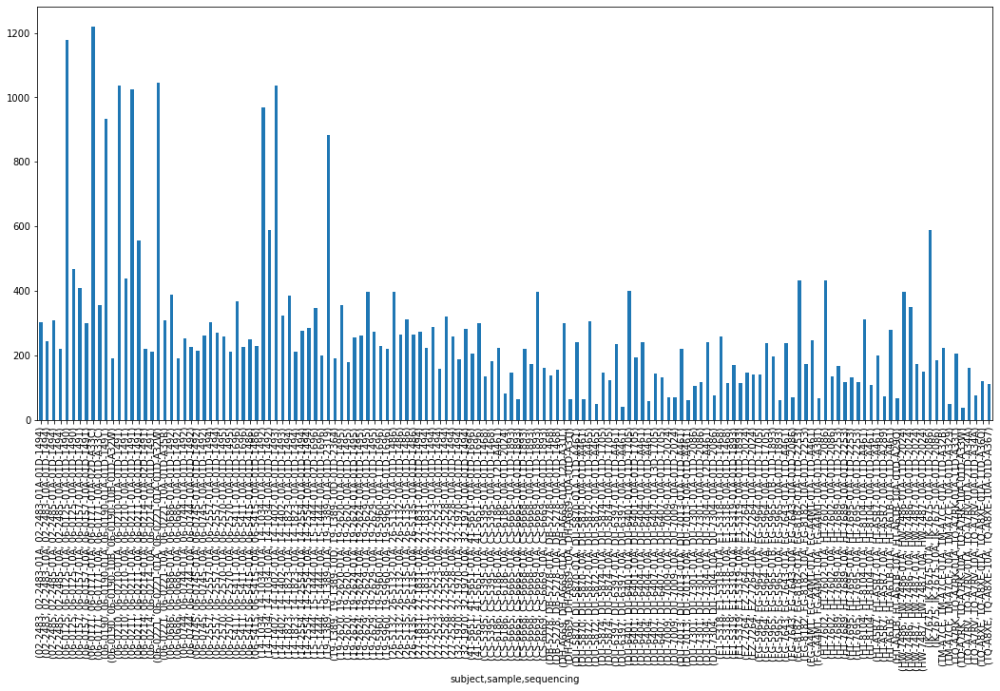

In [76]:
tmp[tmp>=0].plot(kind='bar')
plt.show()

# Read RAW read counts

In [77]:
rc=pd.read_csv('TCGA/sequencing_paired_read_counts.csv',header=None,names=['sequencing','count'])
#rc['sample']=rc['sequencing'].str[0:11]
rc.head()

,sequencing,count
0,02-2483-01A-01D-1494,566024474
1,02-2483-10A-01D-1494,579304076
2,02-2485-01A-01D-1494,575060540
3,02-2485-10A-01D-1494,478851061
4,06-0125-01A-01D-1490,1066268796


---

# Normalize tmp by RAW read count

In [78]:
#df.reset_index(inplace=True)

In [79]:
#tmp=df.merge(rc,on='sample')
tmp=df.merge(rc,on='sequencing')
#tmp.drop('sequencing',axis='columns',inplace=True)
#df.set_index(['subject','sample','sequencing'],inplace=True)
#tmp.set_index(['subject','sample','sequencing'],inplace=True)
tmp.set_index(['sequencing'],inplace=True)
tmp

,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 3129000,chr1 3315000,chr1 3321000,...,chrY 15774000,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,count
sequencing,,,,,,,,,,,,,,,,,,,,,
02-2483-01A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,566024474
02-2483-10A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,579304076
02-2485-01A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,575060540
02-2485-10A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,478851061
06-0125-01A-01D-1490,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1066268796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TQ-A7RK-10A-01D-A33W,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,372900517
TQ-A7RV-01A-21D-A34A,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,626661130
TQ-A7RV-10A-01D-A34A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,362586651


In [80]:
tmp[tmp.columns[tmp.columns.str.contains("^chr")]]=(
    1e9*tmp[tmp.columns[tmp.columns.str.contains("^chr")]].values)/tmp[['count']].values
tmp

,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 3129000,chr1 3315000,chr1 3321000,...,chrY 15774000,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,count
sequencing,,,,,,,,,,,,,,,,,,,,,
02-2483-01A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,566024474
02-2483-10A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,579304076
02-2485-01A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.74,575060540
02-2485-10A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,478851061
06-0125-01A-01D-1490,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,1066268796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TQ-A7RK-10A-01D-A33W,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,372900517
TQ-A7RV-01A-21D-A34A,1.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,626661130
TQ-A7RV-10A-01D-A34A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,362586651


In [81]:
tmp=tmp[tmp>threshold].count(axis='columns')
tmp

sequencing
02-2483-01A-01D-1494    1079
02-2483-10A-01D-1494     978
02-2485-01A-01D-1494    1045
02-2485-10A-01D-1494     989
06-0125-01A-01D-1490    1180
                        ... 
TQ-A7RK-10A-01D-A33W     327
TQ-A7RV-01A-21D-A34A     643
TQ-A7RV-10A-01D-A34A     436
TQ-A8XE-01A-11D-A36O     235
TQ-A8XE-10A-01D-A367     562
Length: 146, dtype: int64

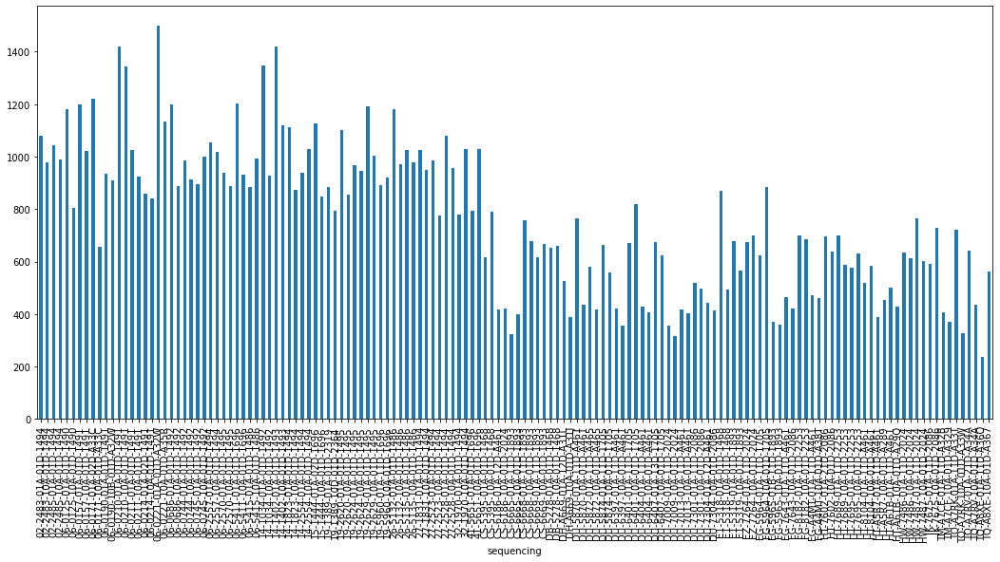

In [82]:
tmp[tmp>=0].plot(kind='bar')
plt.show()

---

# Normalize df

In [83]:
df.reset_index(inplace=True)
df=df.merge(rc,on='sequencing')
df.set_index(['subject','sample','sequencing'],inplace=True)
df=df.droplevel('sequencing',axis='index')
df[df.columns[df.columns.str.contains("^chr")]]=(
    1e9*df[df.columns[df.columns.str.contains("^chr")]].values)/df[['count']].values
df.drop('count',axis='columns',inplace=True)
df

chr1 1102000  chr1 1308000  chr1 1409000  chr1 1410000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0           0.0           0.0   
        02-2483-10A           0.0           0.0           0.0           0.0   
02-2485 02-2485-01A           0.0           0.0           0.0           0.0   
        02-2485-10A           0.0           0.0           0.0           0.0   
06-0125 06-0125-01A           0.0           0.0           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           1.6           0.0           0.0           0.0   
        TQ-A7RV-10A           0.0           0.0           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0           0.0           0.0           0.0   
        TQ-A8XE-10A           0.0           0.0           0.0           0.0   

                     chr1 1580000  chr1 1581000  chr1 2211000  chr1 3129000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0           0.0           0.0   
        02-2483-10A           0.0           0.0           0.0           0.0   
02-2485 02-2485-01A           0.0           0.0           0.0           0.0   
        02-2485-10A           0.0           0.0           0.0           0.0   
06-0125 06-0125-01A           0.0           0.0           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           0.0           0.0           0.0           0.0   
        TQ-A7RV-10A           0.0           0.0           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0           0.0           0.0           0.0   
        TQ-A8XE-10A           0.0           0.0           0.0           0.0   

                     chr1 3315000  chr1 3321000  ...  chrY 15075000  \
subject sample                                   ...                  
02-2483 02-2483-01A           0.0           0.0  ...            0.0   
        02-2483-10A           0.0           0.0  ...            0.0   
02-2485 02-2485-01A           0.0           0.0  ...            0.0   
        02-2485-10A           0.0           0.0  ...            0.0   
06-0125 06-0125-01A           0.0           0.0  ...            0.0   
...                           ...           ...  ...            ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0  ...            0.0   
TQ-A7RV TQ-A7RV-01A           0.0           0.0  ...            0.0   
        TQ-A7RV-10A           0.0           0.0  ...            0.0   
TQ-A8XE TQ-A8XE-01A           0.0           0.0  ...            0.0   
        TQ-A8XE-10A           0.0           0.0  ...            0.0   

                     chrY 15774000  chrY 17181000  chrY 19536000  \
subject sample                                                     
02-2483 02-2483-01A            0.0            0.0            0.0   
        02-2483-10A            0.0            0.0            0.0   
02-2485 02-2485-01A            0.0            0.0            0.0   
        02-2485-10A            0.0            0.0            0.0   
06-0125 06-0125-01A            0.0            0.0            0.0   
...                            ...            ...            ...   
TQ-A7RK TQ-A7RK-10A            0.0            0.0            0.0   
TQ-A7RV TQ-A7RV-01A            0.0            0.0            0.0   
        TQ-A7RV-10A            0.0            0.0            0.0   
TQ-A8XE TQ-A8XE-01A            0.0            0.0            0.0   
        TQ-A8XE-10A            0.0            0.0            0.0   

                     chrY 19699000  chrY 19700000  chrY 20553000  \
subject sample                                                     
02-2483 02-2483-01A 

# drop any that are all 0

In [84]:
df.drop(df.columns[df.sum(axis='index')==0],axis='columns',inplace=True)
df

chr1 1102000  chr1 2211000  chr1 3315000  chr1 3321000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0           0.0           0.0   
        02-2483-10A           0.0           0.0           0.0           0.0   
02-2485 02-2485-01A           0.0           0.0           0.0           0.0   
        02-2485-10A           0.0           0.0           0.0           0.0   
06-0125 06-0125-01A           0.0           0.0           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           1.6           0.0           0.0           0.0   
        TQ-A7RV-10A           0.0           0.0           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0           0.0           0.0           0.0   
        TQ-A8XE-10A           0.0           0.0           0.0           0.0   

                     chr1 4095000  chr1 4529000  chr1 4555000  chr1 4763000  \
subject sample                                                                
02-2483 02-2483-01A           0.0          1.77           0.0           0.0   
        02-2483-10A           0.0          0.00           0.0           0.0   
02-2485 02-2485-01A           0.0          0.00           0.0           0.0   
        02-2485-10A           0.0          0.00           0.0           0.0   
06-0125 06-0125-01A           0.0          0.00           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0          0.00           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           0.0          0.00           0.0           0.0   
        TQ-A7RV-10A           0.0          0.00           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0          0.00           0.0           0.0   
        TQ-A8XE-10A           0.0          0.00           0.0           0.0   

                     chr1 5095000  chr1 5112000  ...  chrY 12879000  \
subject sample                                   ...                  
02-2483 02-2483-01A           0.0           0.0  ...           0.00   
        02-2483-10A           0.0           0.0  ...           1.73   
02-2485 02-2485-01A           0.0           0.0  ...           0.00   
        02-2485-10A           0.0           0.0  ...           0.00   
06-0125 06-0125-01A           0.0           0.0  ...           0.00   
...                           ...           ...  ...            ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0  ...           0.00   
TQ-A7RV TQ-A7RV-01A           0.0           0.0  ...           0.00   
        TQ-A7RV-10A           0.0           0.0  ...           0.00   
TQ-A8XE TQ-A8XE-01A           0.0           0.0  ...           0.00   
        TQ-A8XE-10A           0.0           0.0  ...           0.00   

                     chrY 14617000  chrY 14669000  chrY 14784000  \
subject sample                                                     
02-2483 02-2483-01A            0.0            0.0           0.00   
        02-2483-10A            0.0            0.0           0.00   
02-2485 02-2485-01A            0.0            0.0           1.74   
        02-2485-10A            0.0            0.0           0.00   
06-0125 06-0125-01A            0.0            0.0           0.00   
...                            ...            ...            ...   
TQ-A7RK TQ-A7RK-10A            0.0            0.0           0.00   
TQ-A7RV TQ-A7RV-01A            0.0            0.0           0.00   
        TQ-A7RV-10A            0.0            0.0           0.00   
TQ-A8XE TQ-A8XE-01A            0.0            0.0           0.00   
        TQ-A8XE-10A            0.0            0.0           0.00   

                     chrY 15075000  chrY 17181000  chrY 19536000  \
subject sample                                                     
02-2483 02-2483-01A 

# Match earlier HERVK113 notebook counts
* CS-5390-10A - 553
* FG-5963-01A - 68
* CS-6186-01A - 1100
* CS-6186-10A - 950
* DU-5872-01A - 1108
* DU-5872-10A - 776
* 02-2483-01A - 568
* 02-2483-10A - 557
* 02-2485-01A - 587
* 02-2485-10A - 498
* 06-0125-01A - 734

## Keep only Broad and drop Harvard Medical School

### Harvard's samples were really low coverage?

## Search for the presence of HKLE insertions with positions unique to tumor or normal

### Copy raw dataframe, remove sample level and clear out the values

compdf2=df.copy()
compdf2.drop(compdf2.loc[compdf2.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)
compdf2=compdf2.droplevel('sample',axis='index')
compdf2.loc[:,:] = 0
compdf2.head(10)

## Ok. This is some dark magic I think. Gotta be a better, cleaner way to do this.

* Loop over the subjects and hkles. (Loops aren't really pythony.)
* Do an "XOR-AND" for the first (tumor 01) and second (normal 10) samples.
* This returns a Boolean mask
* Change it to 0/1
* Subtract the tumor array from the normal array and assign it to the subject/hkle

### This will create a dataframe of positions representing "tumor - normal" so with values of only

* -1 : normal only
*  0 : both or neither
* +1 : tumor only


for subject in df.index.get_level_values('subject').unique():
    for hkle in df.index.get_level_values('hkle').unique():
        tm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[0]>0))
        tm.replace([False,True],[0,1],inplace=True)
        nm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[1]>0))
        nm.replace([False,True],[0,1],inplace=True)
        compdf2.loc[subject,hkle]=tm.values-nm.values

compdf.equals(compdf2)

# New technique. Separate the tumor and normal counts.
### Remove the sample column
### DO NOT RESHAPE

In [85]:
n=df.copy()    # NORMAL
t=df.copy()    # TUMOR

In [86]:
n.drop(n.loc[n.index.get_level_values('sample').str.contains("-01.$")].index,axis='index',inplace=True)
t.drop(t.loc[t.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)

In [87]:
n=n.droplevel('sample',axis='index')
t=t.droplevel('sample',axis='index')

In [88]:
n.head()

,chr1 1102000,chr1 2211000,chr1 3315000,chr1 3321000,chr1 4095000,chr1 4529000,chr1 4555000,chr1 4763000,chr1 5095000,chr1 5112000,...,chrY 12879000,chrY 14617000,chrY 14669000,chrY 14784000,chrY 15075000,chrY 17181000,chrY 19536000,chrY 20553000,chrY 21047000,chrY 21217000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.73,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
02-2485,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
06-0125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
06-0157,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0
06-0171,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,1.39,0.0,0.0,1.39,0.0


In [89]:
t.head()

,chr1 1102000,chr1 2211000,chr1 3315000,chr1 3321000,chr1 4095000,chr1 4529000,chr1 4555000,chr1 4763000,chr1 5095000,chr1 5112000,...,chrY 12879000,chrY 14617000,chrY 14669000,chrY 14784000,chrY 15075000,chrY 17181000,chrY 19536000,chrY 20553000,chrY 21047000,chrY 21217000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0.0,0.0,0.0,0.0,0.0,1.77,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00
02-2485,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.74,0.0,0.0,0.0,0.00,0.0,1.74
06-0125,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00
06-0157,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00
06-0171,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.85,0.0,0.85


In [90]:
n_index=n.index
t_index=t.index

### Compare the indexes. An empty array shows that the indexes are the same. Yay.

In [91]:
n_index[n_index != t_index]

Index([], dtype='object', name='subject')

In [92]:
compdf=(
    ((n>threshold)^(t>threshold))&(t>threshold)).replace([False,True],[0,1]) - (
    ((n>threshold)^(t>threshold))&(n>threshold)).replace([False,True],[0,1])

In [93]:
compdf

,chr1 1102000,chr1 2211000,chr1 3315000,chr1 3321000,chr1 4095000,chr1 4529000,chr1 4555000,chr1 4763000,chr1 5095000,chr1 5112000,...,chrY 12879000,chrY 14617000,chrY 14669000,chrY 14784000,chrY 15075000,chrY 17181000,chrY 19536000,chrY 20553000,chrY 21047000,chrY 21217000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
02-2485,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0125,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IK-7675,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TM-A7CF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TQ-A7RK,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### This is cleaner, faster and more pythonic than what follows for compdf.


In [94]:
compdf.head()

,chr1 1102000,chr1 2211000,chr1 3315000,chr1 3321000,chr1 4095000,chr1 4529000,chr1 4555000,chr1 4763000,chr1 5095000,chr1 5112000,...,chrY 12879000,chrY 14617000,chrY 14669000,chrY 14784000,chrY 15075000,chrY 17181000,chrY 19536000,chrY 20553000,chrY 21047000,chrY 21217000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
02-2485,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0125,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [95]:
compdf.shape

(73, 10131)

### Keep only positions with any sample with something other than 0

### We lose over 3000 positions

In [96]:
compdf=compdf.loc[:, (compdf != 0).any(axis=0)]

In [97]:
compdf.shape

(73, 3411)

In [98]:
compdf

,chr1 3315000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7602000,chr1 7952000,chr1 8503000,chr1 8912000,...,chrX 155223000,chrY 4294000,chrY 4296000,chrY 7180000,chrY 8917000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 19536000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,-1,0,0,-1,0,0,1,0,0,0
02-2485,0,0,0,0,0,-1,0,1,1,0,...,1,-1,0,-1,0,0,-1,0,0,0
06-0125,0,1,0,0,0,0,0,0,0,-1,...,1,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,-1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IK-7675,0,0,-1,0,0,0,-1,1,0,0,...,0,-1,0,-1,0,0,1,0,0,0
TM-A7CF,0,0,1,0,0,0,0,-1,0,0,...,0,0,0,0,0,0,0,0,0,0
TQ-A7RK,0,0,-1,0,0,0,0,0,0,0,...,0,-1,0,0,0,1,0,0,0,0


### Get the chromosome columns for analysis after merging with the metadata

In [99]:
#chromosome_columns=compdf.columns[compdf.columns.get_level_values('chromosome').str.contains("^chr")]
chromosome_columns=compdf.columns[compdf.columns.str.contains("^chr")]
chromosome_columns

Index(['chr1 3315000', 'chr1 6304000', 'chr1 6306000', 'chr1 6714000',
       'chr1 6716000', 'chr1 7600000', 'chr1 7602000', 'chr1 7952000',
       'chr1 8503000', 'chr1 8912000',
       ...
       'chrX 155223000', 'chrY 4294000', 'chrY 4296000', 'chrY 7180000',
       'chrY 8917000', 'chrY 12352000', 'chrY 12452000', 'chrY 12878000',
       'chrY 12879000', 'chrY 19536000'],
      dtype='object', length=3411)

### Merge with the metadata for later grouping

In [100]:
compdf.reset_index(inplace=True)
compdf=pd.merge(compdf,meta,on='subject',how='left')
#compdf=compdf.merge(meta,on='subject',how='inner')
#compdf=compdf.merge(meta,on='subject')
#compdf.set_index(['subject','hkle'],inplace=True)
compdf.set_index(['subject'],inplace=True)
compdf.head()

,chr1 3315000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7602000,chr1 7952000,chr1 8503000,chr1 8912000,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name,unknown
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
02-2485,0,0,0,0,0,-1,0,1,1,0,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0125,0,1,0,0,0,0,0,0,0,-1,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0157,0,0,0,0,0,-1,0,0,0,0,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0171,0,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,65.0,13.11,1.0,399.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


### More dark magic here. 

* Select all subjects and HERVK113 on the y-axis and all the chromosome columns on the x-axis.
* We will count all the incidence of each of the previously computed "tumor-normal" values
* Then we will transpose and sort descending by "-1". This will put the highest occurence of normal at the top.


In [101]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:17'

In [102]:
compdf.shape

(73, 3433)

In [103]:
#compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
compdf[chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[-1],ascending=False).head(10)


,-1,0,1
chr10 84179000,25.0,34.0,14.0
chr6 73661000,24.0,29.0,20.0
chr14 81243000,23.0,39.0,11.0
chr3 113045000,22.0,38.0,13.0
chr2 192893000,22.0,37.0,14.0
chr9 15405000,22.0,39.0,12.0
chr11 70456000,21.0,39.0,13.0
chr10 45511000,21.0,40.0,12.0
chr10 43544000,21.0,37.0,15.0
chr10 125969000,21.0,37.0,15.0


In [104]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:21'

### We see that the unique normal positions aren't really that unique.

### If we do the same, but sort by tumor ...

In [105]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:21'

In [106]:
#compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
#compdf.loc[pd.IndexSlice[:,],chromosome_columns].apply(
compdf[chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[1],ascending=False).head(10)


,-1,0,1
chr7 91889000,7.0,31.0,35.0
chr5 60432000,13.0,30.0,30.0
chr20 43608000,10.0,35.0,28.0
chr7 13101000,10.0,35.0,28.0
chr6 53304000,17.0,28.0,28.0
chr2 44068000,10.0,36.0,27.0
chr7 138378000,6.0,40.0,27.0
chr8 41627000,12.0,35.0,26.0
chr17 41876000,13.0,34.0,26.0
chr7 27988000,10.0,37.0,26.0


In [107]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:24'

In [108]:
def ttests_boxplots_and_heatmaps(localdf,columns,group_column,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    groups=localdf[group_column].unique().tolist()
    print("T-Testing")
    for col in columns:
        if ( col not in localdf.columns ):
            continue
        for group in groups:
            others = groups.copy()
            others.remove(group)
            for other in others:
                #t,p = stats.ttest_rel(
                t,p = stats.ttest_ind(
                    localdf[localdf[group_column]==group][col],
                    localdf[localdf[group_column]==other][col])
                #if(p<0.1):
                #    print(col,group,other,t,p)
                if(( p > 0 ) and ( p < heat_p )):
                    select_p_values.append([abs(t),p,col])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col'])                        
    pdf=pdf.drop_duplicates().sort_values('p')
    print("Boxplotting")
    for index, row in pdf.iterrows():
        if(( row['p'] > 0 ) and ( row['p'] < box_p )):
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+str(row['col']))
            
            localdf.boxplot(column=row['col'],by=[group_column])
            plt.title(str(row['col']))
            plt.xticks(rotation=75,ha='right')
            plt.show()                            

    print("Clustermapping")

    selected=['subject',group_column]
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)
    print(selected)
    
    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    #['IDH_1p19q_status' 'chrY 7711000' 'subject']
    if len(selected) > 3: #7:
        tmp=localdf[selected].copy()
        tmp.set_index(['subject',group_column],inplace=True)

        #tmp-=tmp.min() # This may almost always be 0 now.
#        tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
        # ...
        #standard_scale int or None, optional
        #Either 0 (rows) or 1 (columns).
        #Whether or not to standardize that dimension, meaning for each row or column,
        #subtract the minimum and divide each by its maximum.
        # how would that deal with 0s or empty cells

        tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this

        tmp.reset_index(inplace=True)

        tmp=tmp.sort_values([group_column])
        tmp.set_index(['subject'],inplace=True)

        diagnoses=tmp.pop(group_column)
        tmp=tmp.T

        network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                            light=.9, dark=.1, reverse=True,
                            start=1, rot=-2)
        #print(network_pal)
        network_pal
        #print('lut')
        network_lut = dict(zip(diagnoses.unique(), network_pal))
        #print(network_lut)
        #print('labels')
        # Convert the palette to vectors that will be drawn on the side of the matrix
        network_labels = diagnoses
        #print(network_labels)
        network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
        #print('colors')
        #print(network_colors)

#        print(tmp)

        g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 1 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        #g.cax.set_position([.97, .2, .03, .45])
        g.cax.set_position([0, .15, .005, .6])
        plt.show()

        g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 2 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        # [dist from left,dist from bottom?,width?,height?]
        g.cax.set_position([0, .15, .005, .6])
        plt.show()  
        


        pcadf=localdf[selected].copy()

        #pcadf=tmp[(tmp["Lab kit"]==labkit) & (tmp["trimmer"]==trimmer) & tmp['diag'].isin(diags)].copy()
        #pcadf=pcadf.drop('trimmer',axis='columns')
        #pcadf=pcadf.drop('Lab kit',axis='columns')
        pcadf.set_index(['subject',group_column],inplace=True)
        elements=pcadf.columns
        pcadf.reset_index(inplace=True)
        scaler = StandardScaler()
        scaler.fit(pcadf[elements])
        scaled_data = scaler.transform(pcadf[elements])
        #scaled_data[0]
        
        #ValueError: n_components=8 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'
        n=min([len(pcadf),len(pcadf.columns)-2,8])
        pca = PCA(n_components=n)
        
        pca.fit(scaled_data)
        x_pca = pca.transform(scaled_data)
        
        # for color
        groups=pcadf[group_column].unique().tolist()
        pcadf['group_index']=pcadf[group_column].apply(lambda x: groups.index(x))
        
        fig = plt.figure(figsize = (18,8))
        ax = fig.add_subplot(1,1,1) 
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_title(''+str(n)+' component PCA '+group_column, fontsize = 20)

        colors = ['r','g','b','c','m','y','k']
        for target, color in zip(groups,colors):
            indicesToKeep = pcadf[group_column] == target
            ax.scatter(x_pca[indicesToKeep, 0], x_pca[indicesToKeep, 1], c = color, s = 50)
        ax.legend(groups)
        ax.grid()
        #plt.title(group_column)
        plt.show()

    else:
        print("Not enough data to produce cluster maps")
        

In [109]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:24'

In [110]:
compdf.reset_index(inplace=True)
compdf.head()

,subject,chr1 3315000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7602000,chr1 7952000,chr1 8503000,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name,unknown
0,02-2483,0,0,0,0,0,0,0,0,0,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,02-2485,0,0,0,0,0,-1,0,1,1,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,06-0125,0,1,0,0,0,0,0,0,0,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,06-0157,0,0,0,0,0,-1,0,0,0,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,06-0171,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,65.0,13.11,1.0,399.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


primary_diagnosis
T-Testing
Boxplotting
 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr22 19083000


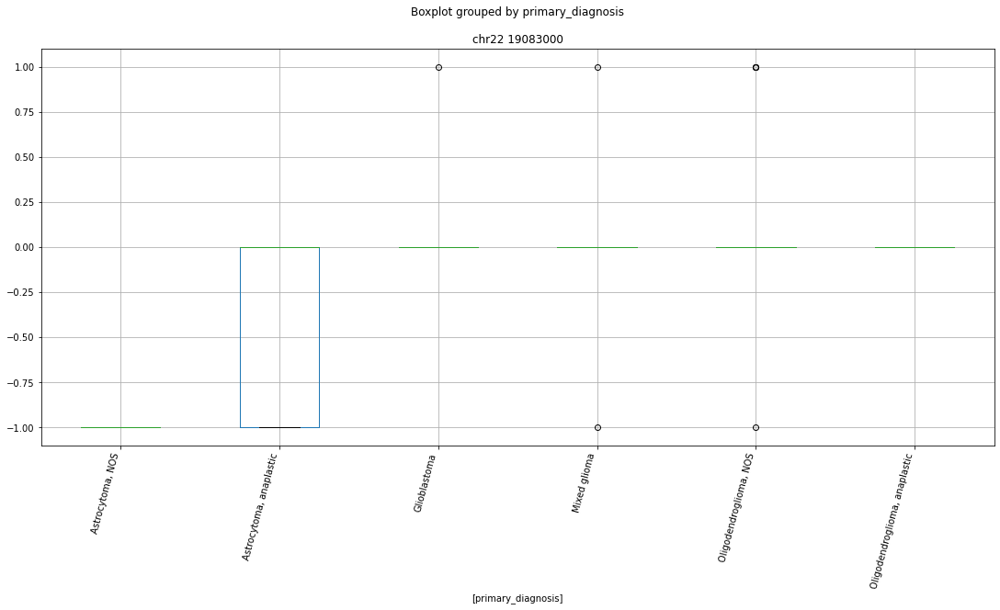

 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr20 33537000


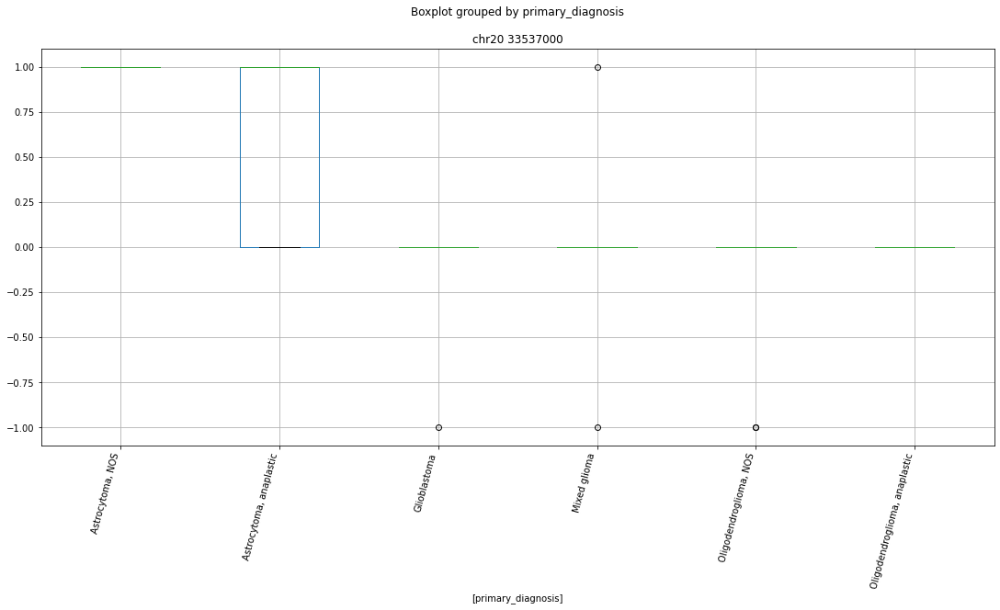

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 28838000


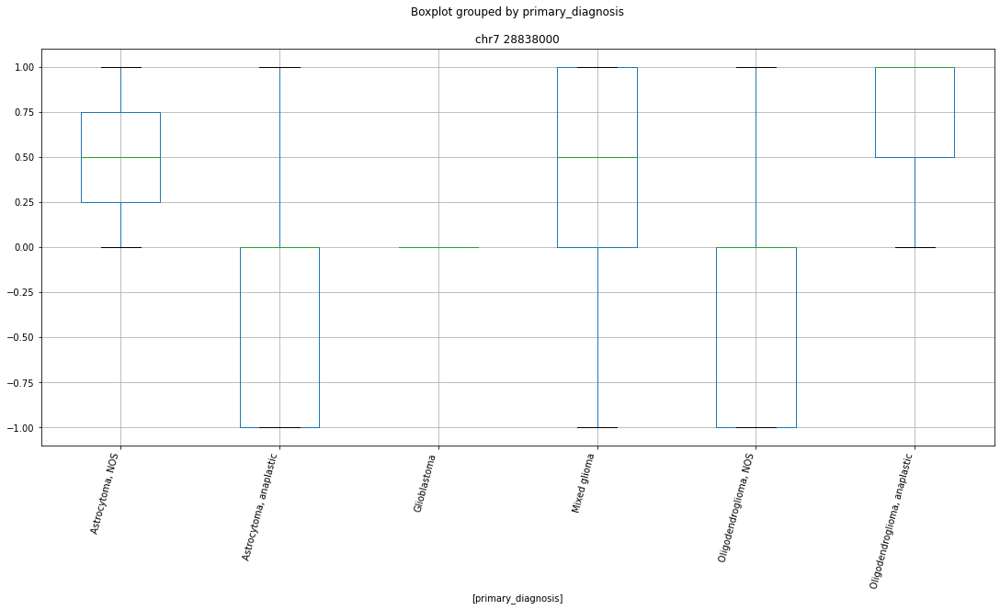

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 133484000


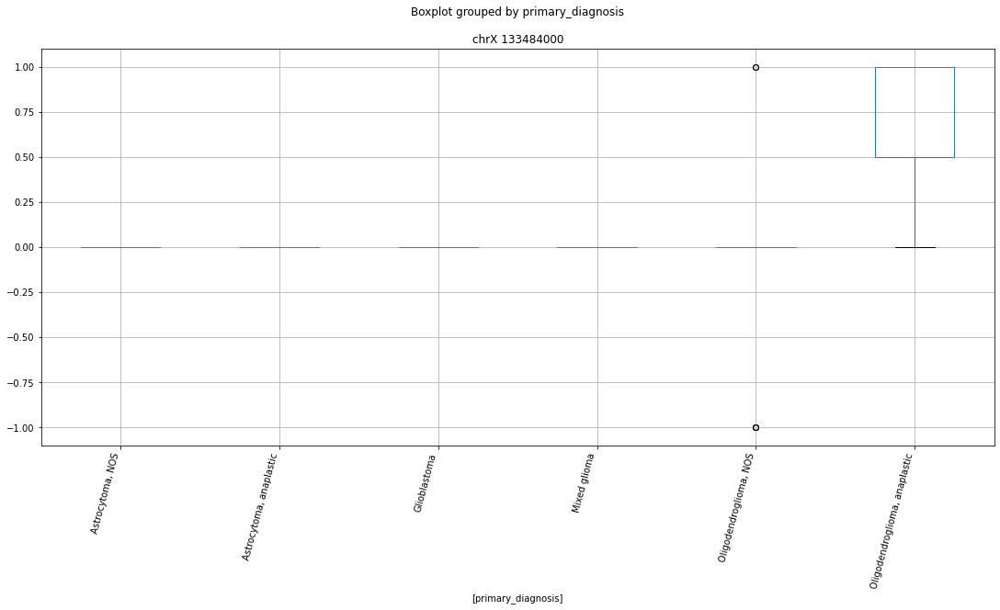

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 63808000


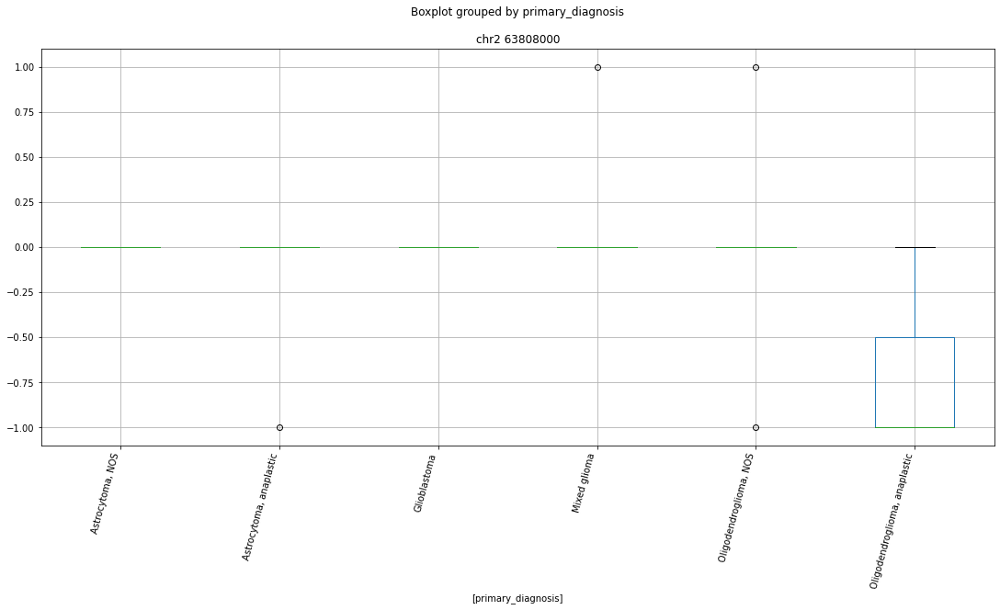

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 146095000


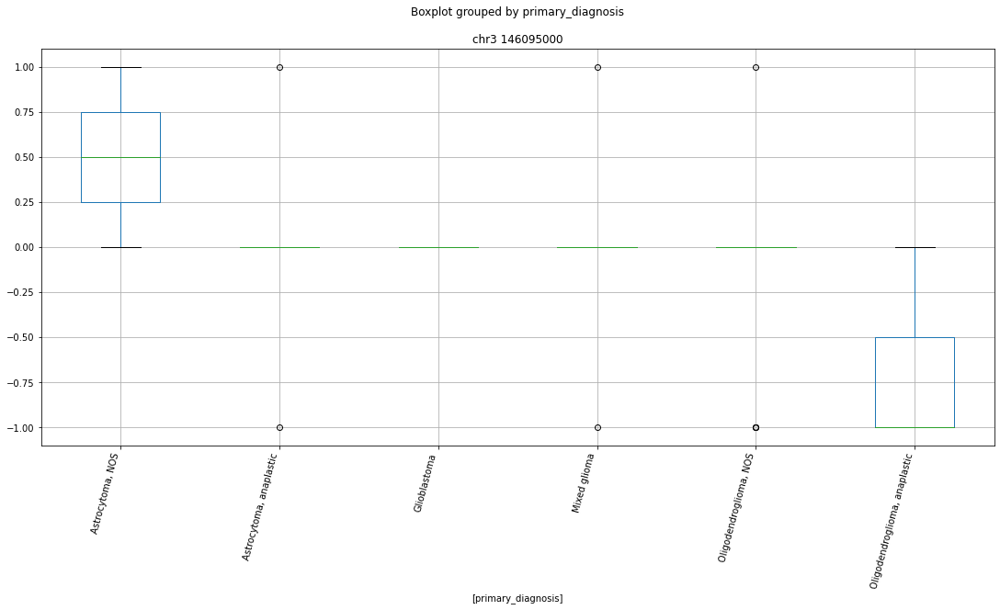

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 58454000


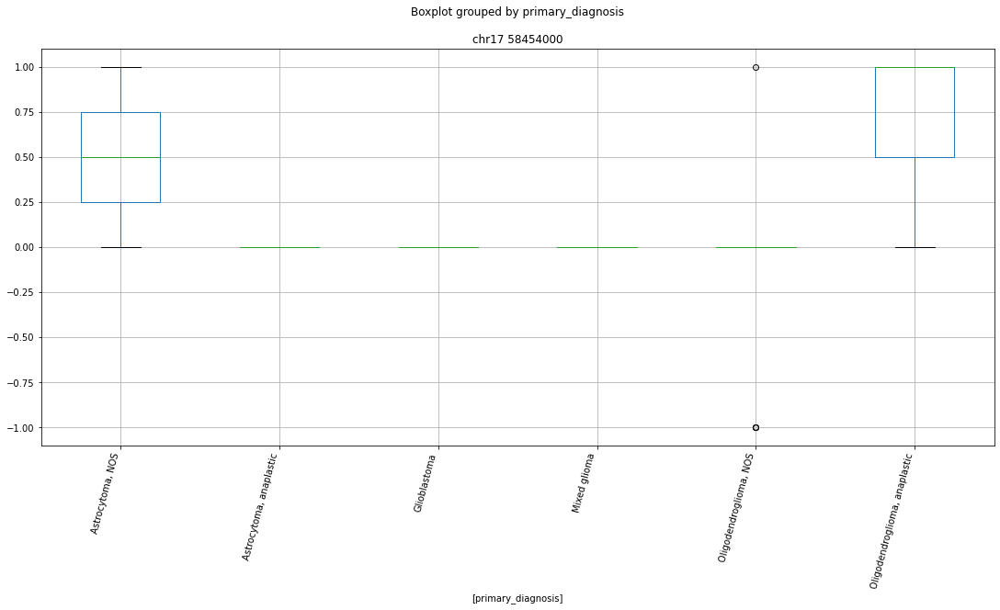

 p : 4.4800980612265565e-07  ( t : 6.940788532619723 ) :  chr10 97842000


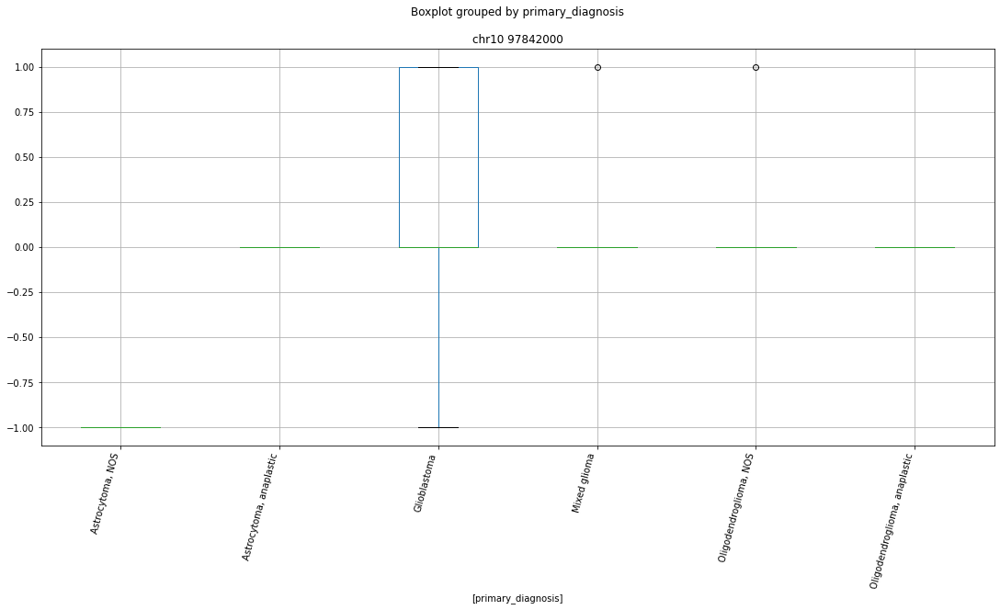

 p : 4.964176116065124e-07  ( t : 6.18465843842649 ) :  chr11 82181000


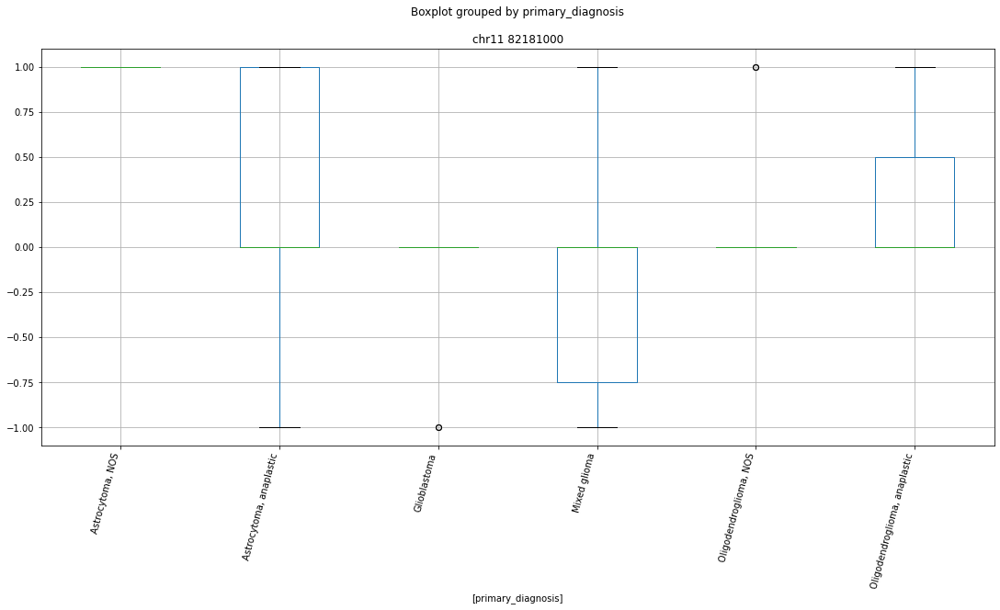

 p : 9.711338292628827e-07  ( t : 6.516251872168421 ) :  chr1 248830000


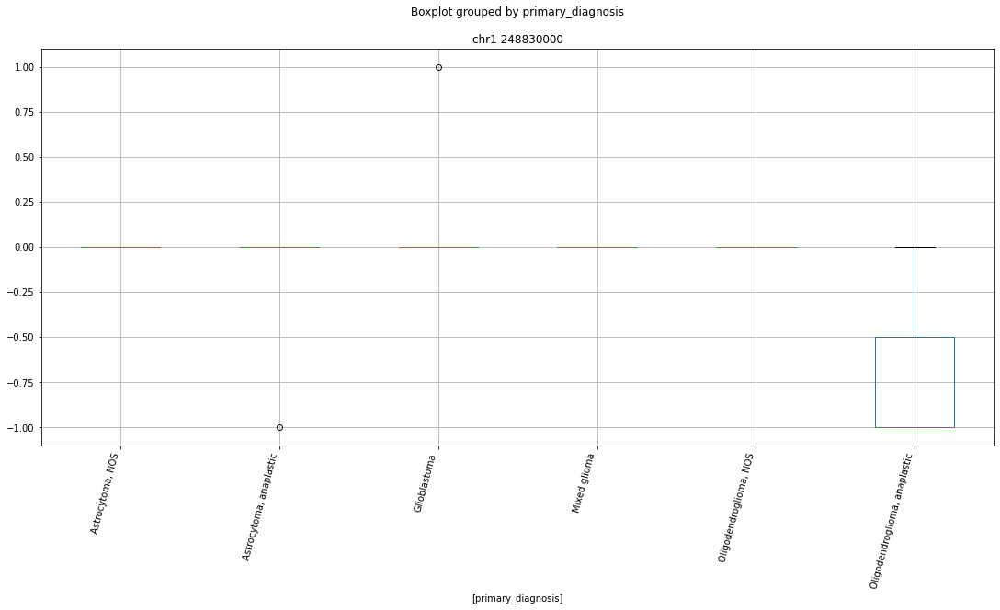

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr7 99426000


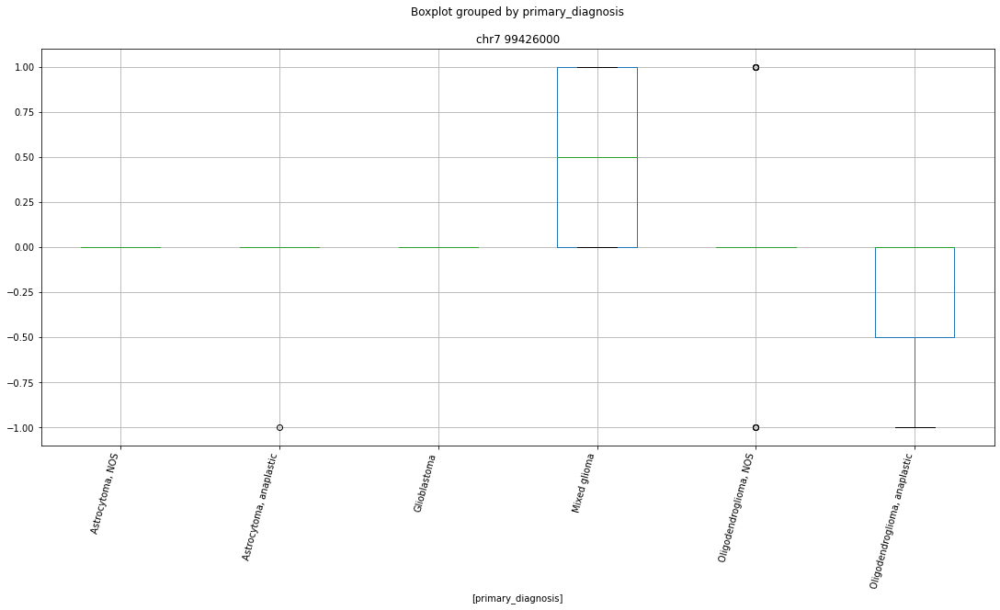

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr12 4721000


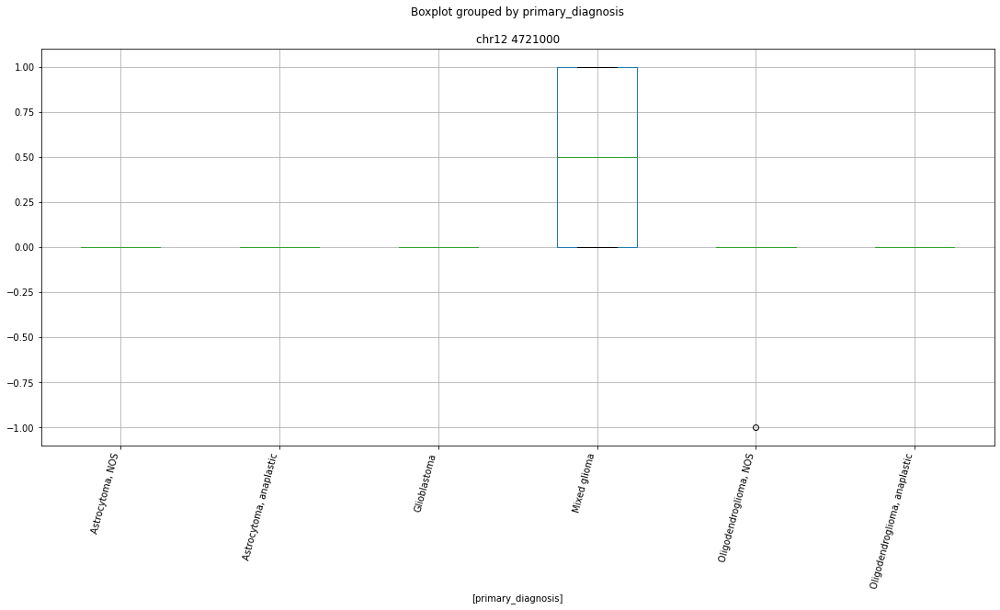

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr16 49211000


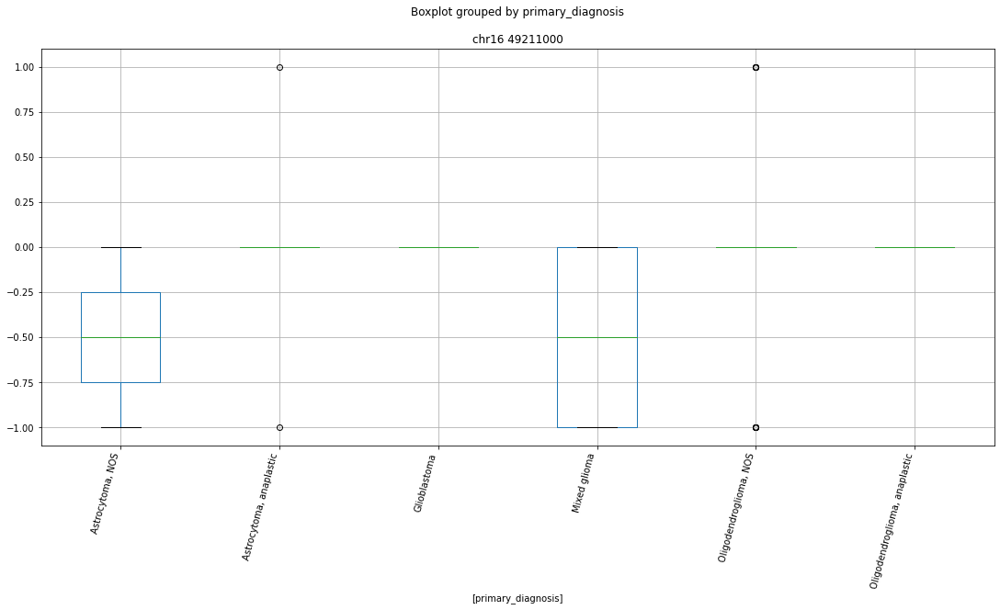

 p : 1.714740087022125e-06  ( t : 6.362389488234746 ) :  chr7 44870000


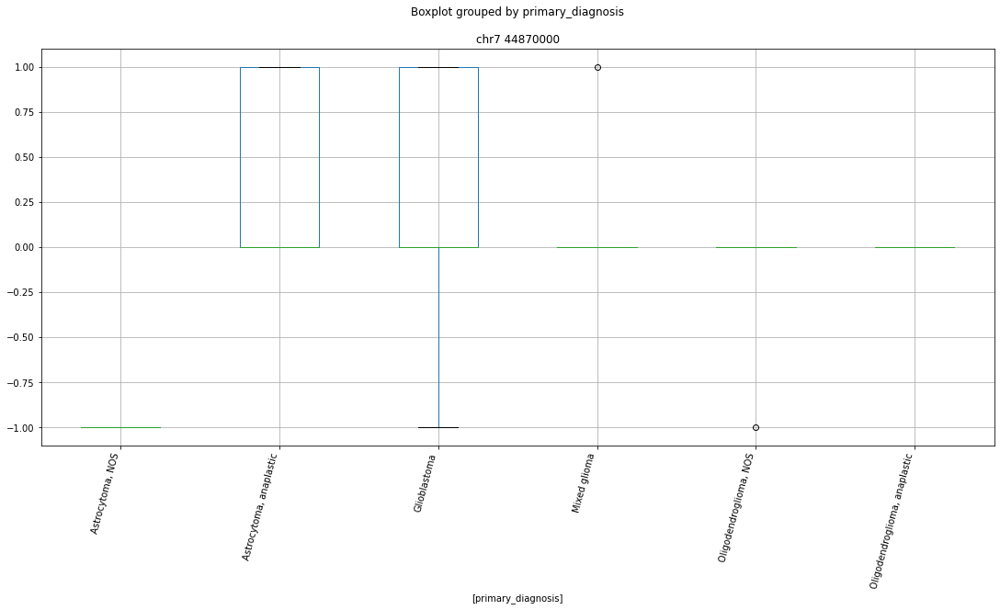

 p : 1.714740087022125e-06  ( t : 6.362389488234746 ) :  chr4 151731000


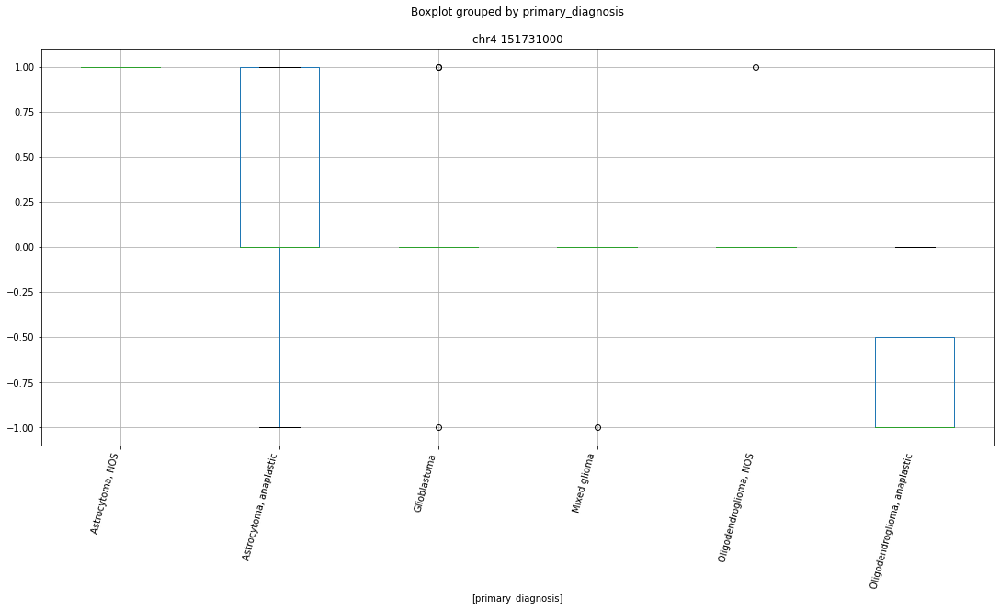

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 146095000


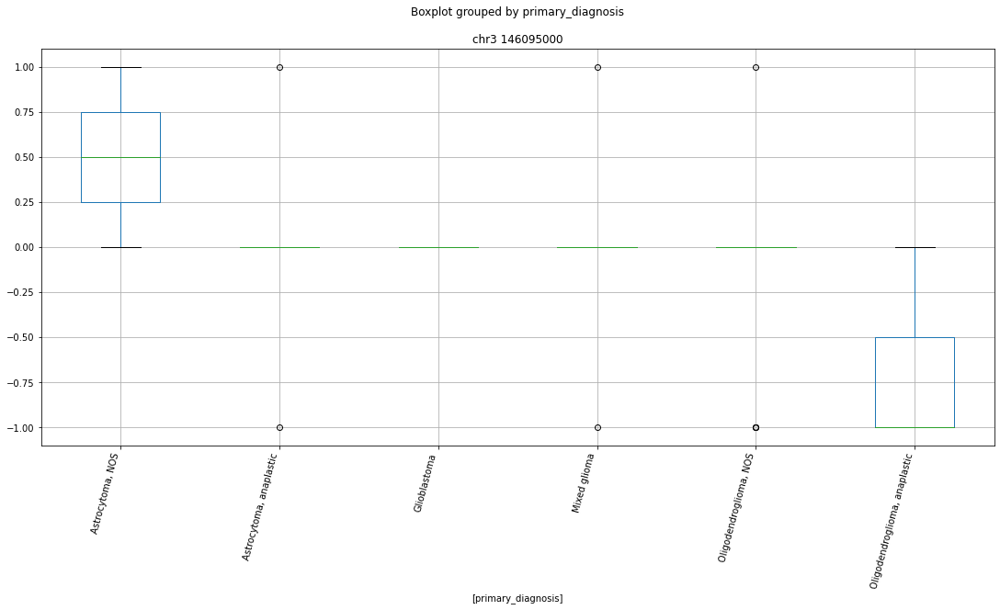

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 61672000


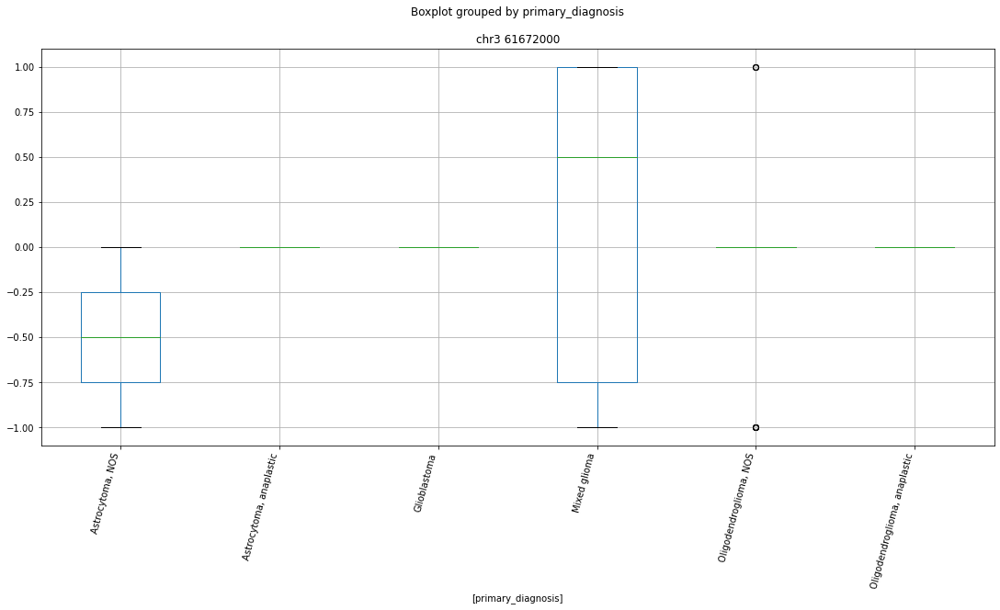

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 50313000


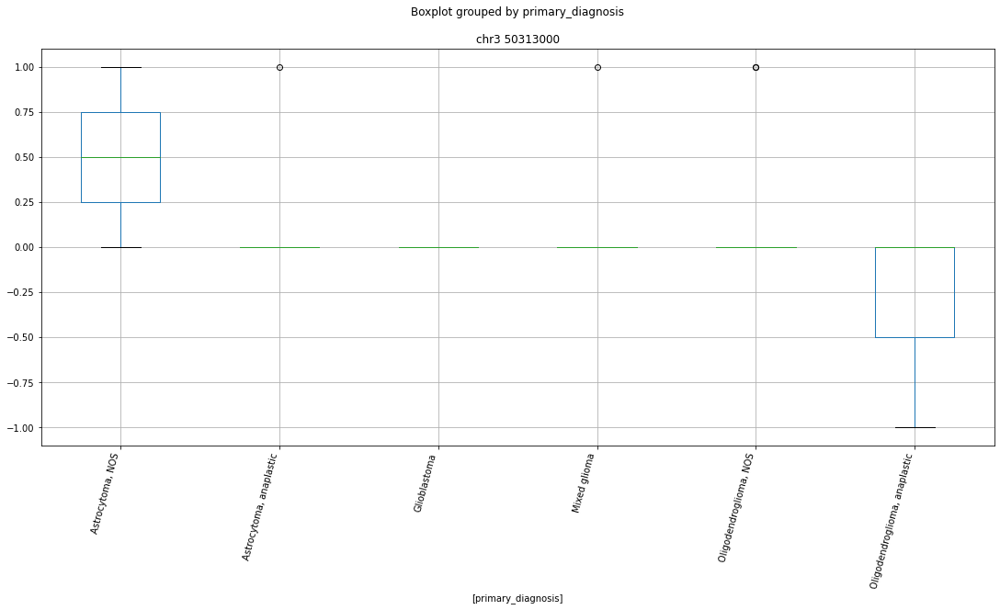

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 16906000


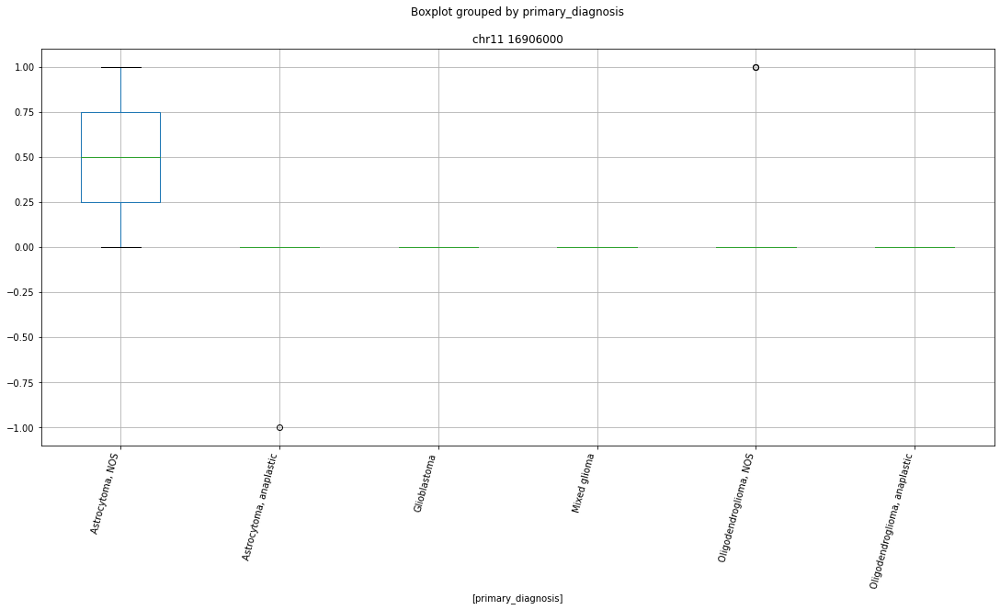

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr7 28838000


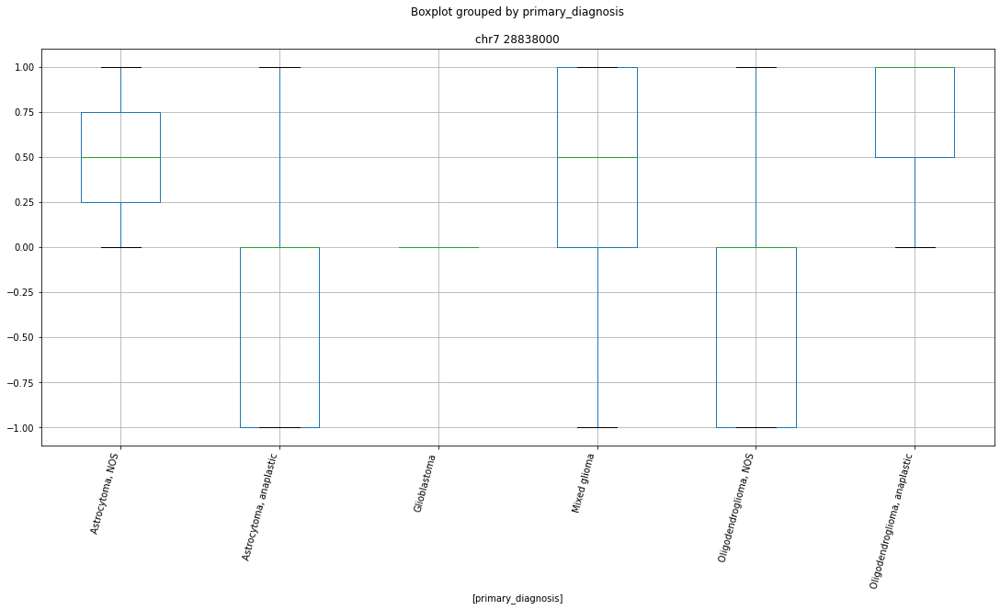

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 220467000


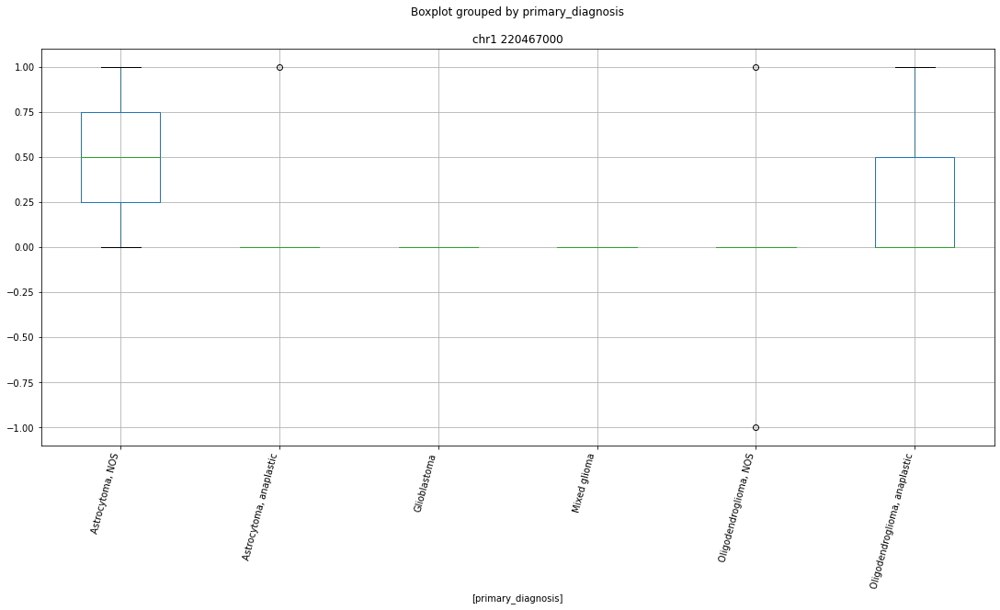

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr8 57021000


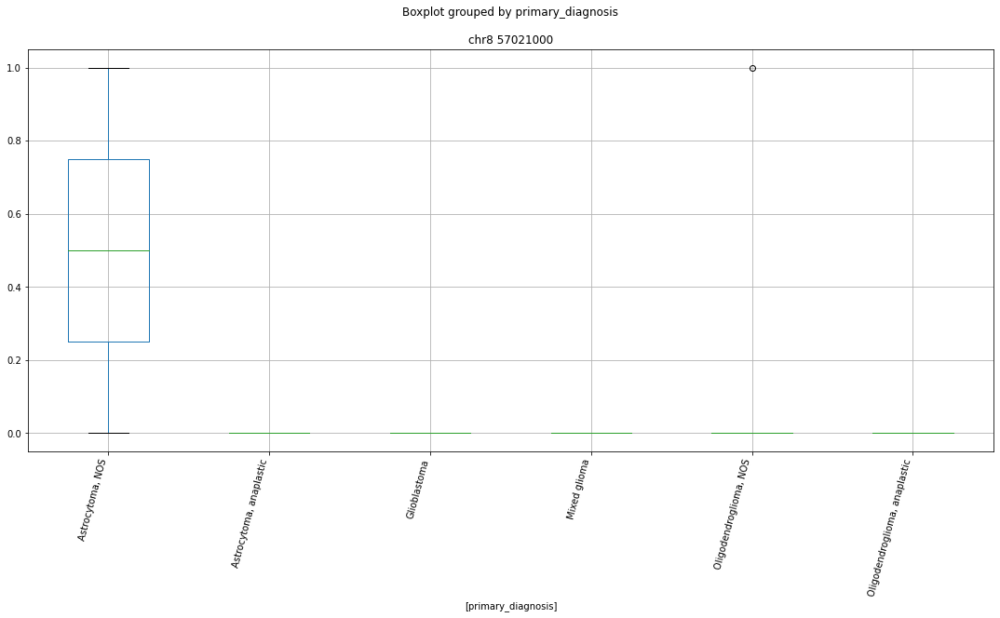

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 39807000


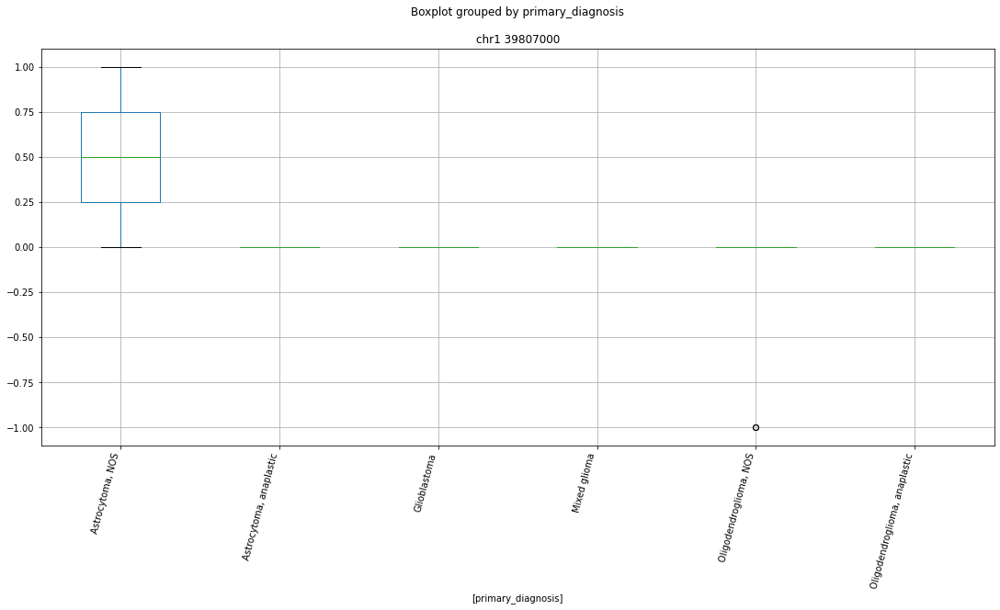

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 39914000


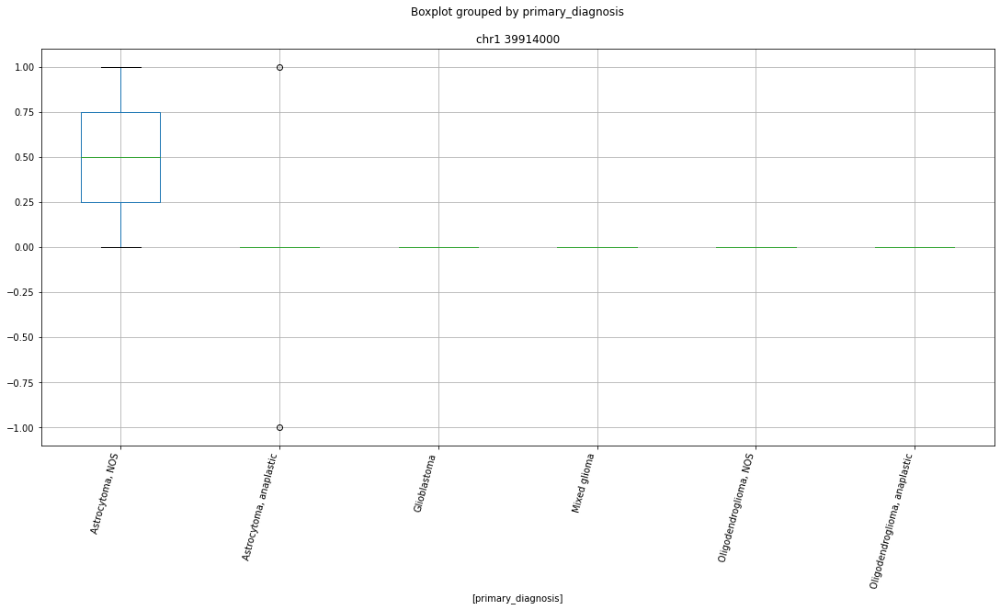

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr7 111609000


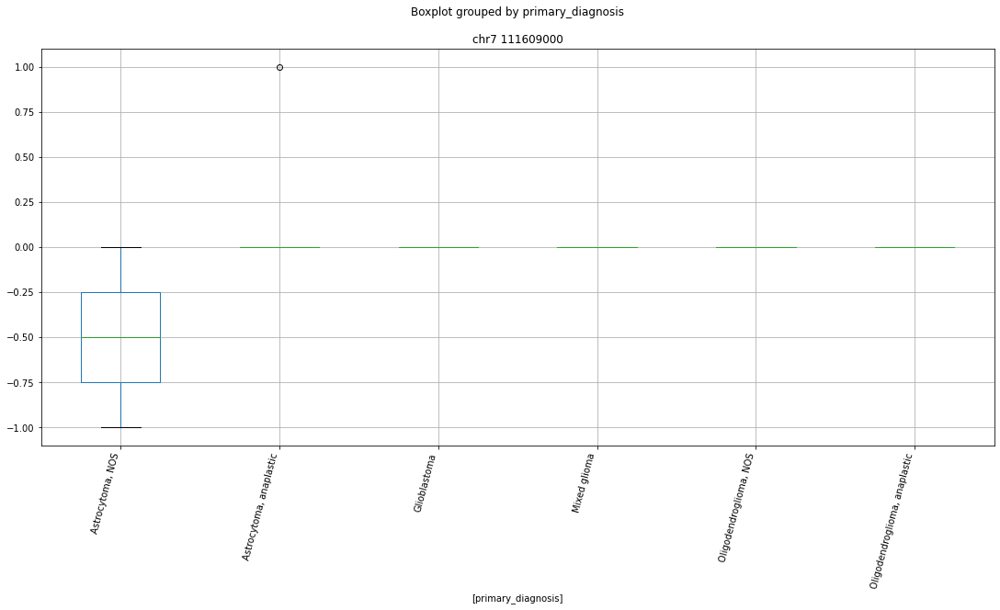

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 32663000


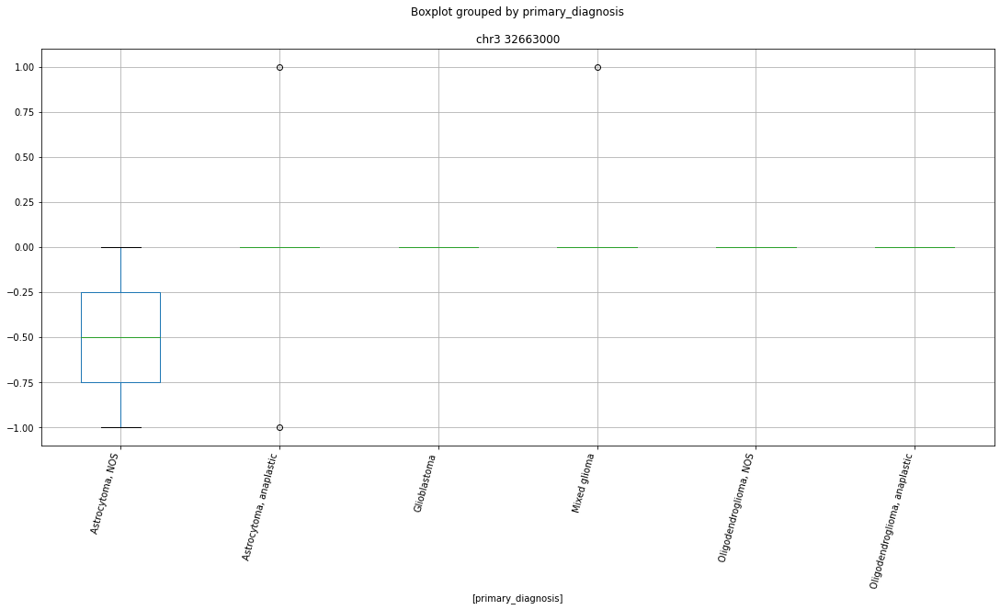

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 219544000


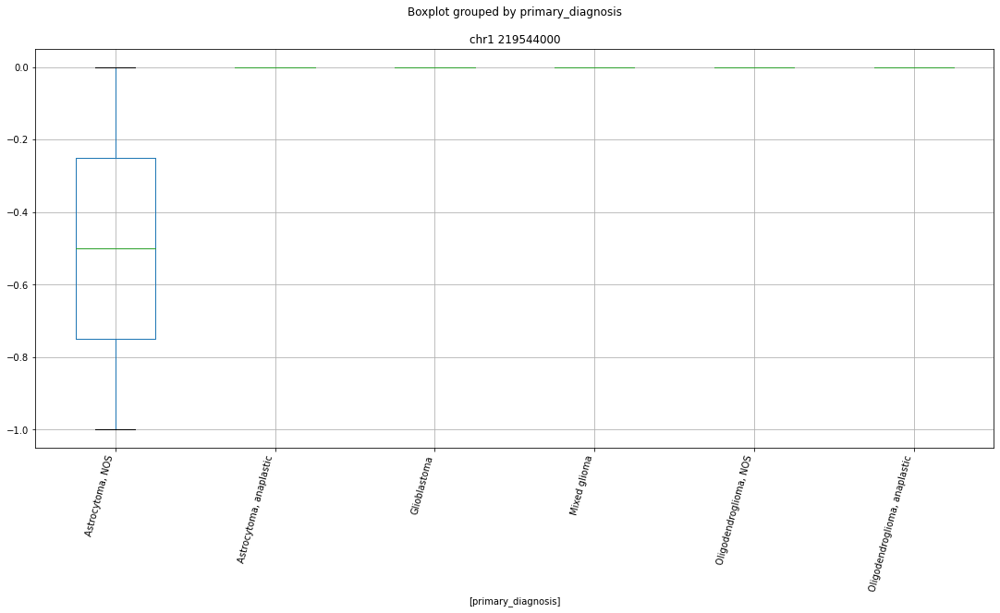

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 131085000


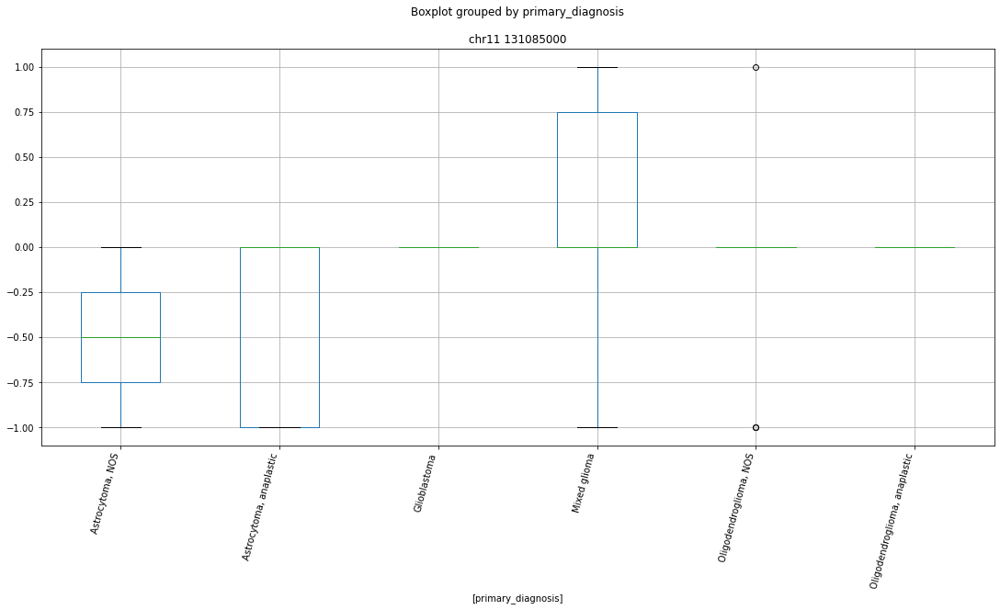

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr5 157013000


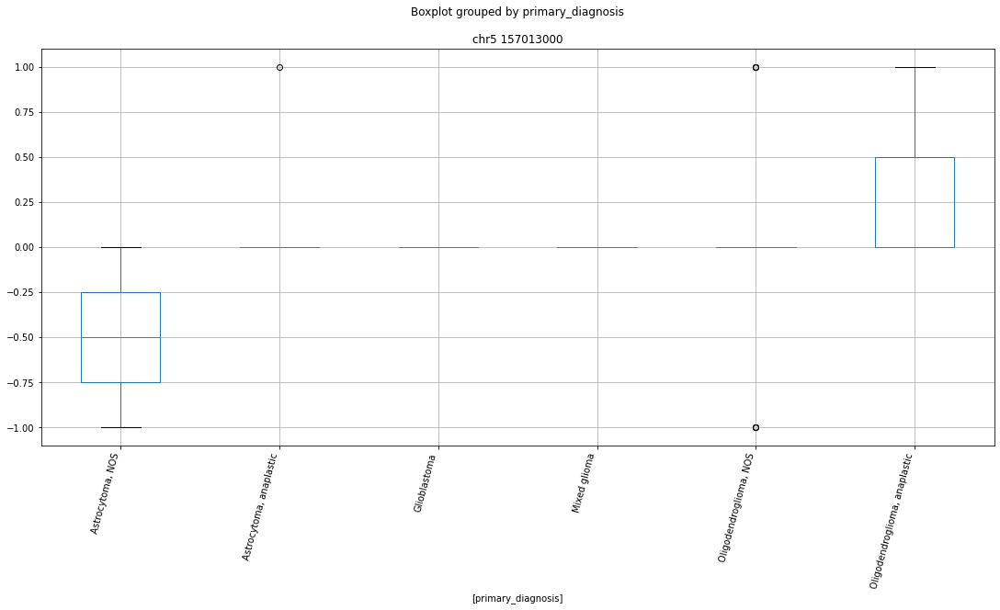

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 8977000


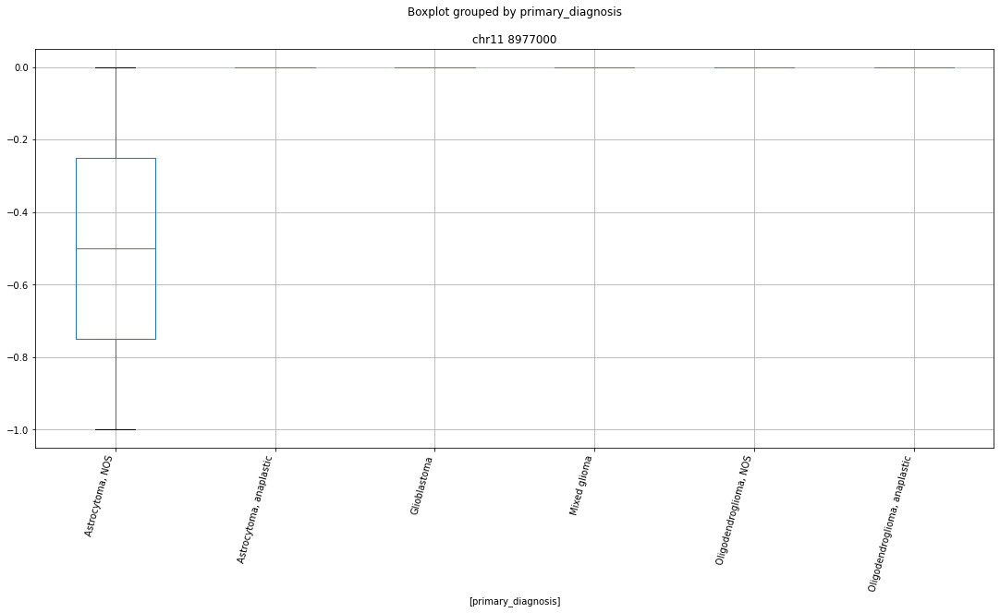

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr4 183819000


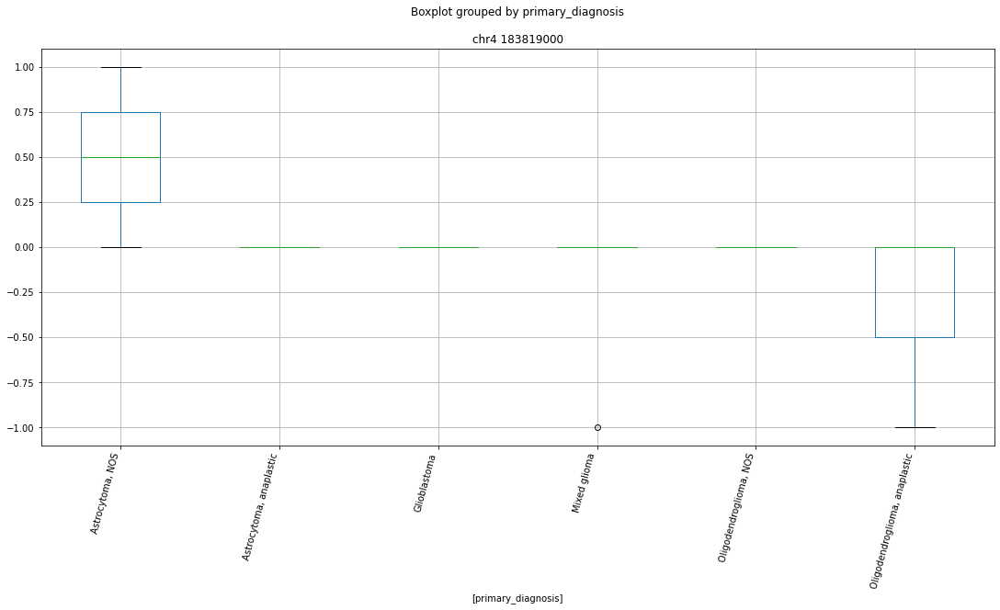

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 125517000


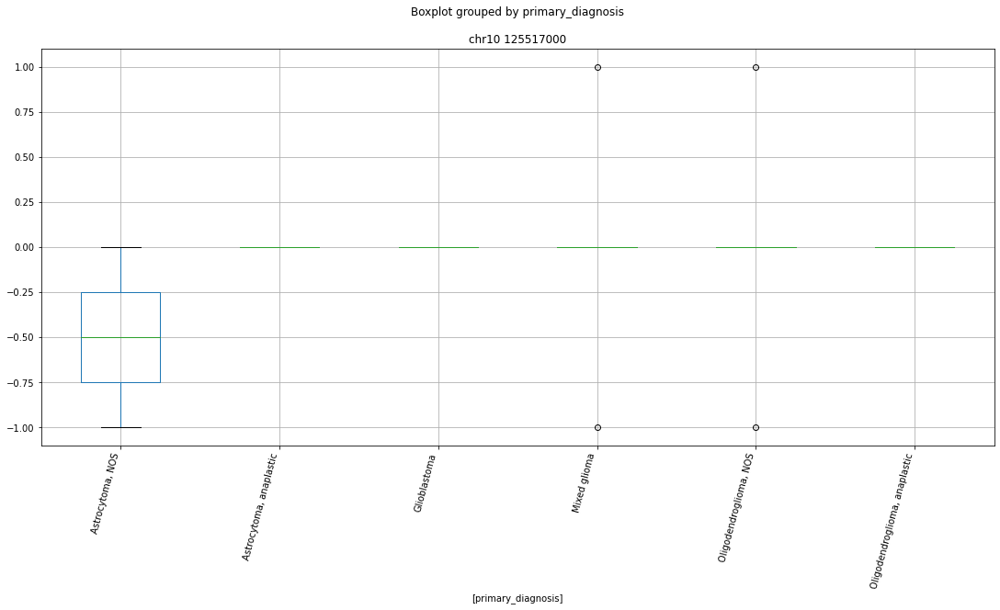

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr17 58454000


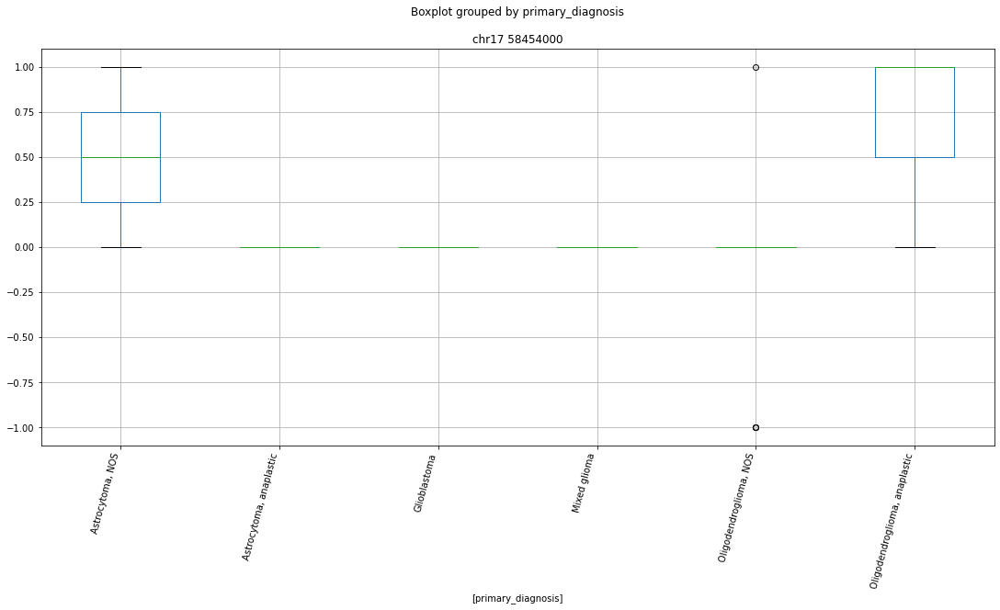

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr16 49211000


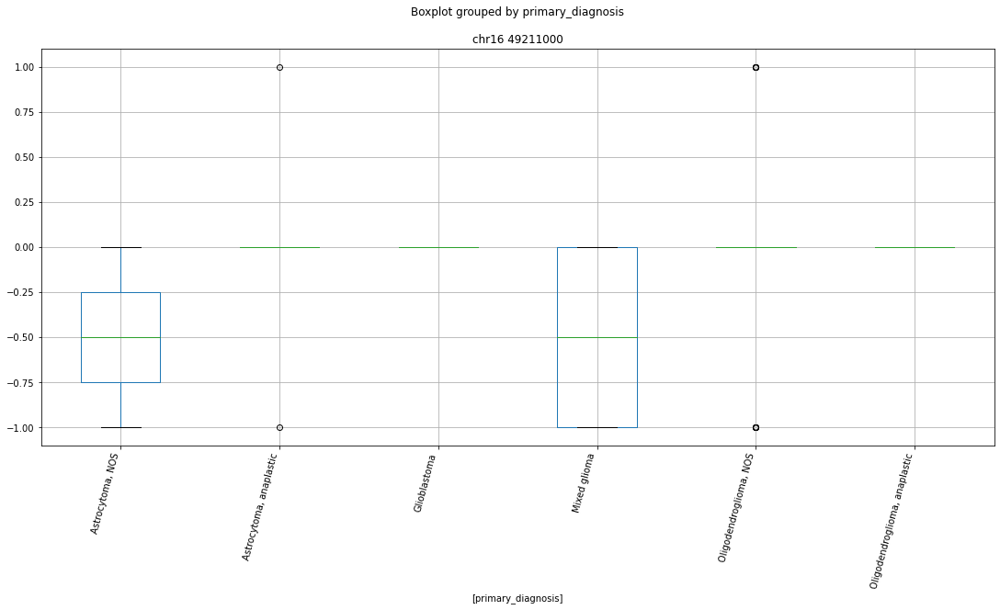

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 87079000


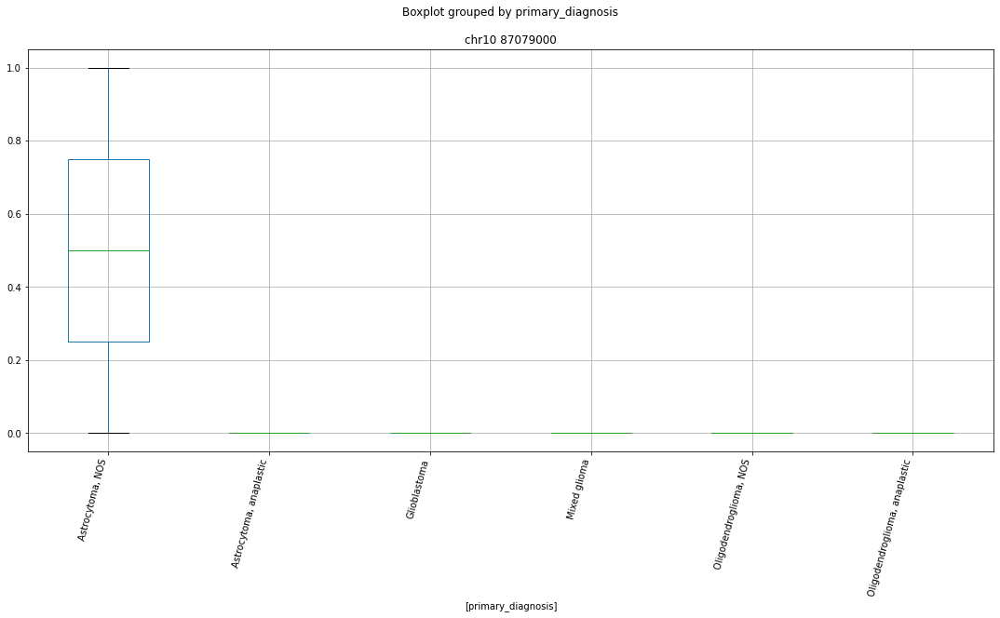

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr11 73937000


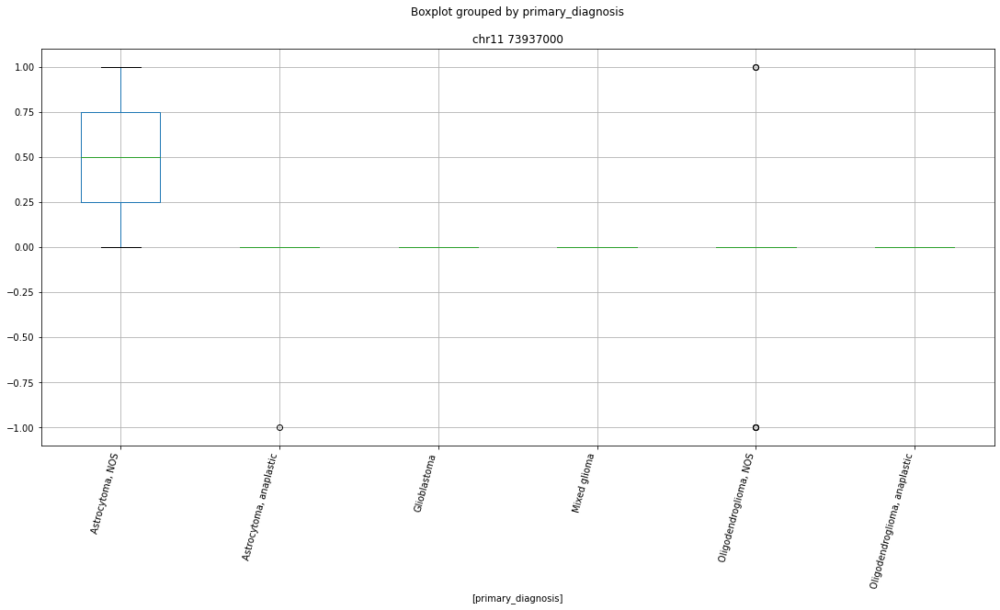

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr5 176433000


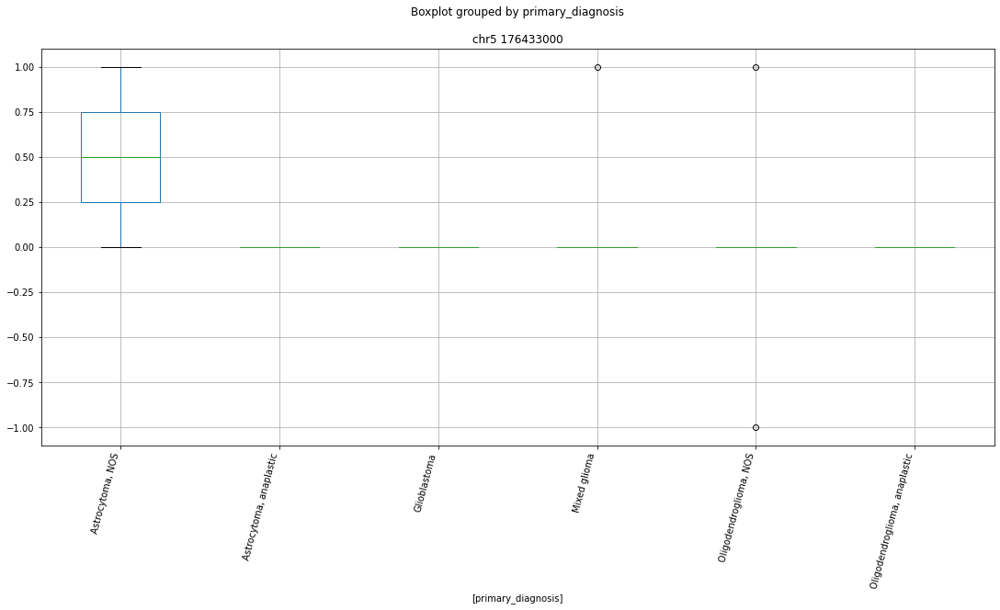

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chrX 74165000


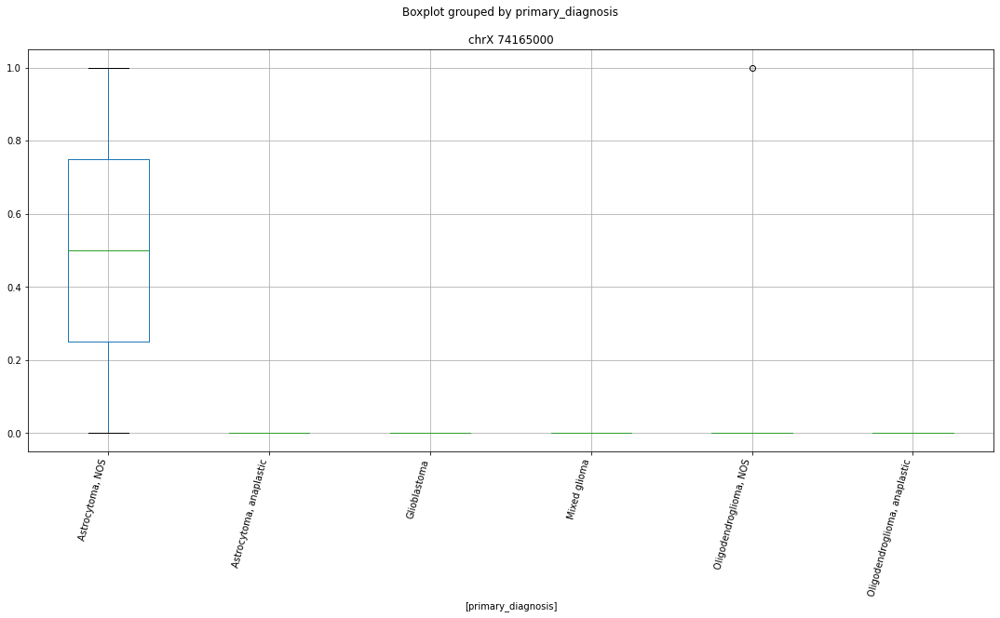

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr19 57482000


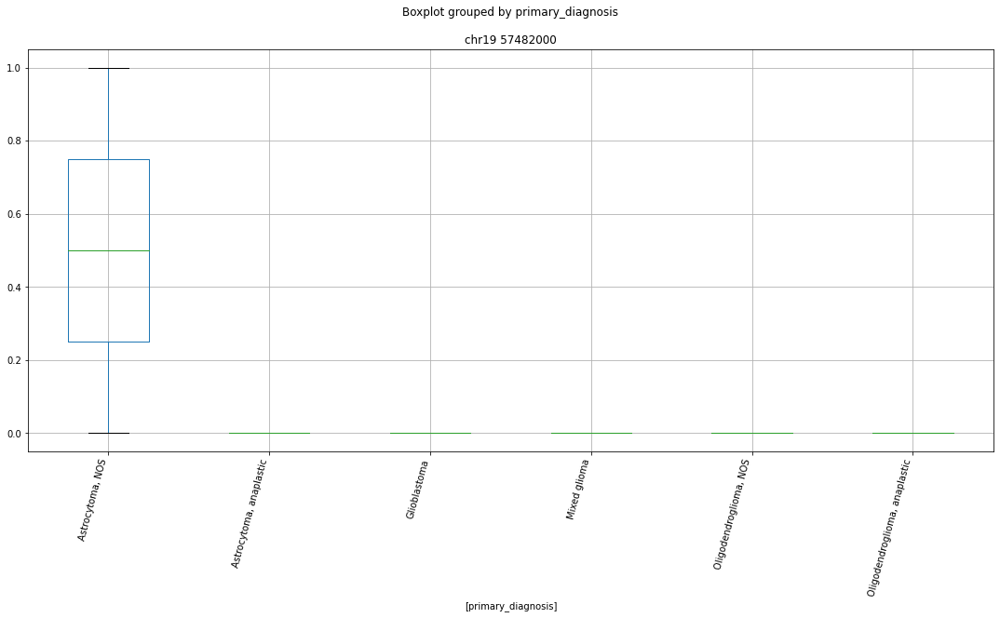

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 62947000


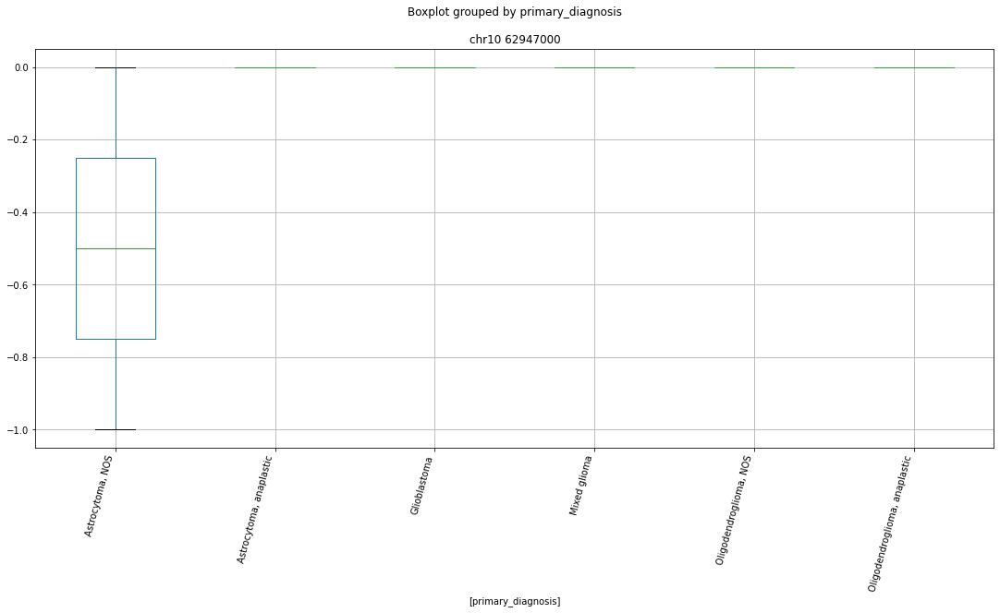

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 62946000


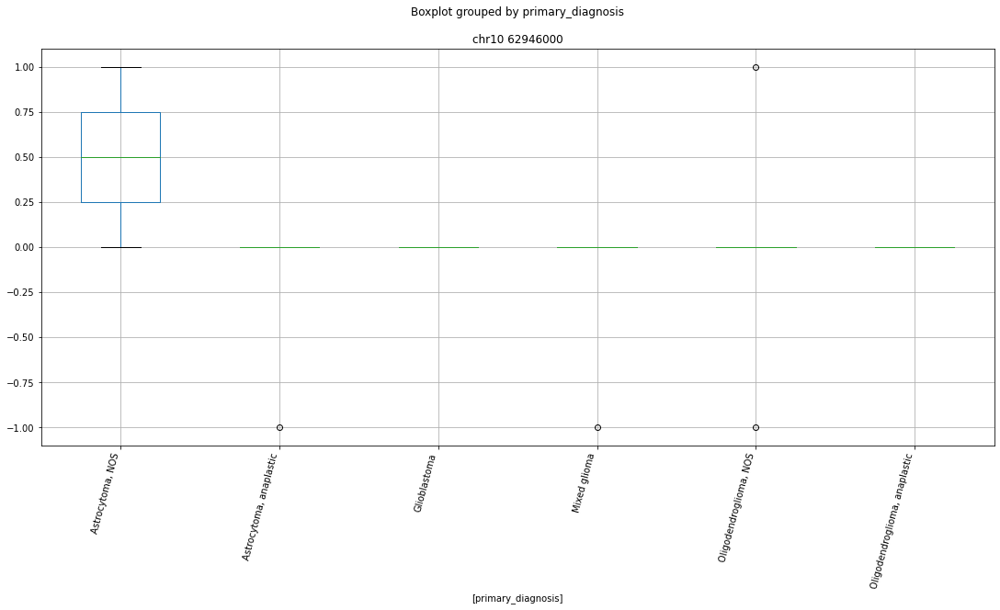

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr16 66630000


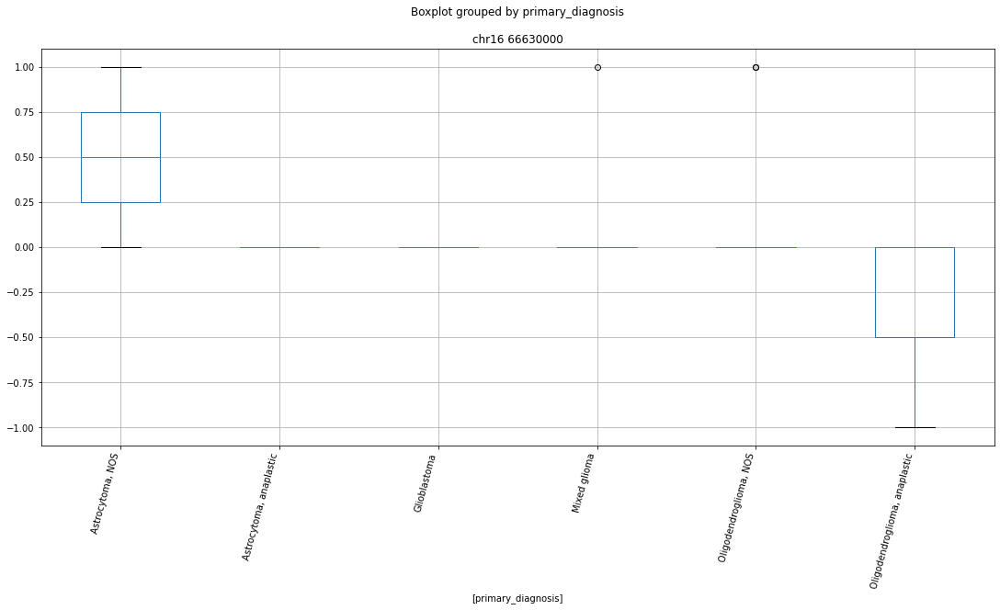

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr6 27825000


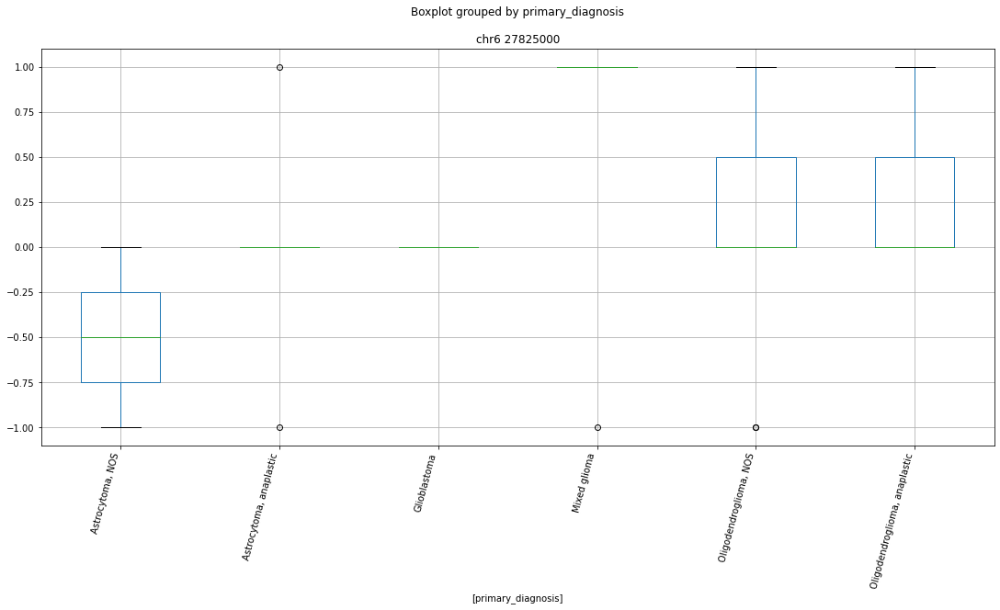

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr6 29932000


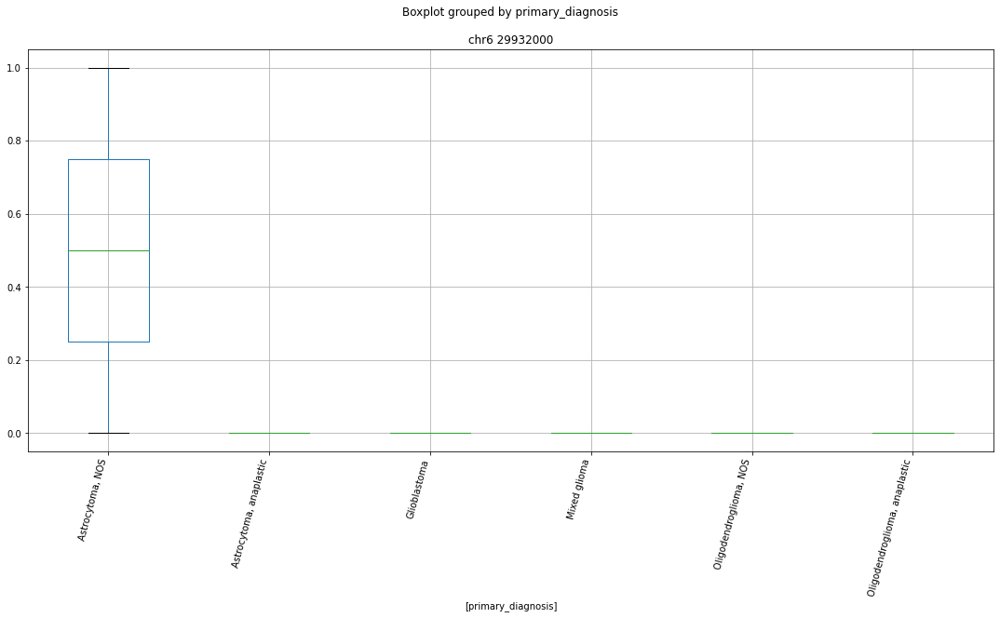

 p : 3.7659667851528006e-06  ( t : 5.425492320865619 ) :  chr20 33537000


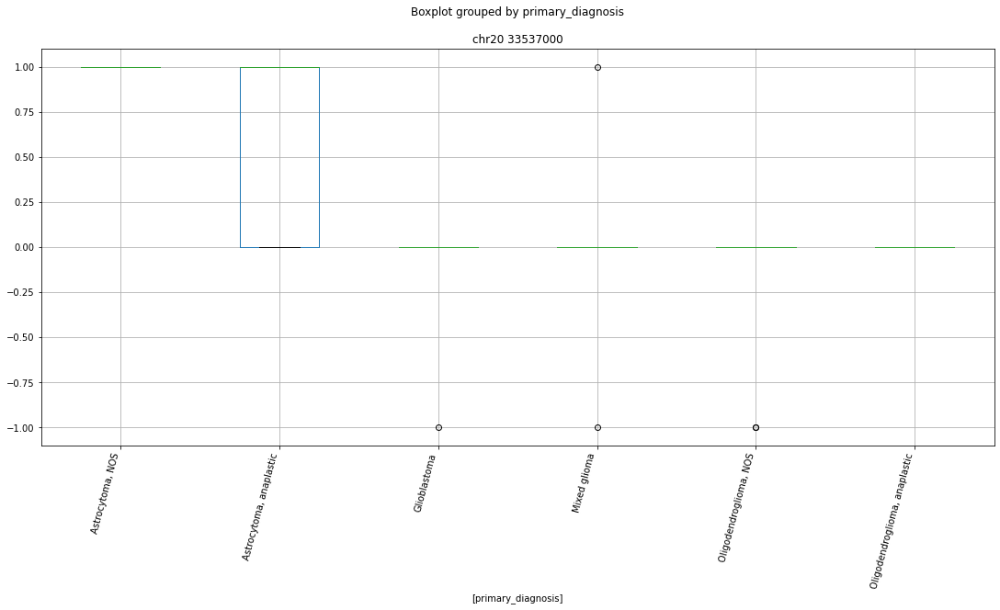

 p : 5.666698422800871e-06  ( t : 5.343591782201504 ) :  chr12 6191000


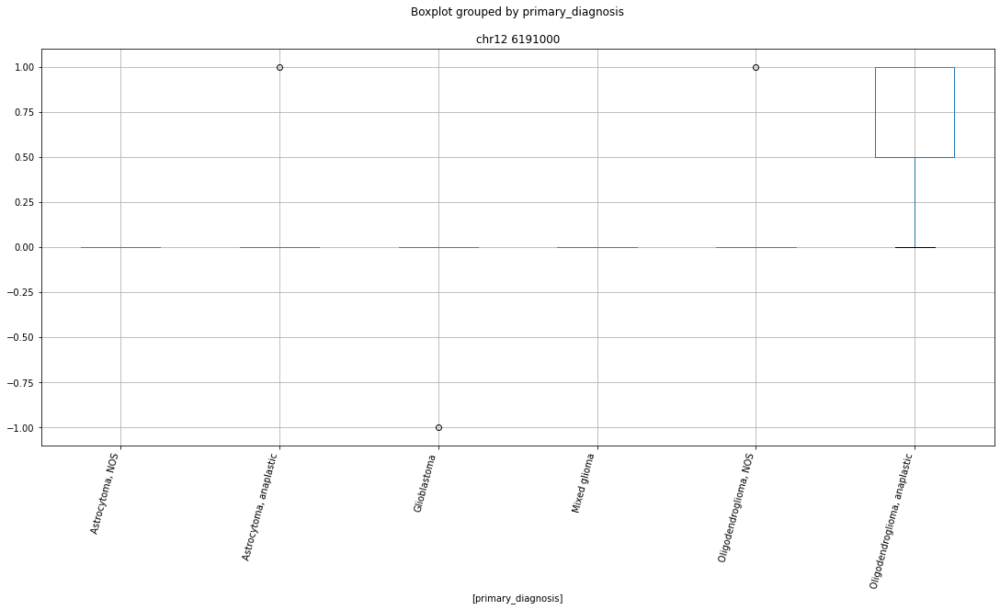

 p : 5.666698422800871e-06  ( t : 5.343591782201504 ) :  chr1 248830000


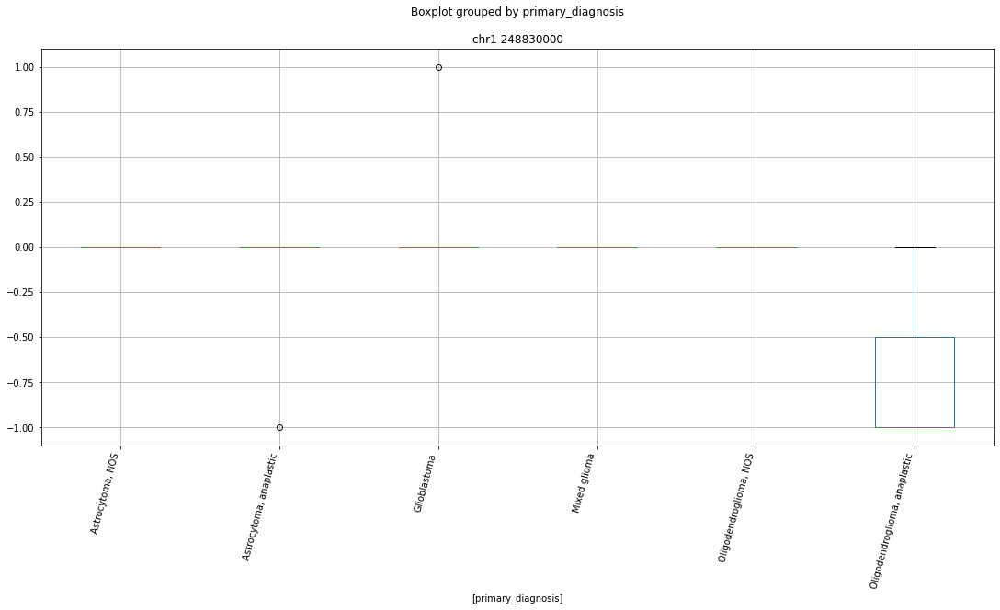

 p : 6.90433875888496e-06  ( t : 5.278485375788008 ) :  chr2 27541000


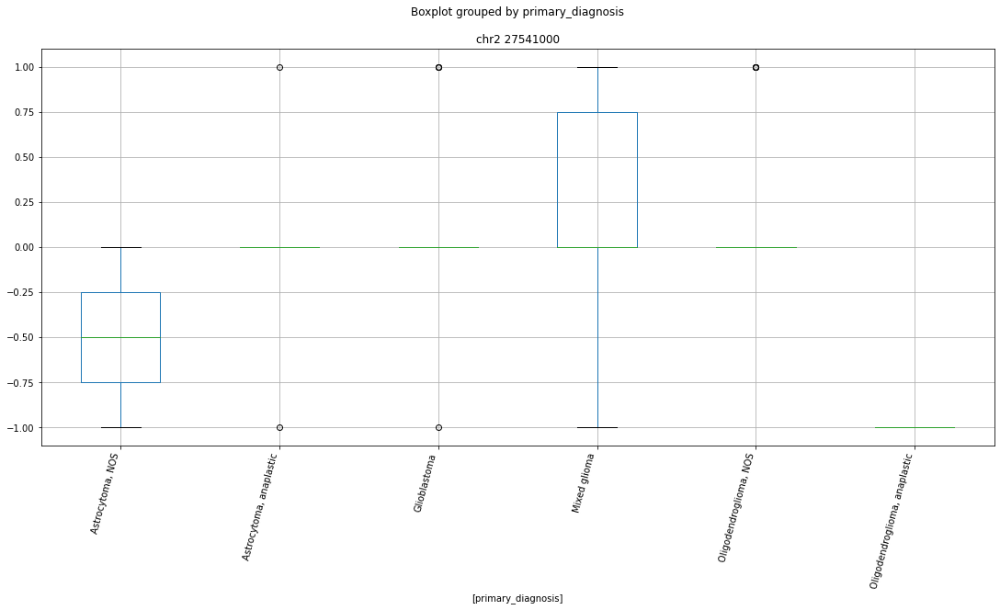

 p : 8.24240263376675e-06  ( t : 5.643239658755762 ) :  chr17 58143000


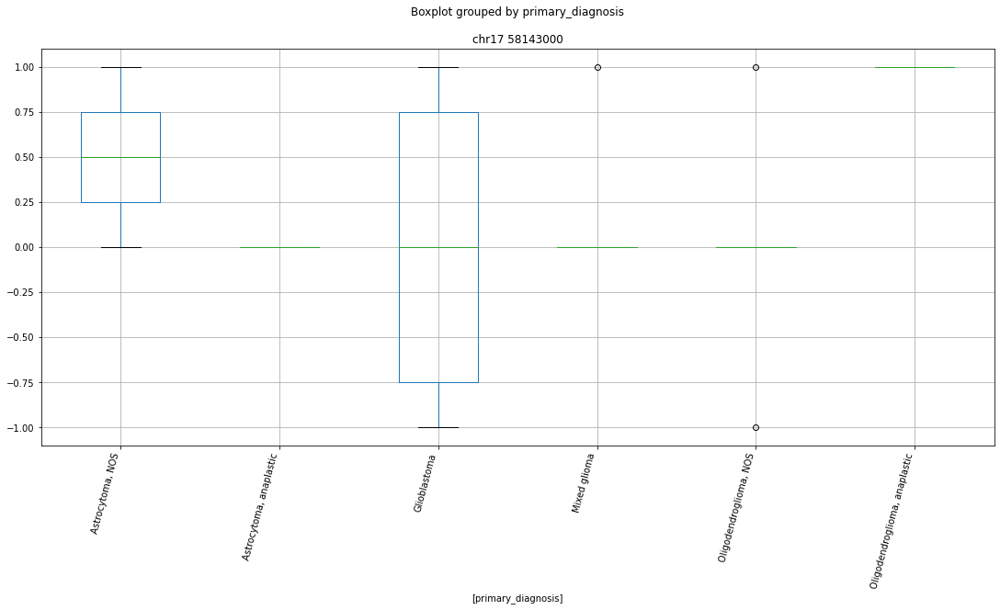

Clustermapping
['chr1 10427000' 'chr1 108490000' 'chr1 108676000' 'chr1 112641000'
 'chr1 114789000' 'chr1 114791000' 'chr1 143704000' 'chr1 145765000'
 'chr1 147062000' 'chr1 147734000' 'chr1 150782000' 'chr1 150851000'
 'chr1 151768000' 'chr1 152145000' 'chr1 152195000' 'chr1 152197000'
 'chr1 152255000' 'chr1 152471000' 'chr1 156182000' 'chr1 156328000'
 'chr1 159449000' 'chr1 160913000' 'chr1 160936000' 'chr1 161280000'
 'chr1 162465000' 'chr1 163545000' 'chr1 167030000' 'chr1 168207000'
 'chr1 168208000' 'chr1 171694000' 'chr1 176058000' 'chr1 179039000'
 'chr1 179041000' 'chr1 179417000' 'chr1 179419000' 'chr1 182440000'
 'chr1 189226000' 'chr1 192858000' 'chr1 202691000' 'chr1 202739000'
 'chr1 203266000' 'chr1 203841000' 'chr1 203918000' 'chr1 206065000'
 'chr1 211198000' 'chr1 213153000' 'chr1 217523000' 'chr1 219544000'
 'chr1 220467000' 'chr1 22159000' 'chr1 222486000' 'chr1 224100000'
 'chr1 226114000' 'chr1 231127000' 'chr1 231453000' 'chr1 235310000'
 'chr1 236385000' 'ch

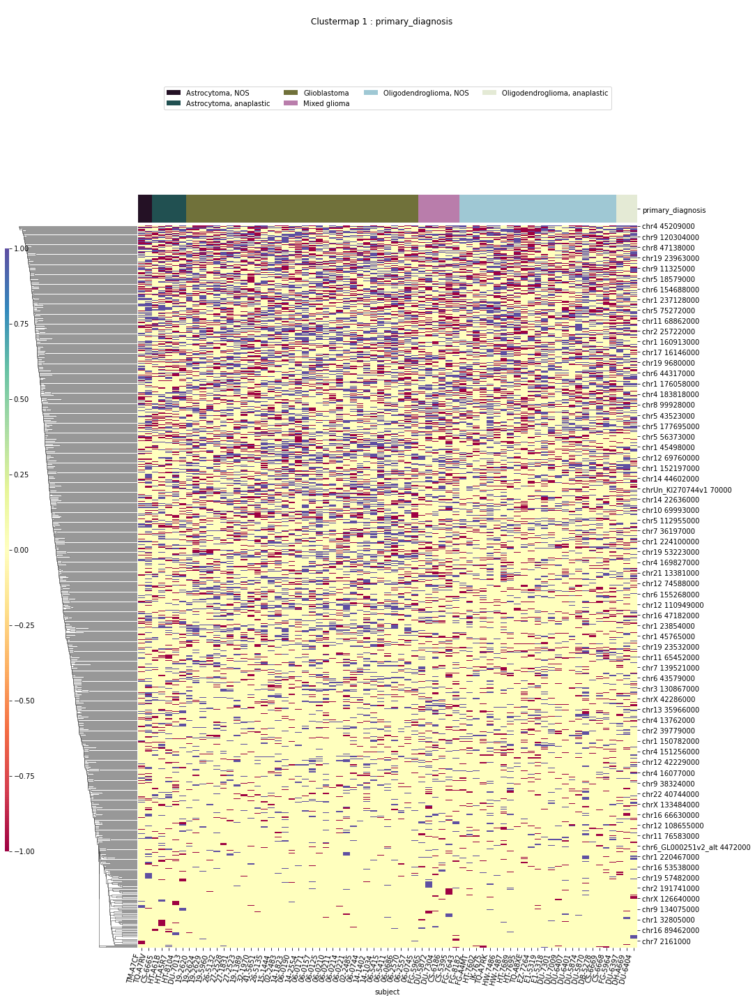

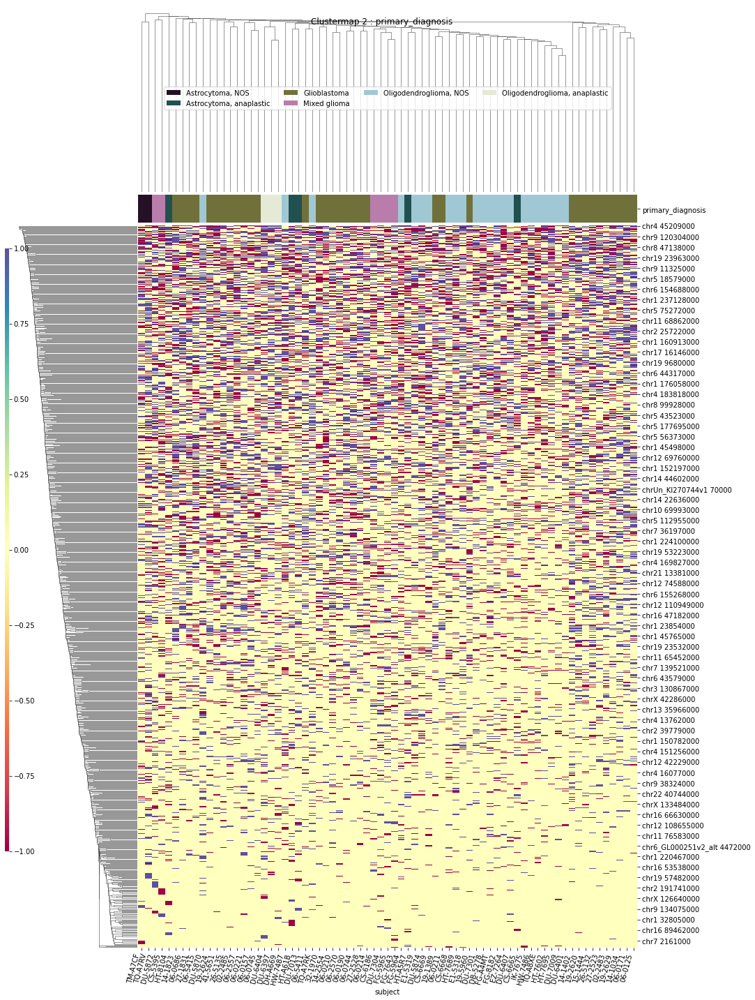

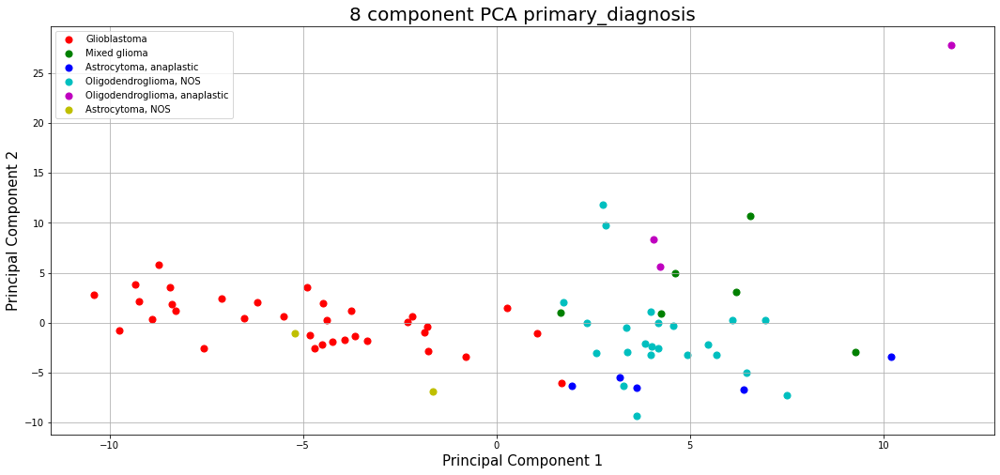

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 152195000' 'chr1 155835000' 'chr1 167771000' 'chr1 183427000'
 'chr1 202451000' 'chr1 211198000' 'chr1 234268000' 'chr1 236427000'
 'chr1 247521000' 'chr1 27829000' 'chr1 34948000' 'chr1 45107000'
 'chr1 45765000' 'chr1 48384000' 'chr1 52870000' 'chr1 6714000'
 'chr1 86900000' 'chr1 99824000' 'chr10 102036000' 'chr10 104785000'
 'chr10 119181000' 'chr10 120399000' 'chr10 12523000' 'chr10 130628000'
 'chr10 32499000' 'chr10 43244000' 'chr10 43464000' 'chr10 45513000'
 'chr10 62928000' 'chr10 62949000' 'chr10 6824000' 'chr10 69992000'
 'chr10 70632000' 'chr10 80535000' 'chr10 91322000' 'chr10 9274000'
 'chr10 99892000' 'chr10_GL383546v1_alt 175000' 'chr11 112664000'
 'chr11 60452000' 'chr11 65762000' 'chr11 72503000' 'chr11 79499000'
 'chr11 92158000' 'chr11 95481000' 'chr12 111508000' 'chr12 19092000'
 'chr12 48725000' 'chr12 48915000' 'chr12 56965000' 'chr12 73853000'
 'chr13 51078000' 'chr13 52080000' 'chr13 76295000' 'chr13 879750

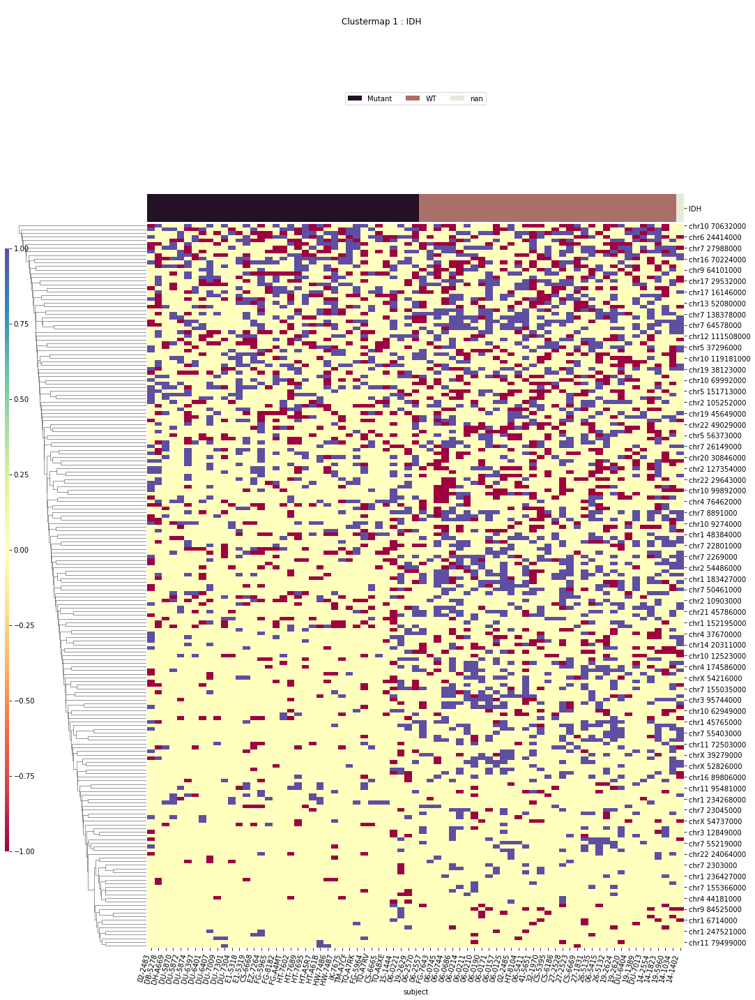

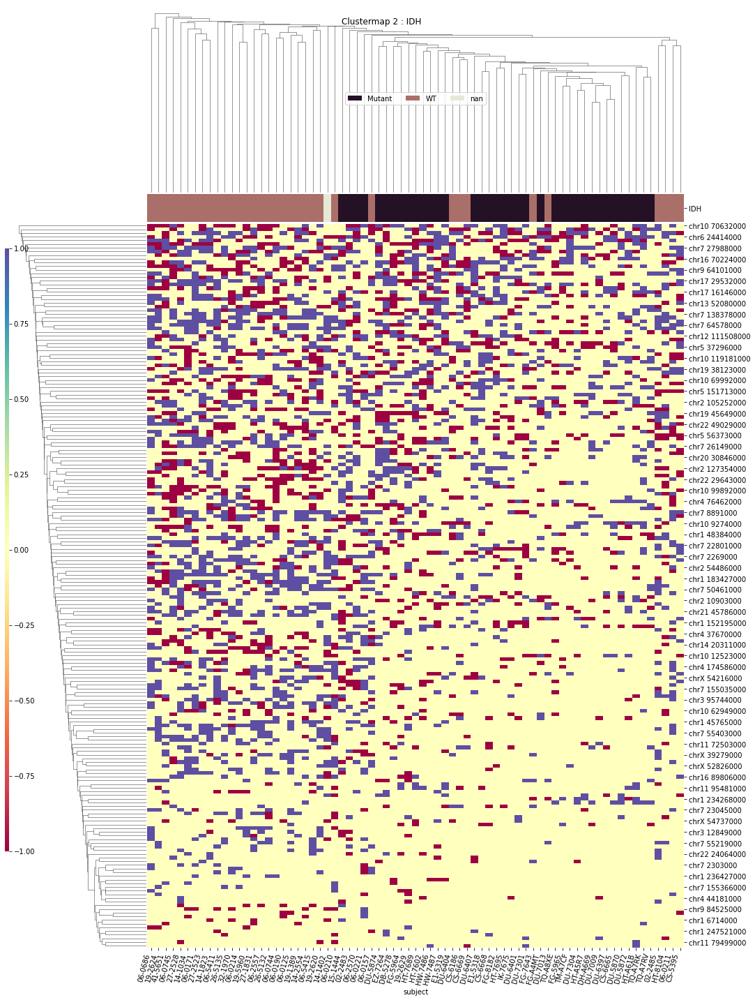

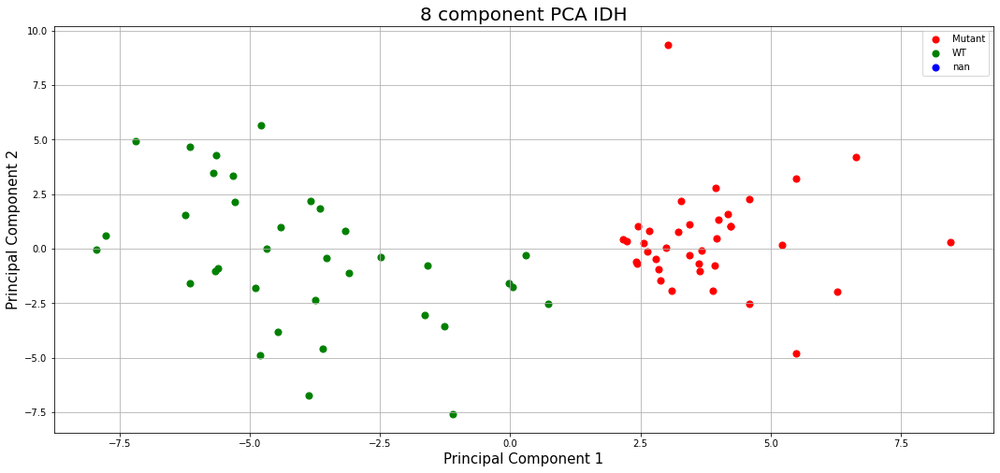

x1p19q
T-Testing
Boxplotting
 p : 4.547285146183342e-07  ( t : 5.5546599515019 ) :  chr14 31438000


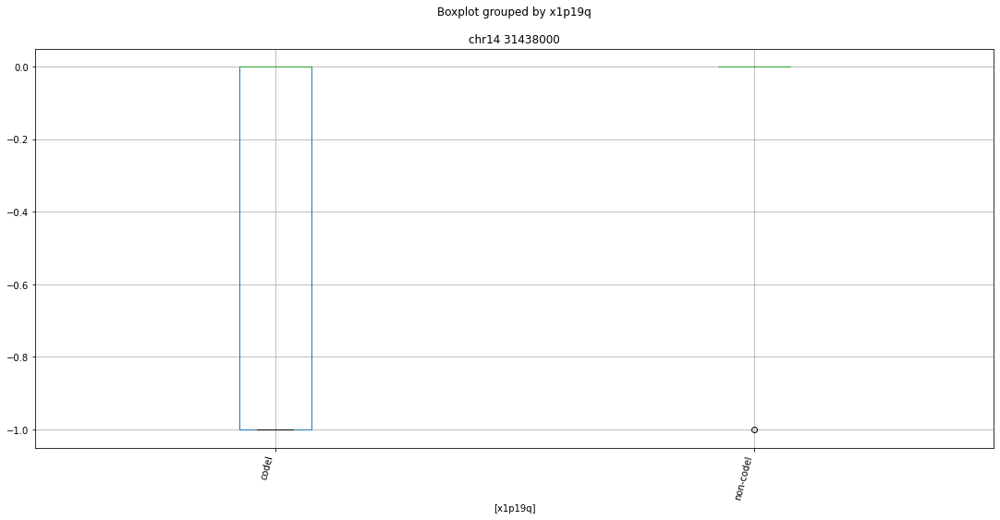

 p : 8.816137417298711e-06  ( t : 4.790973247424185 ) :  chr17 3853000


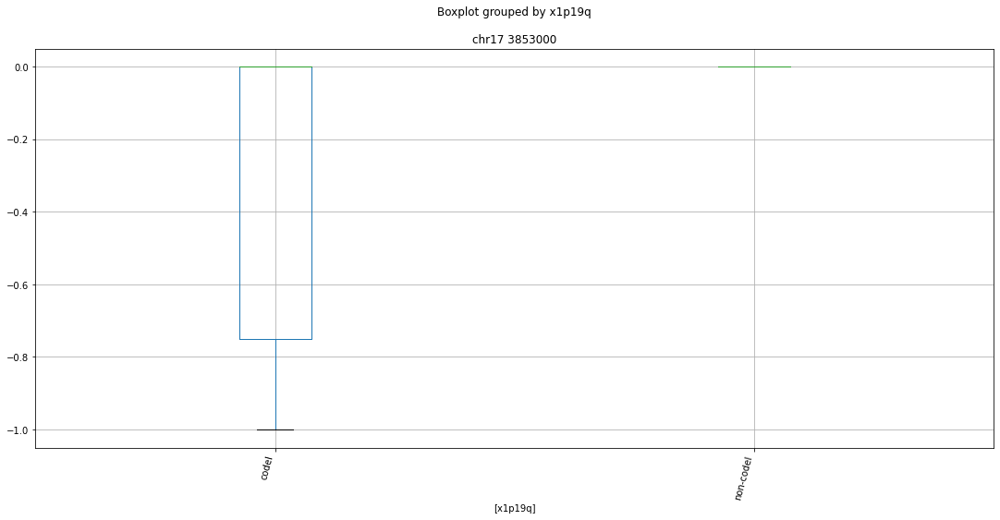

Clustermapping
['chr1 114791000' 'chr1 12042000' 'chr1 147232000' 'chr1 161615000'
 'chr1 225616000' 'chr1 235080000' 'chr1 23689000' 'chr1 26804000'
 'chr1 27829000' 'chr1 31177000' 'chr1 32803000' 'chr1 33510000'
 'chr1 34967000' 'chr1 39999000' 'chr1 43501000' 'chr1 45107000'
 'chr1 46321000' 'chr1 64202000' 'chr1 71379000' 'chr1 77871000'
 'chr1 92025000' 'chr1 96761000' 'chr1 98513000' 'chr1 99079000'
 'chr10 100092000' 'chr10 126994000' 'chr10 17886000' 'chr10 28934000'
 'chr10 29928000' 'chr10 34975000' 'chr10 49724000' 'chr10 62928000'
 'chr10 68280000' 'chr10 91322000' 'chr10 9854000'
 'chr10_GL383546v1_alt 175000' 'chr11 116348000' 'chr11 2331000'
 'chr11 29724000' 'chr11 32734000' 'chr11 33987000' 'chr11 5105000'
 'chr11 57944000' 'chr11 65763000' 'chr11 71166000' 'chr11 71168000'
 'chr11 77099000' 'chr12 102088000' 'chr12 110951000' 'chr12 111508000'
 'chr12 43684000' 'chr12 46001000' 'chr12 49282000' 'chr12 57508000'
 'chr12 74588000' 'chr12 8624000' 'chr12 95908000' 'chr1

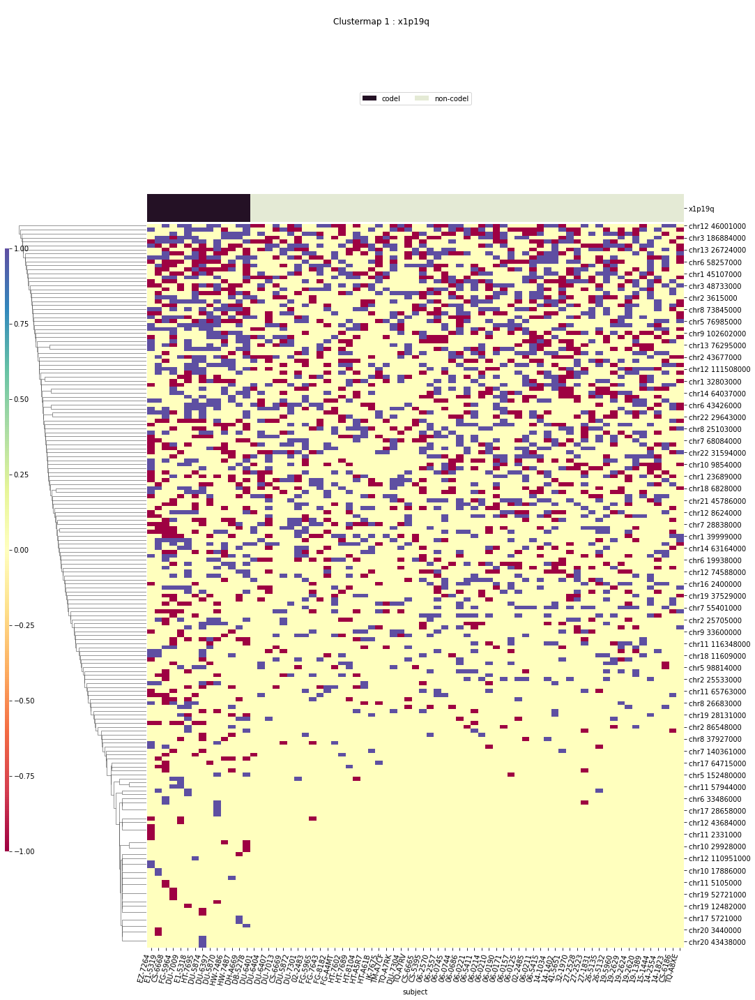

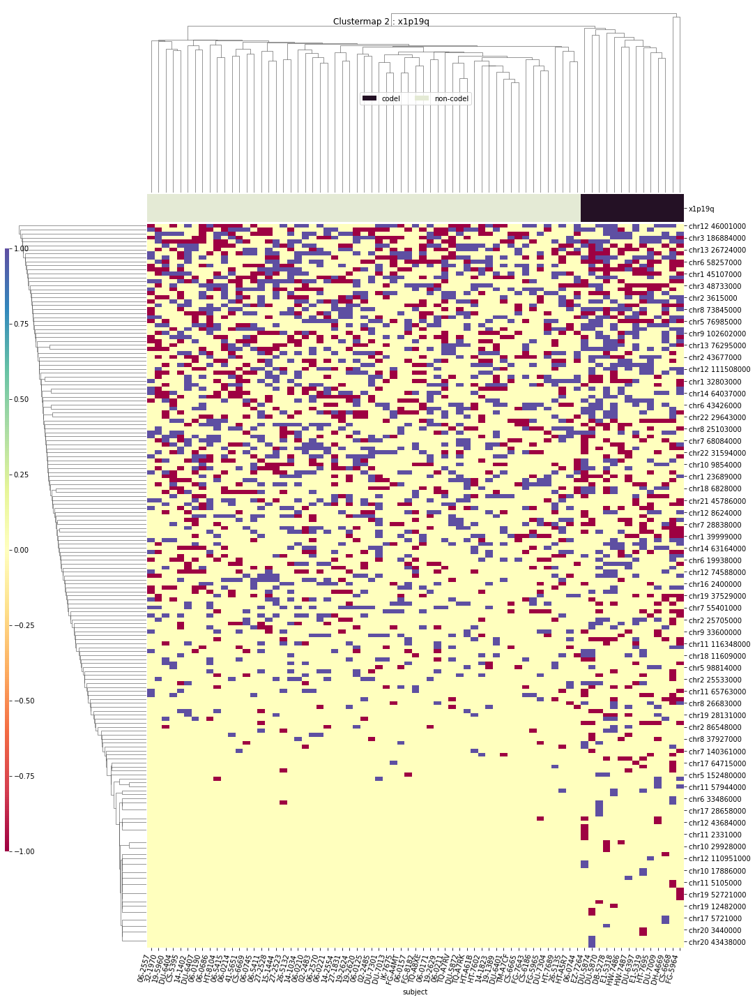

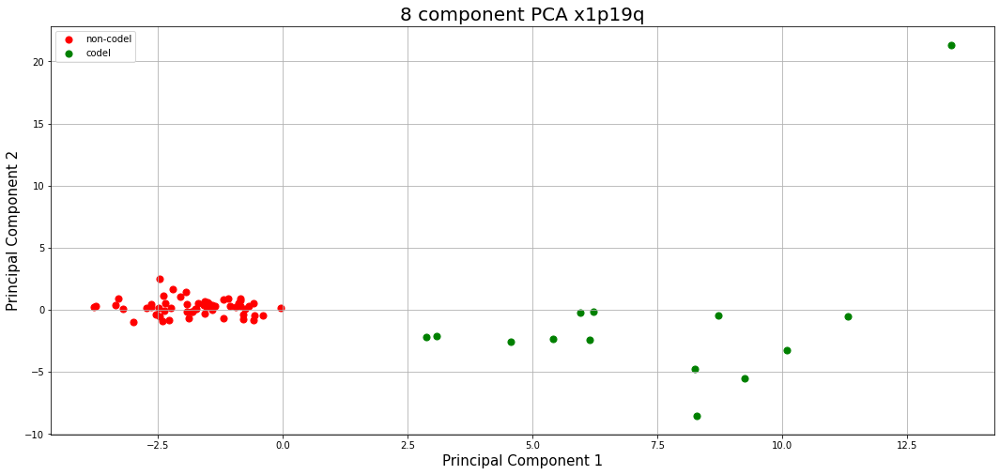

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 10427000' 'chr1 12042000' 'chr1 150780000' 'chr1 155835000'
 'chr1 156182000' 'chr1 183427000' 'chr1 202451000' 'chr1 203841000'
 'chr1 224100000' 'chr1 235310000' 'chr1 39914000' 'chr1 44875000'
 'chr1 50380000' 'chr1 99824000' 'chr10 125519000' 'chr10 126995000'
 'chr10 130628000' 'chr10 21836000' 'chr10 6205000' 'chr10 6824000'
 'chr10 71870000' 'chr10 75749000' 'chr10 8869000' 'chr10 9274000'
 'chr10 95808000' 'chr10 99892000' 'chr11 124402000' 'chr11 33987000'
 'chr11 65762000' 'chr11 67597000' 'chr11 75878000' 'chr11 82181000'
 'chr11 8524000' 'chr11 95483000' 'chr12 24673000' 'chr12 48725000'
 'chr12 54487000' 'chr12 73853000' 'chr12 75943000' 'chr13 25479000'
 'chr13 31999000' 'chr13 42965000' 'chr14 20085000' 'chr14 31438000'
 'chr14 34475000' 'chr14 35978000' 'chr14 45636000' 'chr14 73183000'
 'chr14 75924000' 'chr14 89505000' 'chr15 45292000' 'chr15 74729000'
 'chr15 83821000' 'chr16 47182000' 'chr16 66630000' 'chr16 70

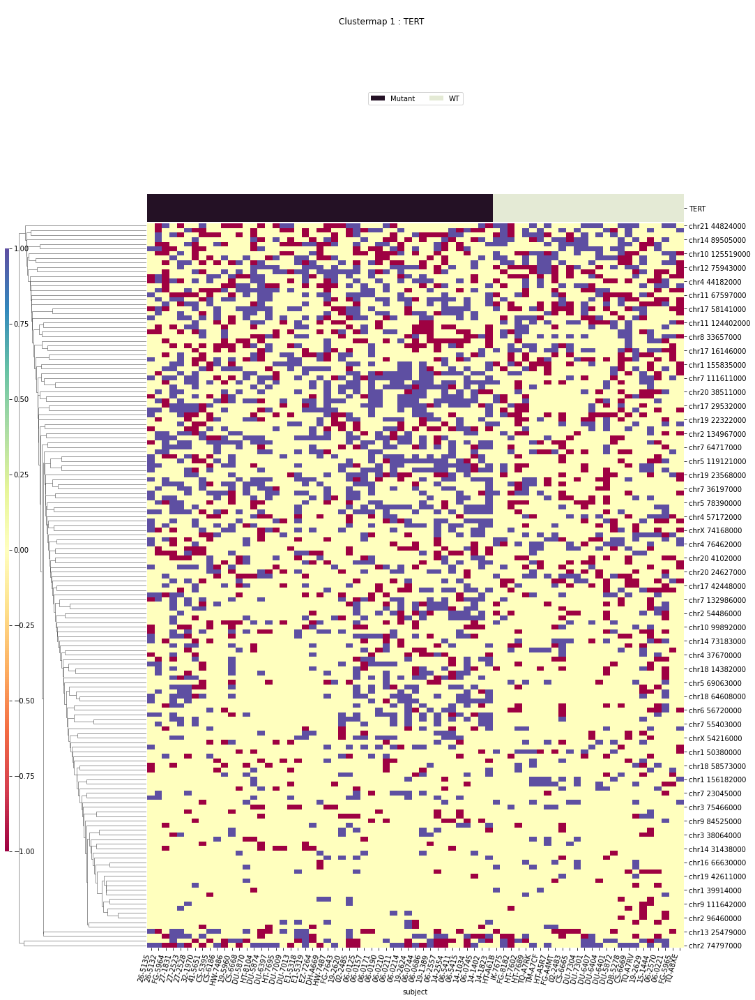

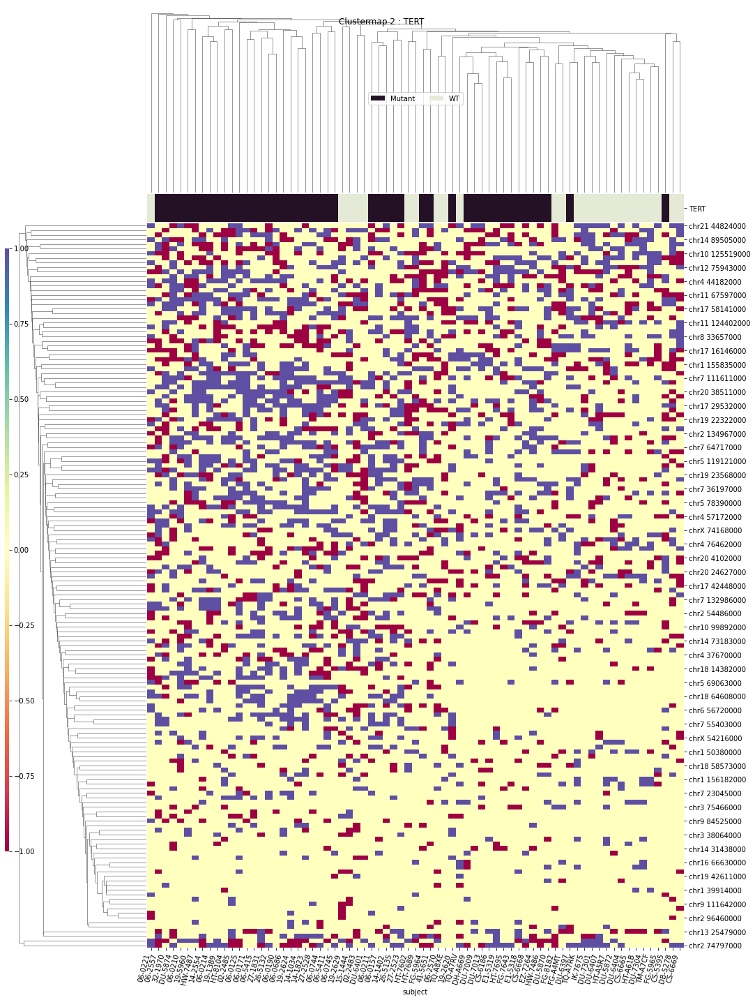

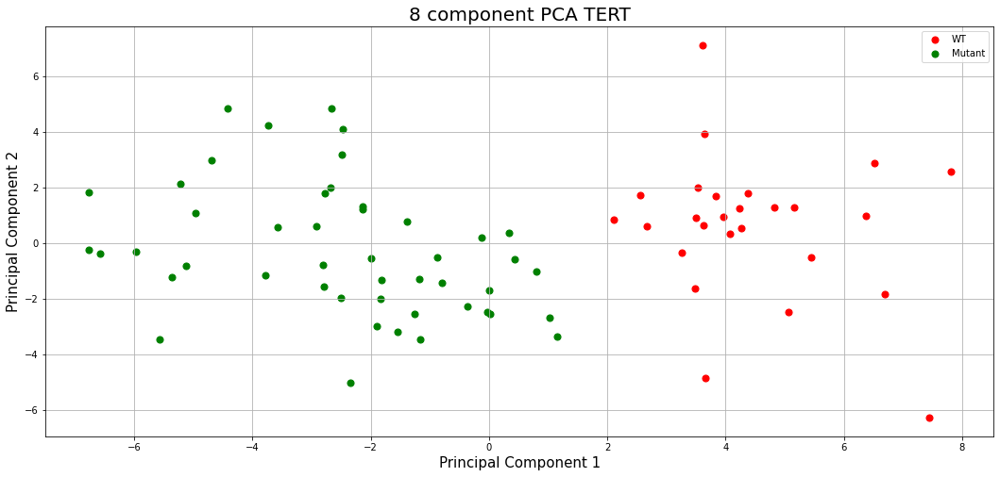

disease_type
T-Testing
Boxplotting
 p : 1.652686328606881e-07  ( t : 5.8066250935607115 ) :  chr7 55401000


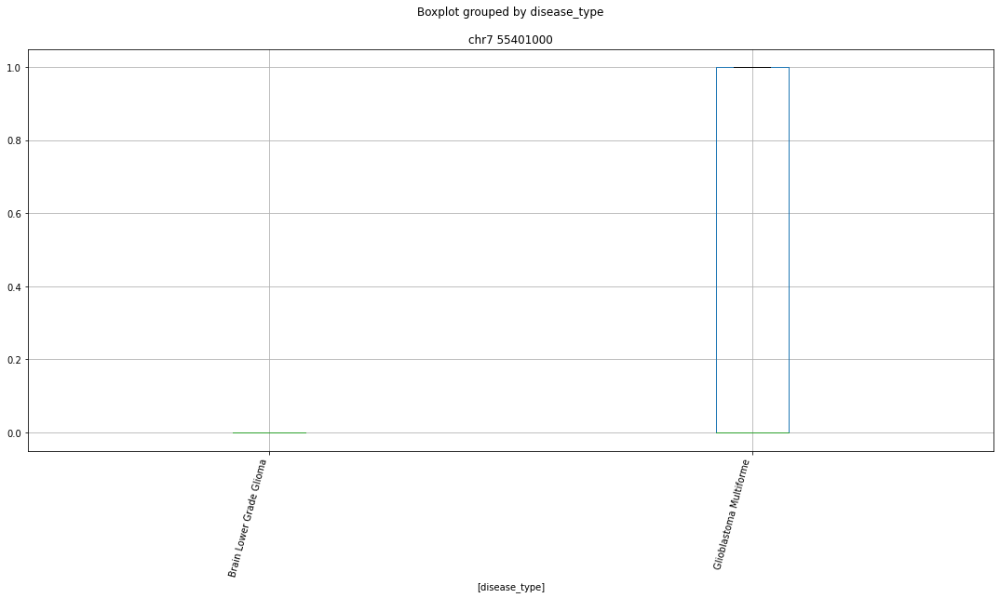

 p : 5.617054802366359e-07  ( t : 5.5015895074153 ) :  chr7 2269000


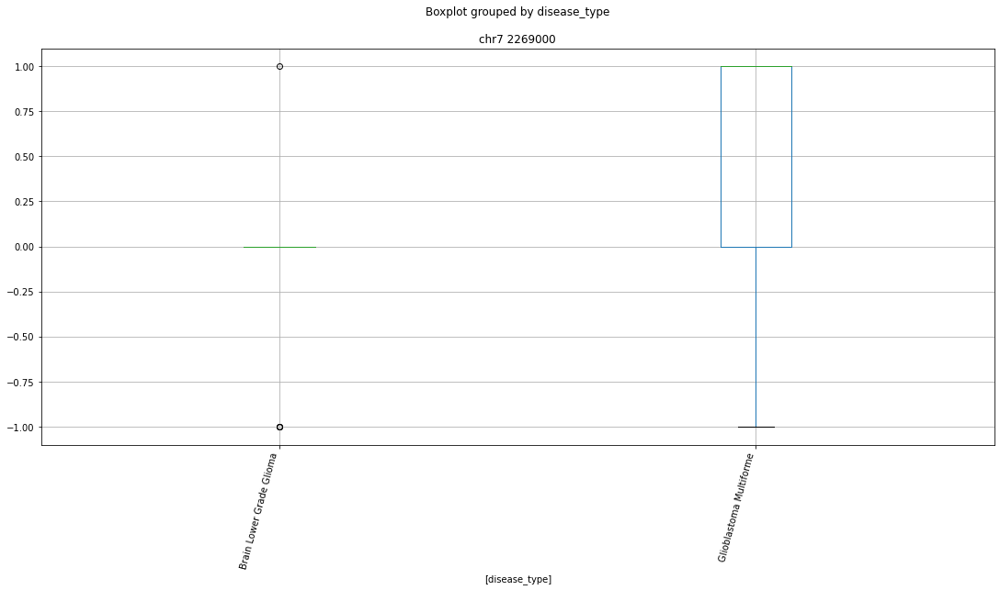

Clustermapping
['chr1 111607000' 'chr1 114789000' 'chr1 143704000' 'chr1 150782000'
 'chr1 152145000' 'chr1 160936000' 'chr1 161424000' 'chr1 168207000'
 'chr1 189226000' 'chr1 192858000' 'chr1 202451000' 'chr1 226114000'
 'chr1 236427000' 'chr1 237126000' 'chr1 23854000' 'chr1 247521000'
 'chr1 27829000' 'chr1 31177000' 'chr1 32803000' 'chr1 36760000'
 'chr1 42751000' 'chr1 45498000' 'chr1 45765000' 'chr1 64202000'
 'chr1 86898000' 'chr1 96470000' 'chr1 98511000' 'chr1 99824000'
 'chr10 118264000' 'chr10 120399000' 'chr10 130628000' 'chr10 133415000'
 'chr10 31978000' 'chr10 43445000' 'chr10 6824000' 'chr10 6992000'
 'chr10 70632000' 'chr10 71875000' 'chr10_GL383546v1_alt 175000'
 'chr11 112664000' 'chr11 116348000' 'chr11 4136000' 'chr11 60816000'
 'chr11 61165000' 'chr11 62277000' 'chr11 65762000' 'chr11 66589000'
 'chr11 72503000' 'chr11 76820000' 'chr11 79499000' 'chr12 100293000'
 'chr12 23925000' 'chr12 48843000' 'chr12 48915000' 'chr12 54487000'
 'chr12 56965000' 'chr12 5750600

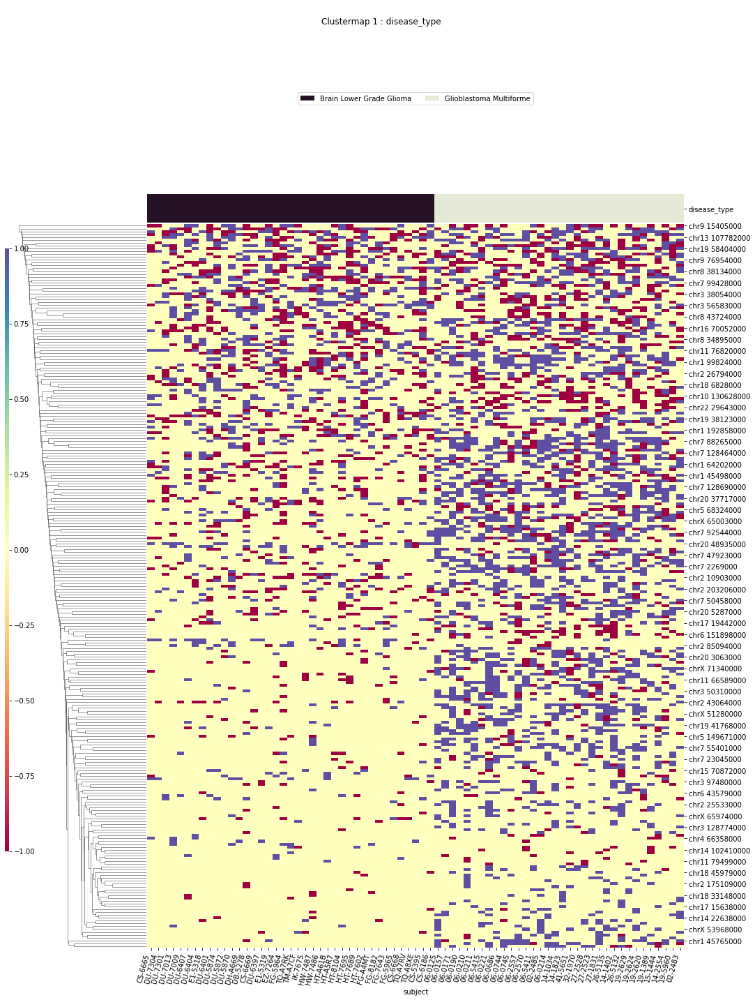

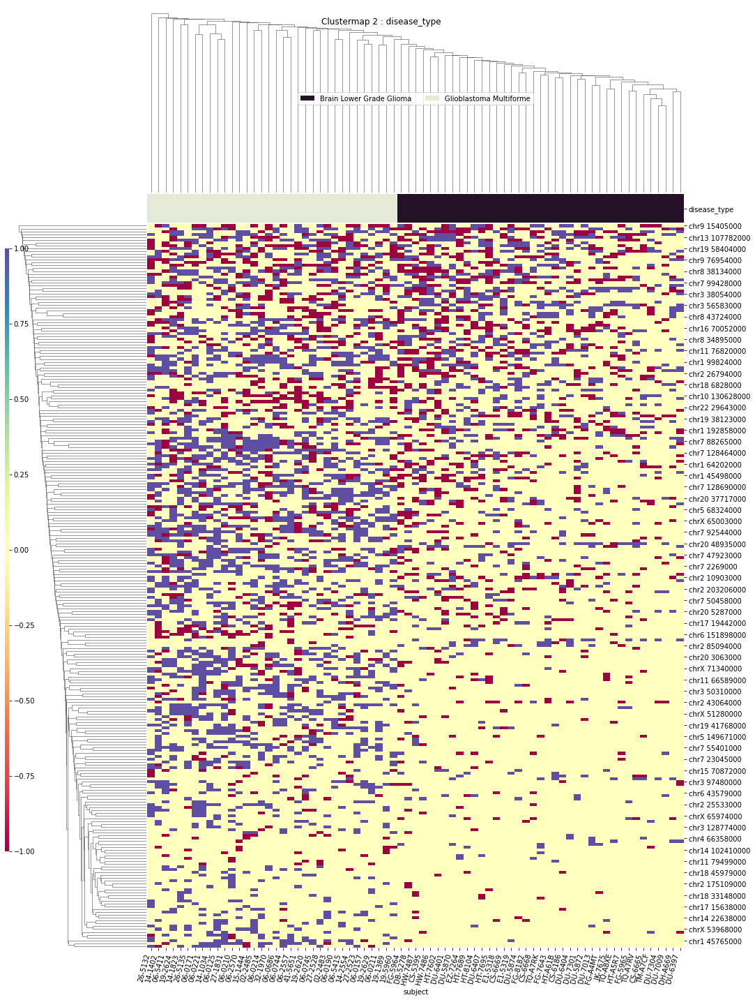

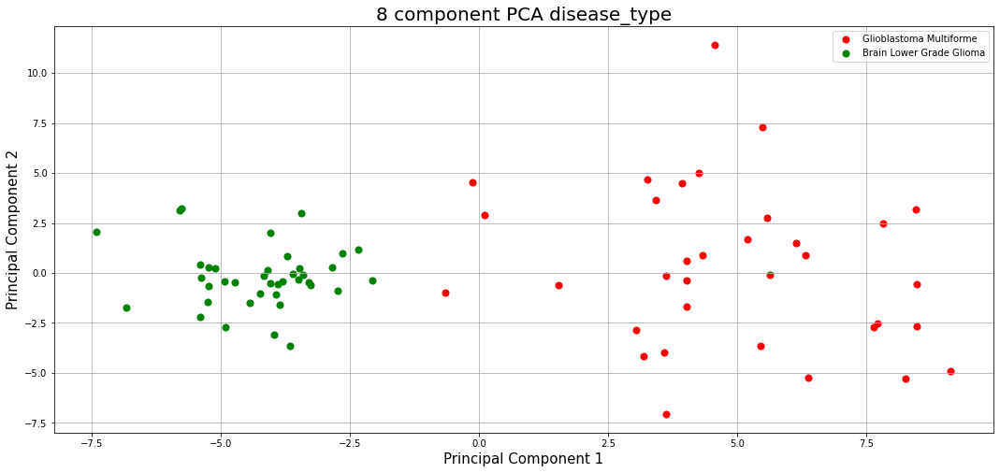

IDH_1p19q_status
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 10427000' 'chr1 114791000' 'chr1 12042000'
 'chr1 151768000' 'chr1 151770000' 'chr1 152195000' 'chr1 155835000'
 'chr1 156182000' 'chr1 182742000' 'chr1 183427000' 'chr1 202451000'
 'chr1 203841000' 'chr1 211198000' 'chr1 217524000' 'chr1 225616000'
 'chr1 234268000' 'chr1 235080000' 'chr1 23689000' 'chr1 27829000'
 'chr1 31177000' 'chr1 33510000' 'chr1 34967000' 'chr1 39999000'
 'chr1 43501000' 'chr1 45107000' 'chr1 45739000' 'chr1 46321000'
 'chr1 48384000' 'chr1 64202000' 'chr1 71379000' 'chr1 77871000'
 'chr1 86900000' 'chr1 92025000' 'chr1 96761000' 'chr1 98513000'
 'chr1 99079000' 'chr1 99824000' 'chr10 102036000' 'chr10 104785000'
 'chr10 118264000' 'chr10 119181000' 'chr10 12523000' 'chr10 126994000'
 'chr10 126995000' 'chr10 130628000' 'chr10 28934000' 'chr10 32499000'
 'chr10 34975000' 'chr10 43244000' 'chr10 43464000' 'chr10 45513000'
 'chr10 6205000' 'chr10 62928000' 'chr10 6824000' 'chr10 68280000'
 'chr10 69992000' 'chr

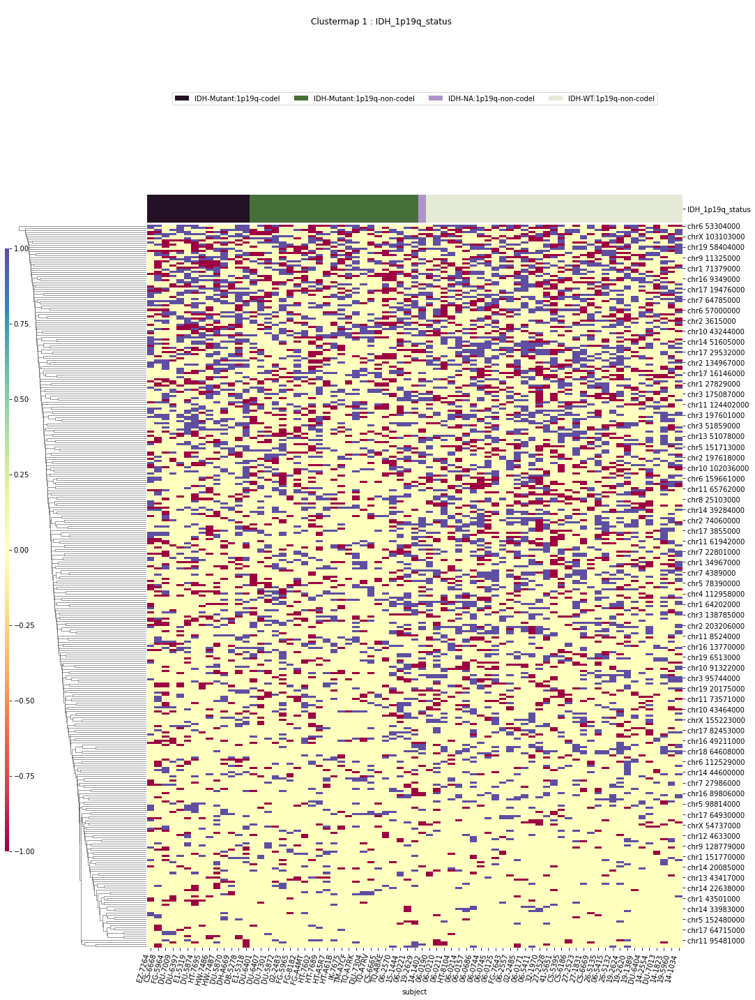

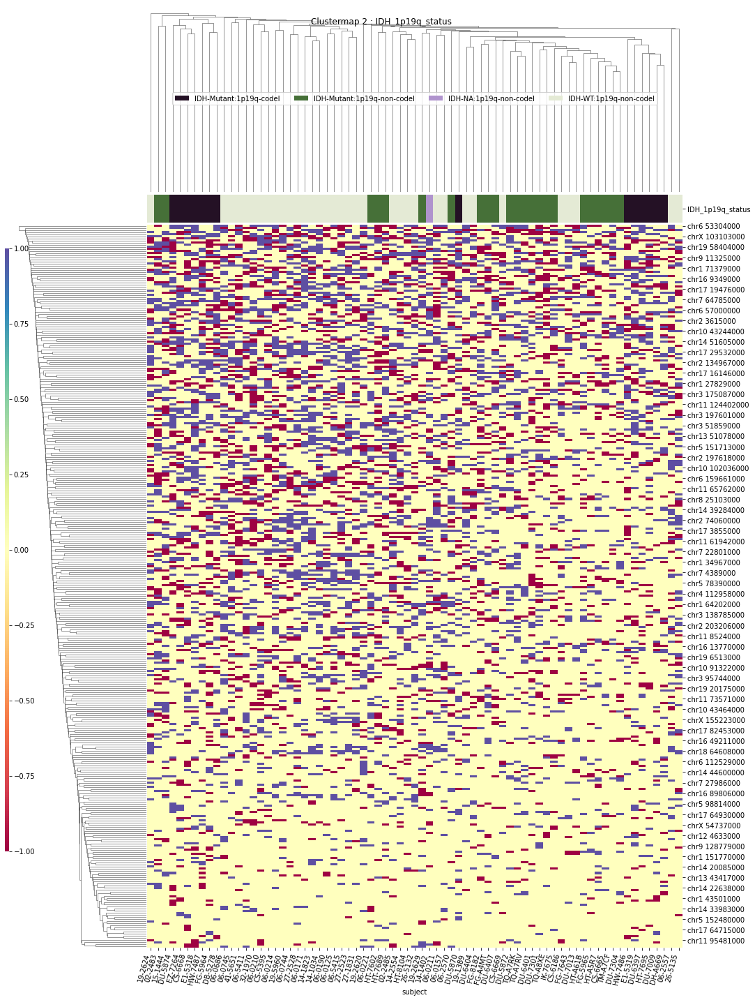

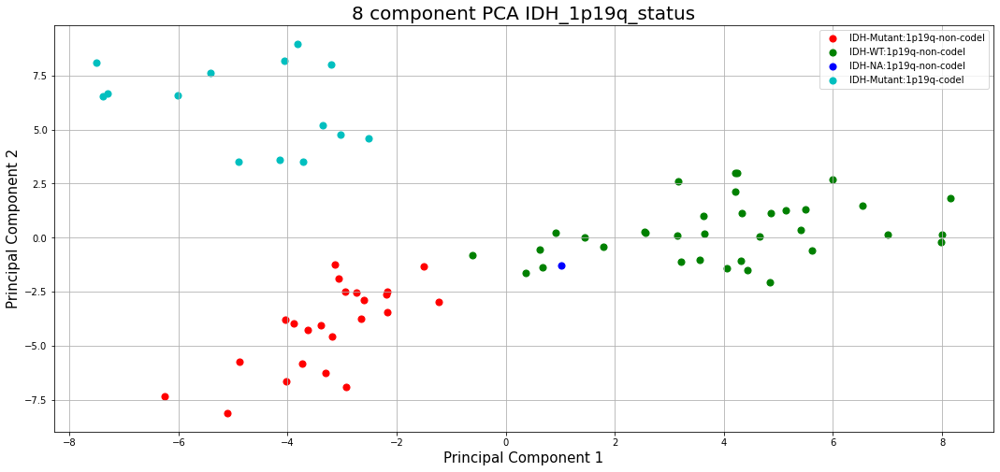

WHO_groups
T-Testing
Boxplotting
 p : 2.6316857449143274e-08  ( t : 7.625169498217283 ) :  chr17 27033000


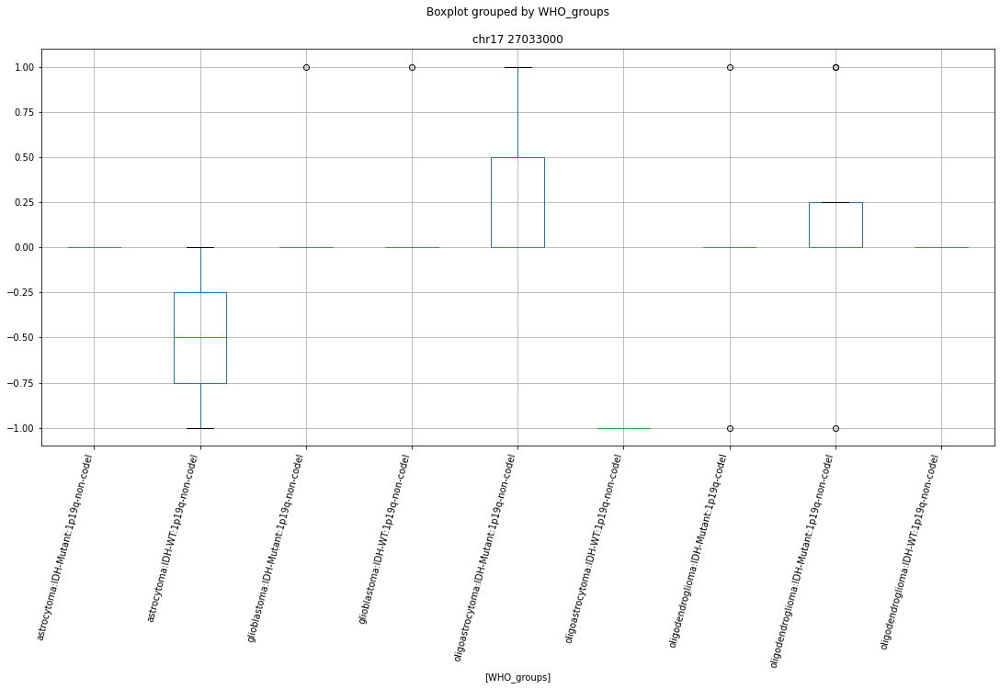

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr6 27825000


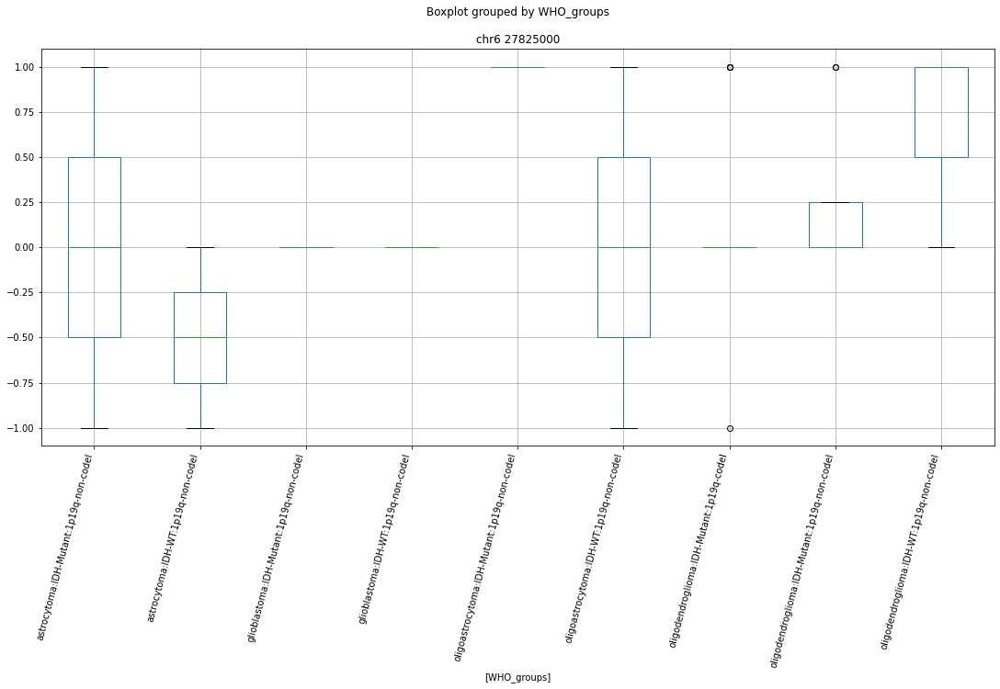

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr16 24110000


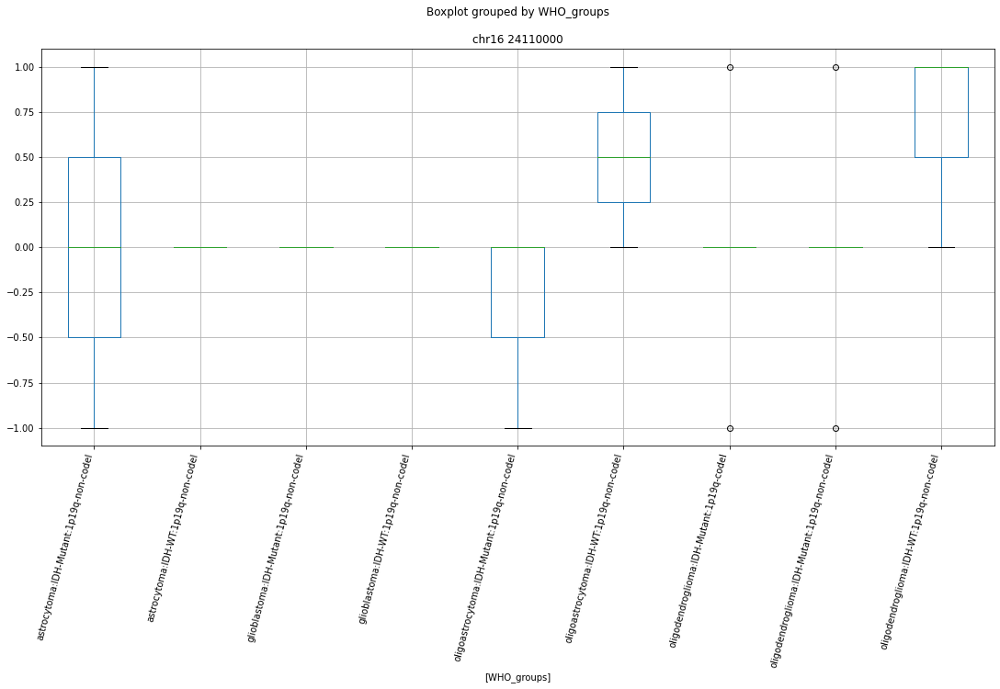

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr1 6306000


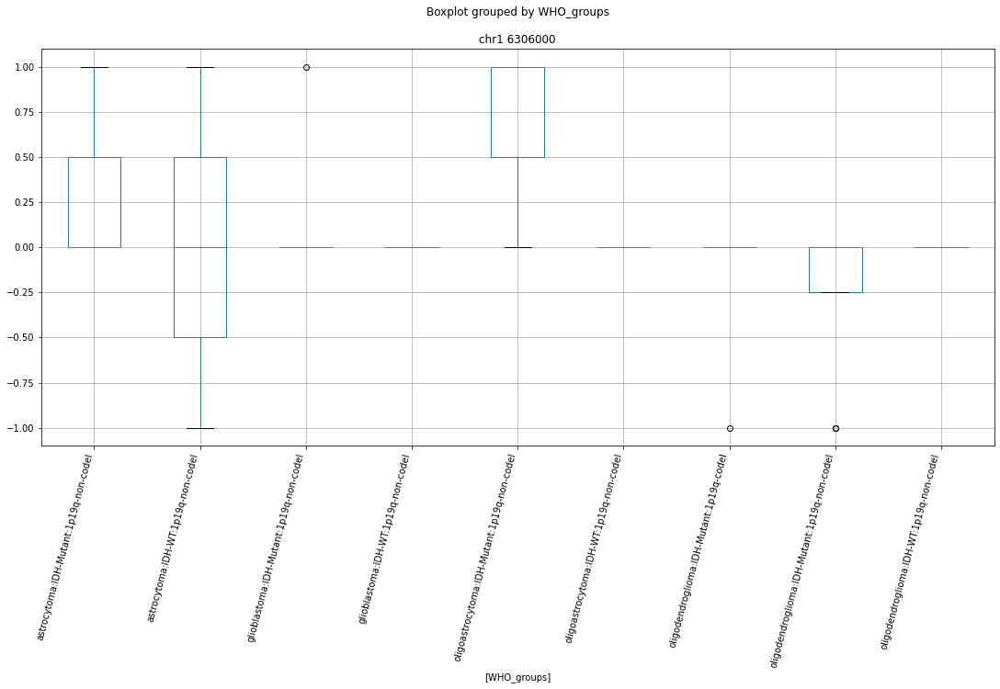

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr7 99426000


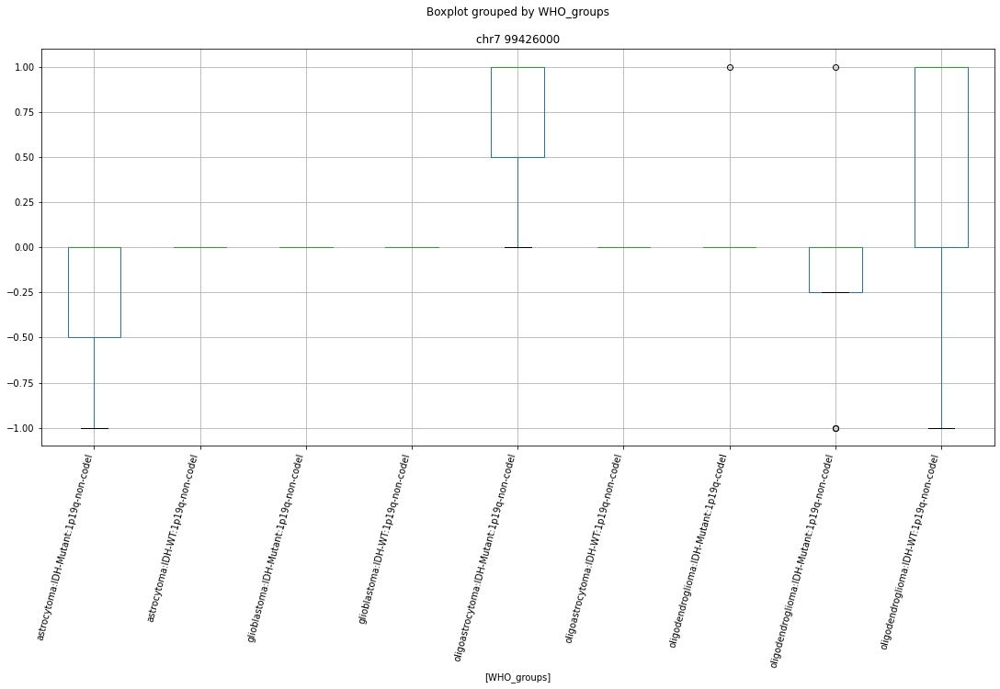

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr16 49211000


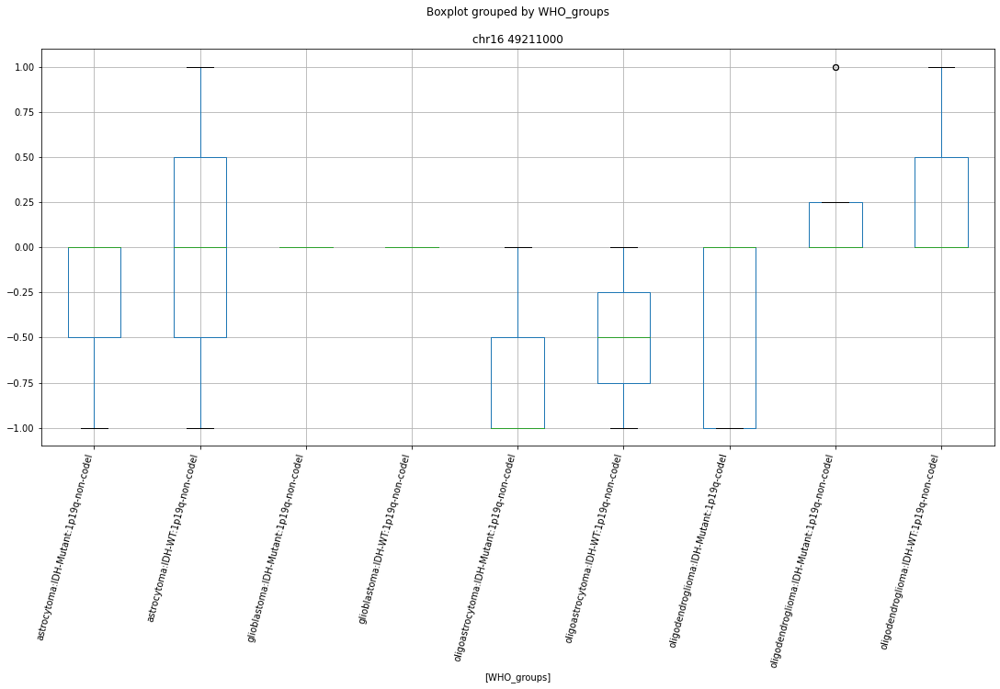

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr9 110098000


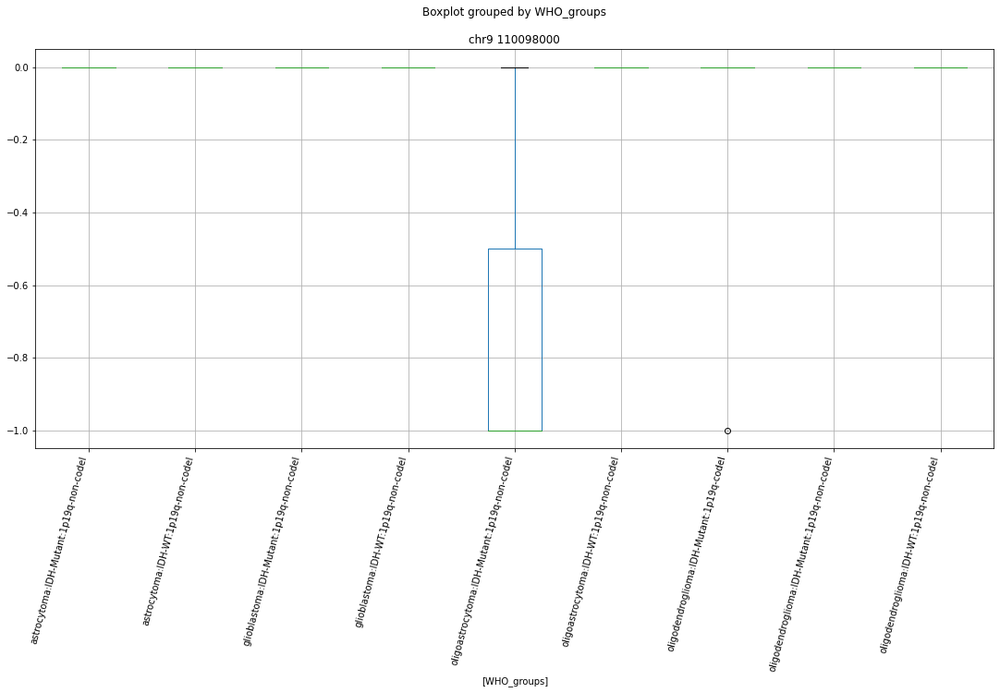

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr18 12873000


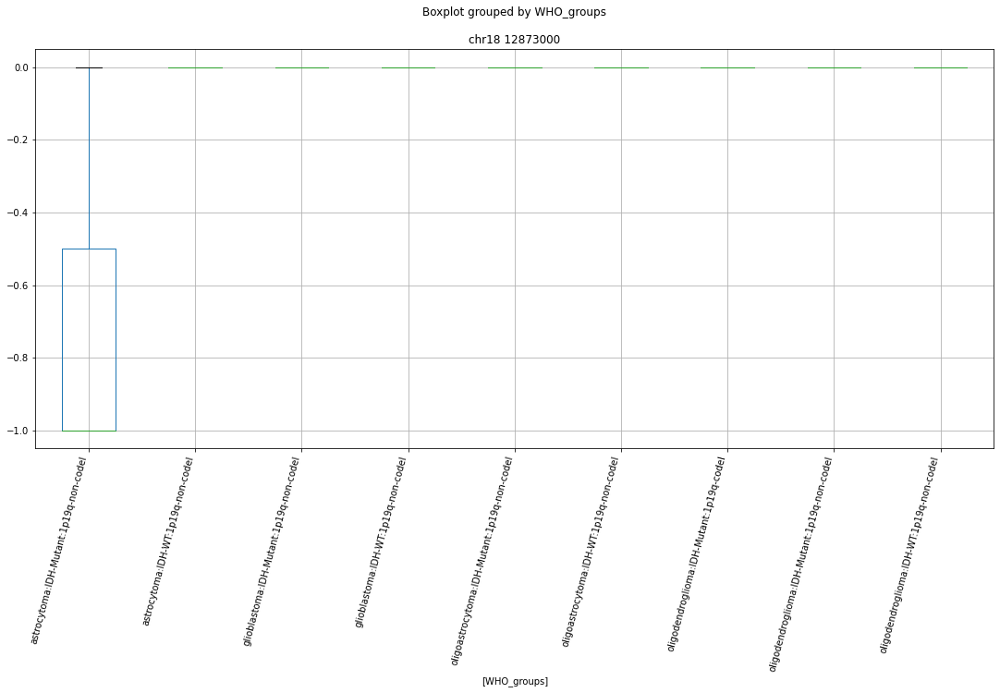

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chrX 71645000


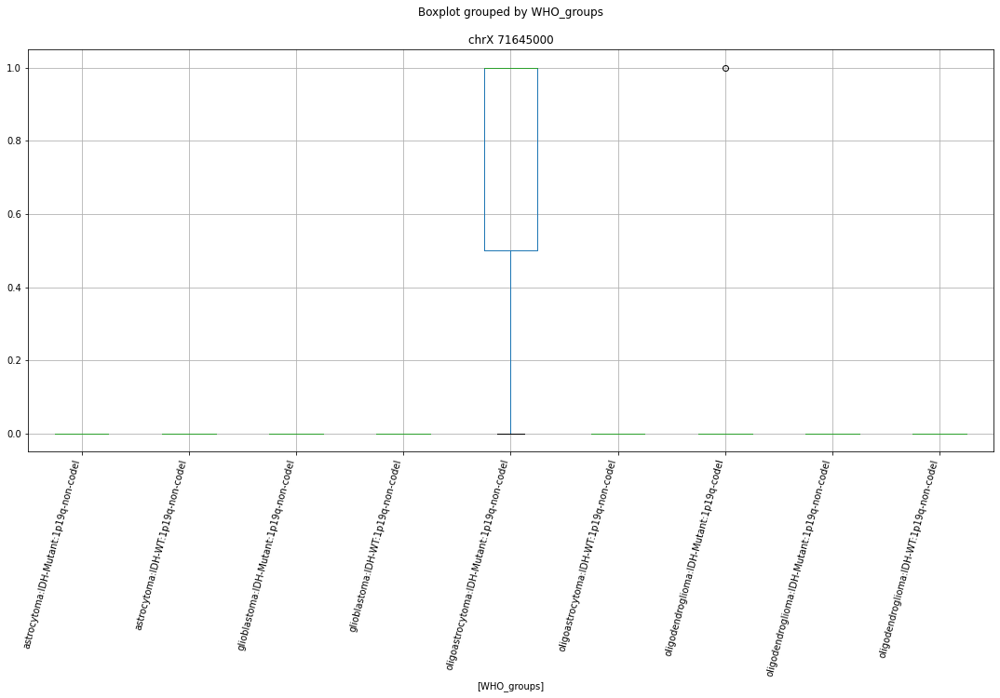

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr11 131085000


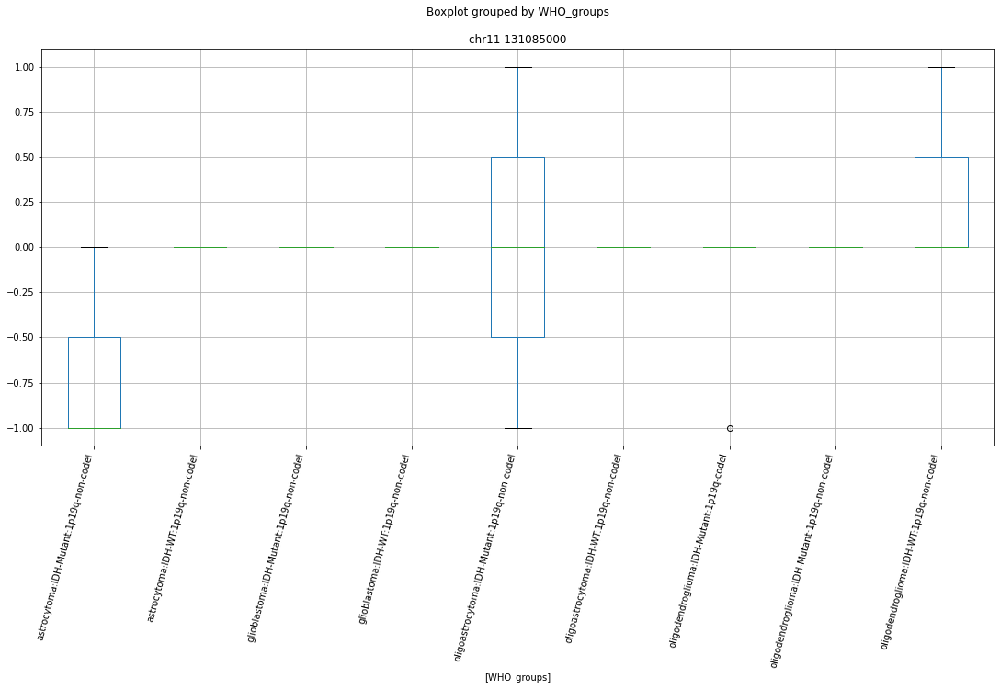

 p : 7.652029423525033e-07  ( t : 6.268199309263001 ) :  chr7 112128000


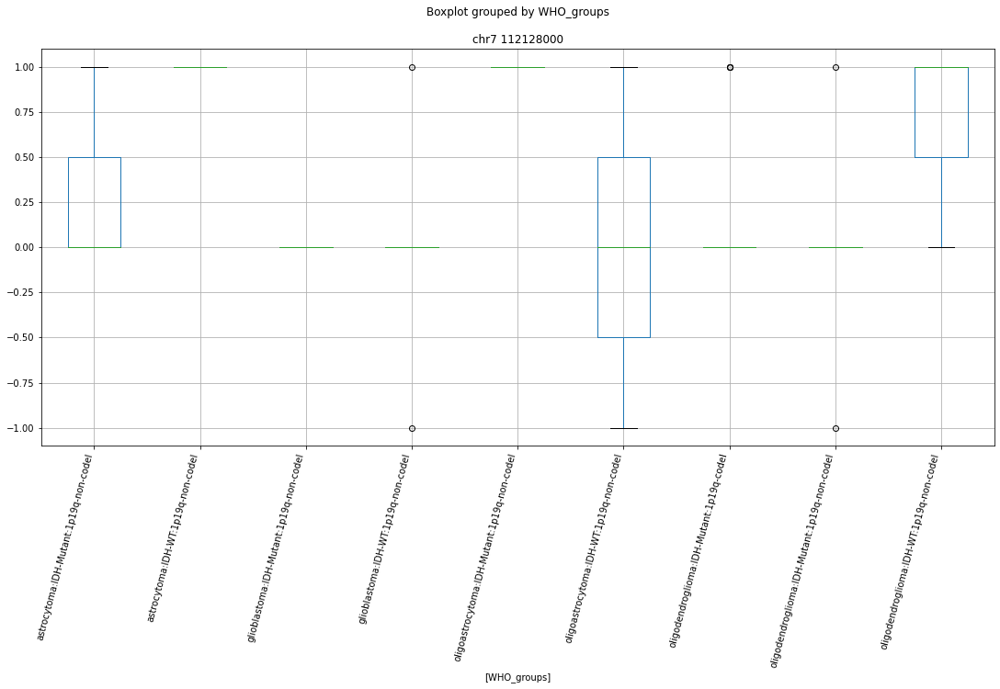

 p : 7.652029423525033e-07  ( t : 6.268199309263001 ) :  chr22 18042000


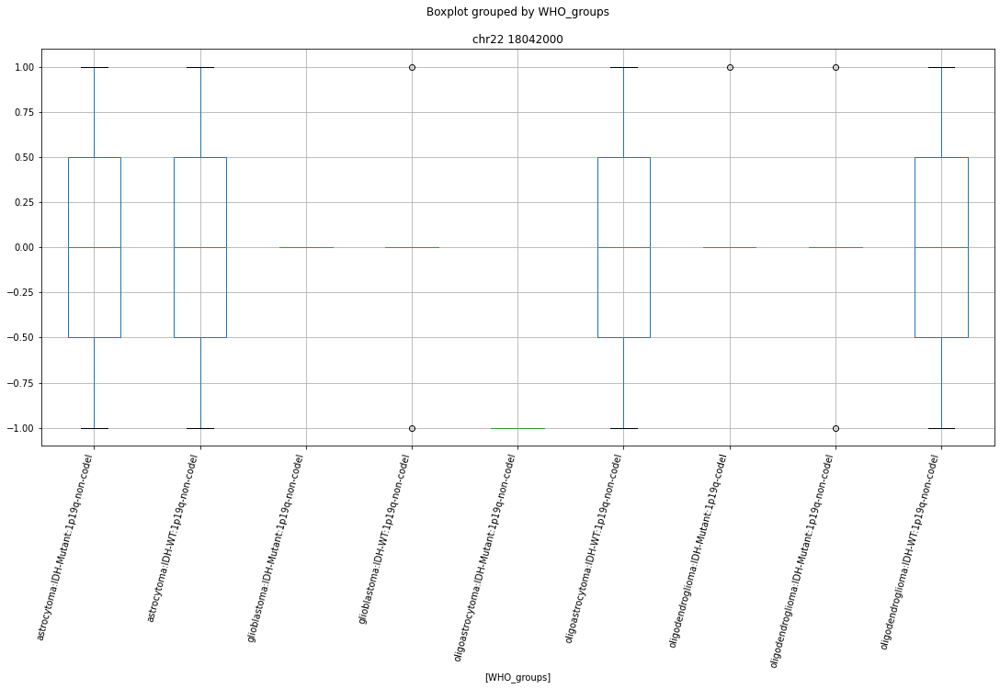

 p : 1.852189847381658e-06  ( t : 7.078507127770286 ) :  chr15 62219000


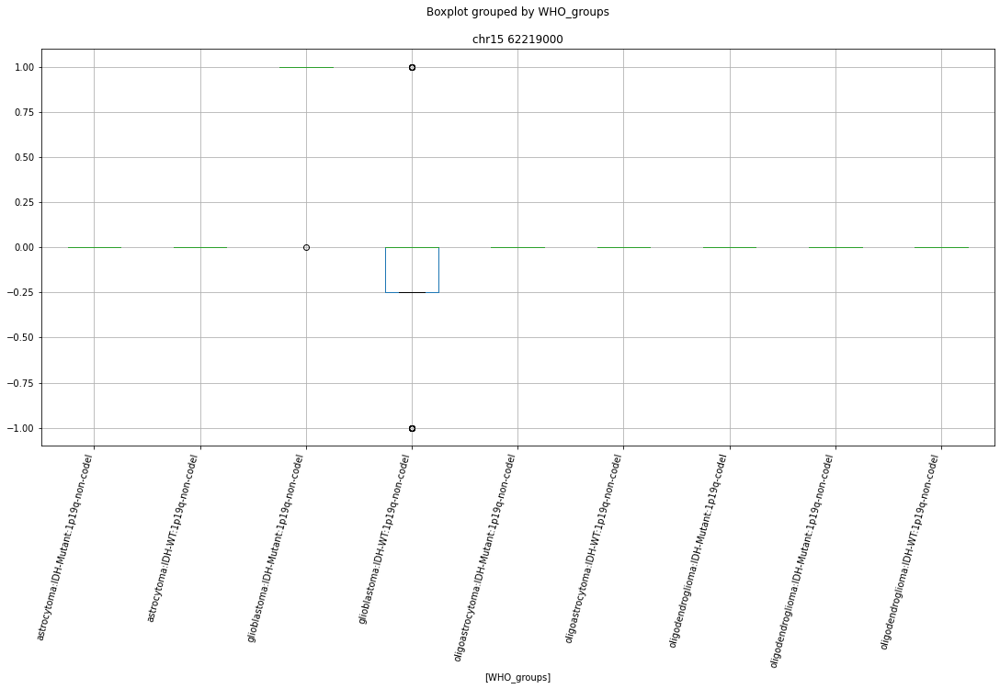

 p : 1.852189847381658e-06  ( t : 7.078507127770286 ) :  chr2 135032000


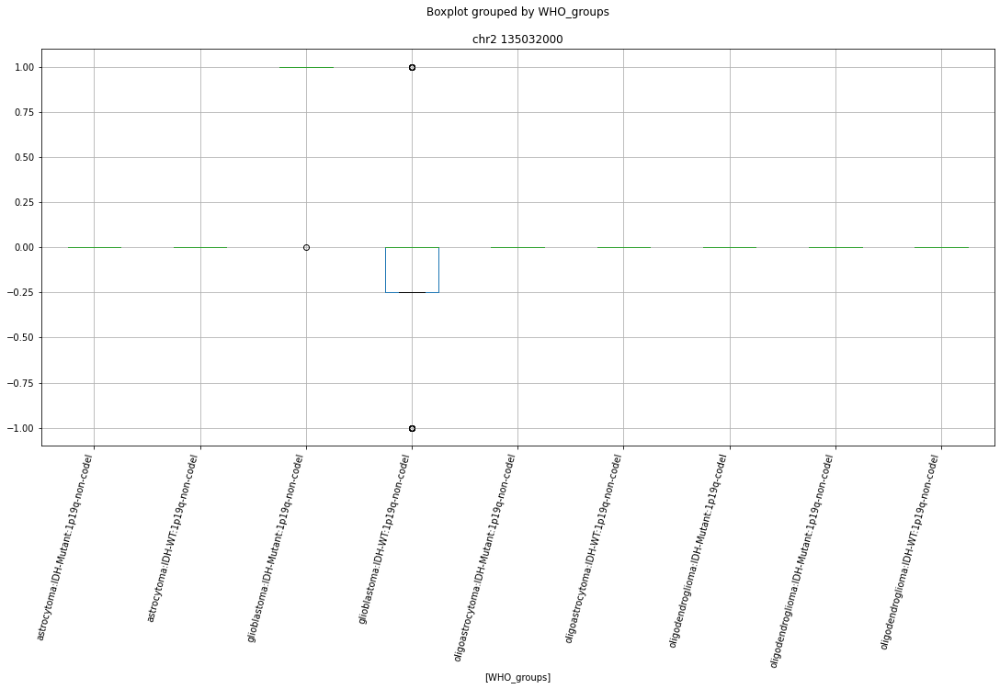

 p : 6.320613449404128e-06  ( t : 6.7686394229571025 ) :  chr22 18042000


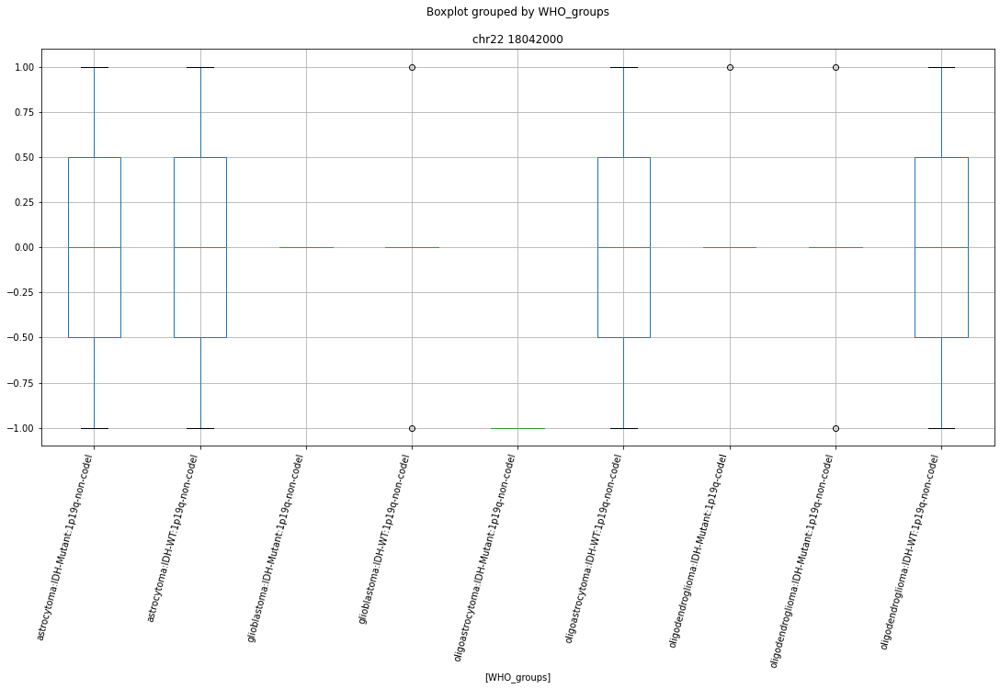

Clustermapping
['WHO_groups' 'chr1 10427000' 'chr1 108490000' ... 'chrY 12452000'
 'chrY 12878000' 'subject']


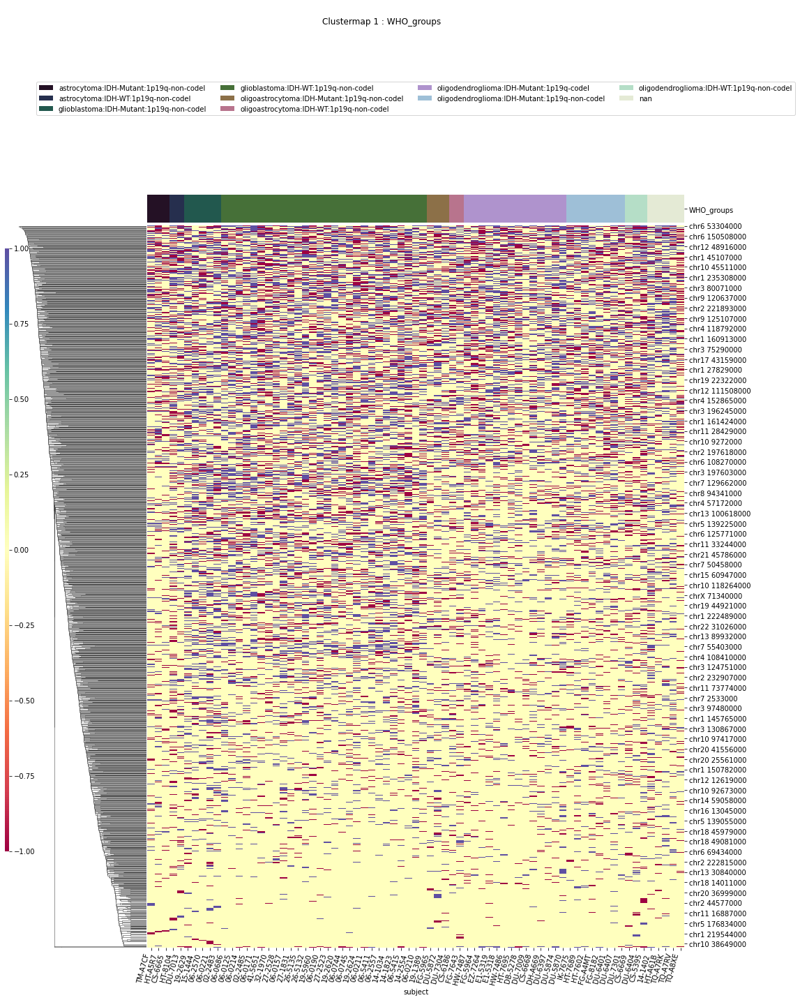

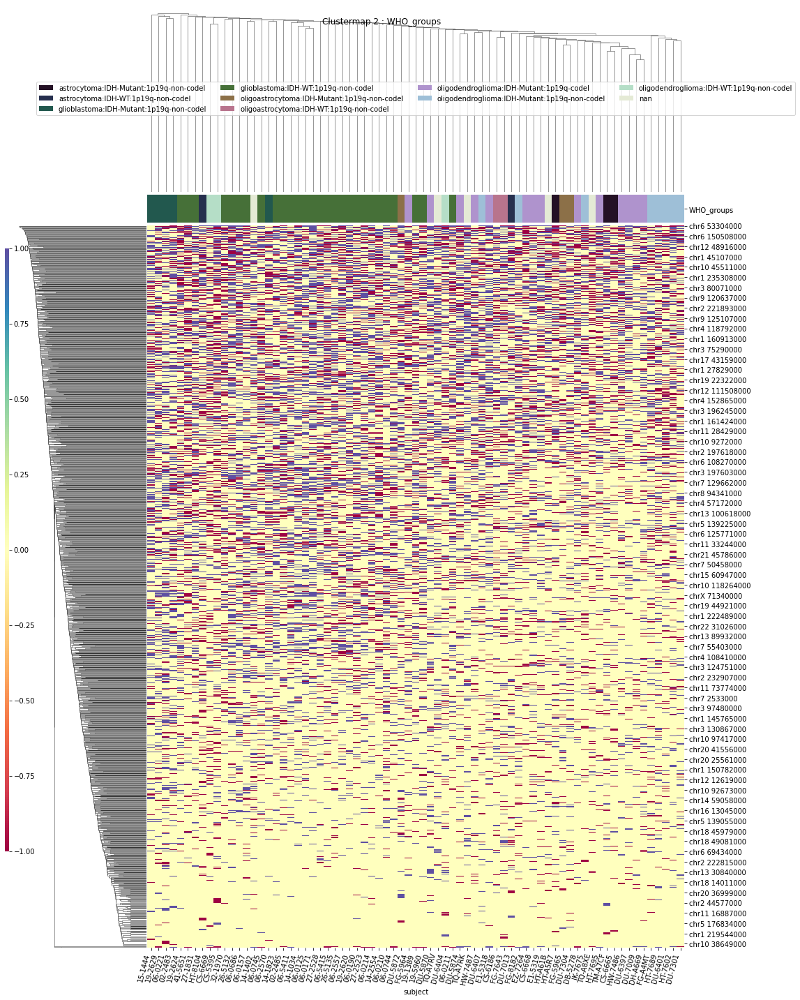

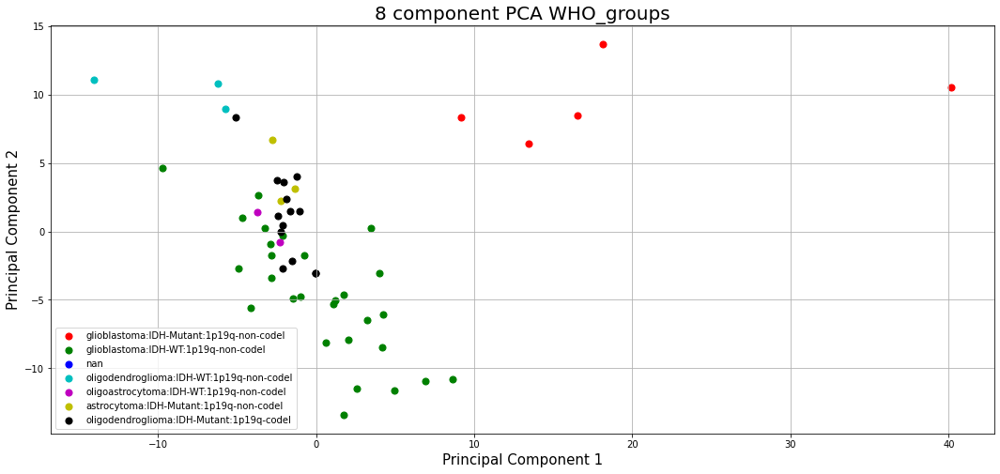

Triple_group
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
 p : 5.980116350794693e-09  ( t : 7.768066499641796 ) :  chr21 45267000


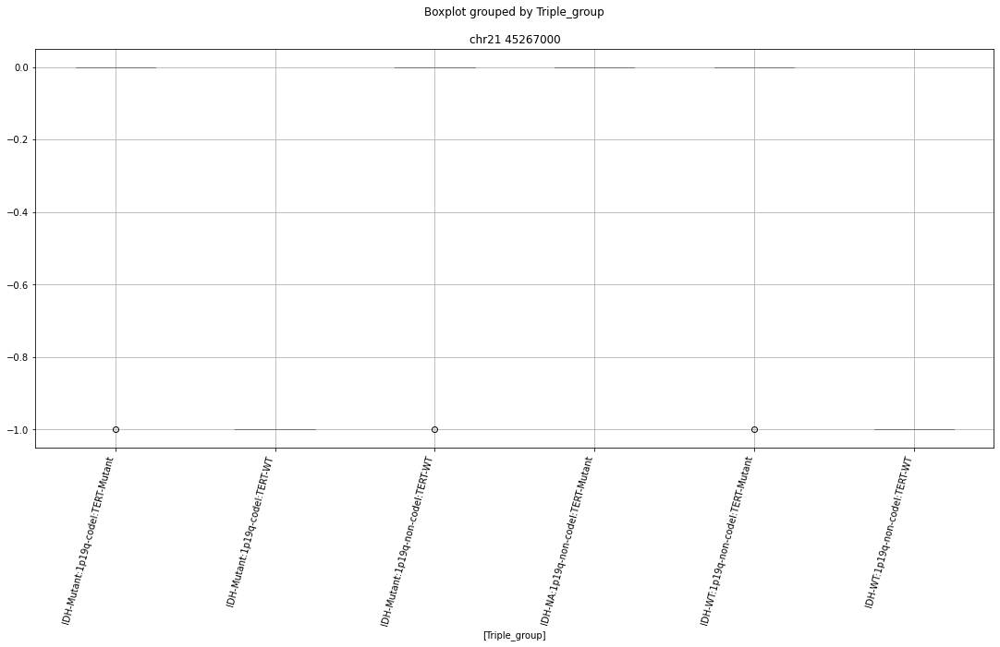

 p : 1.714740087022125e-06  ( t : 6.362389488234746 ) :  chr21 45267000


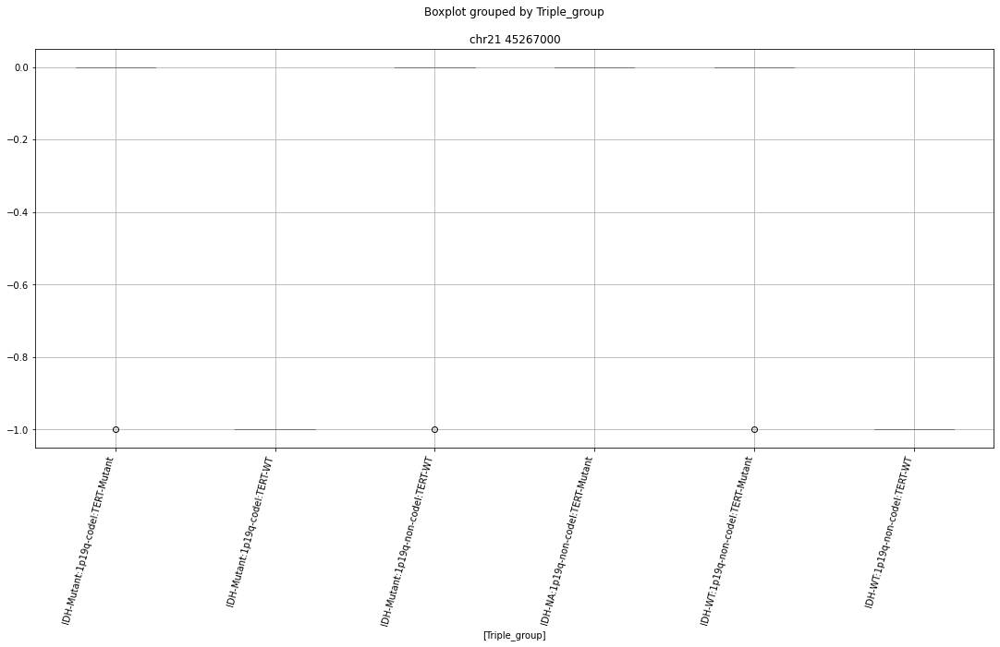

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr17 20556000


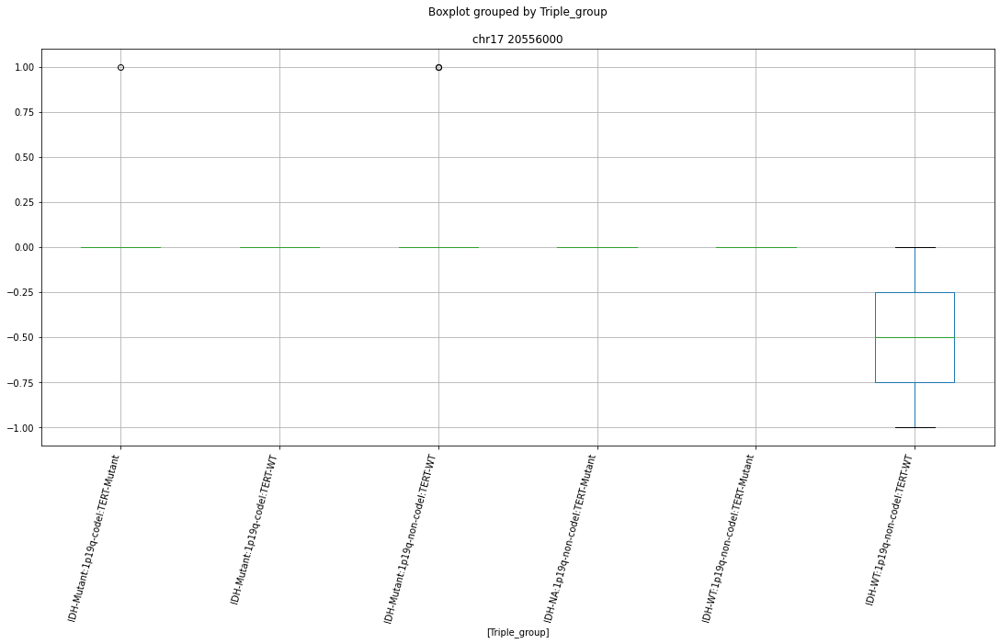

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr11 4237000


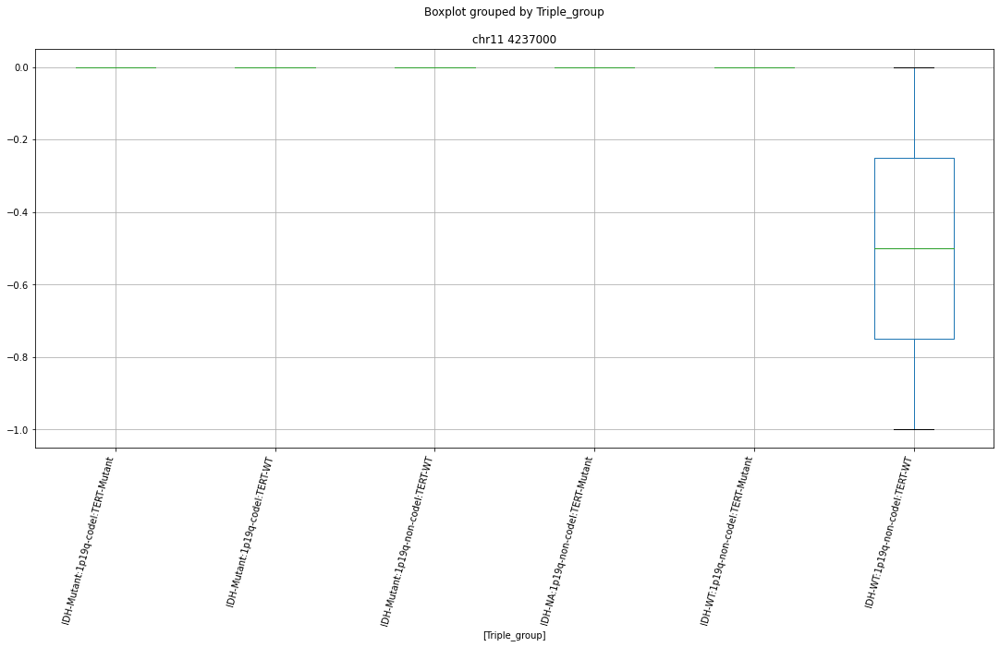

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr20 53862000


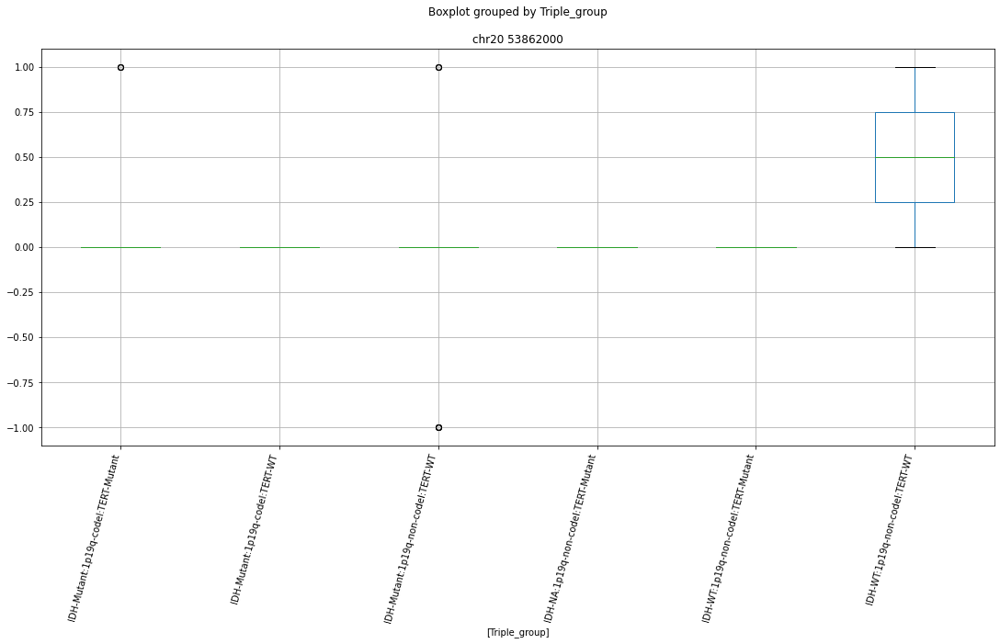

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 90892000


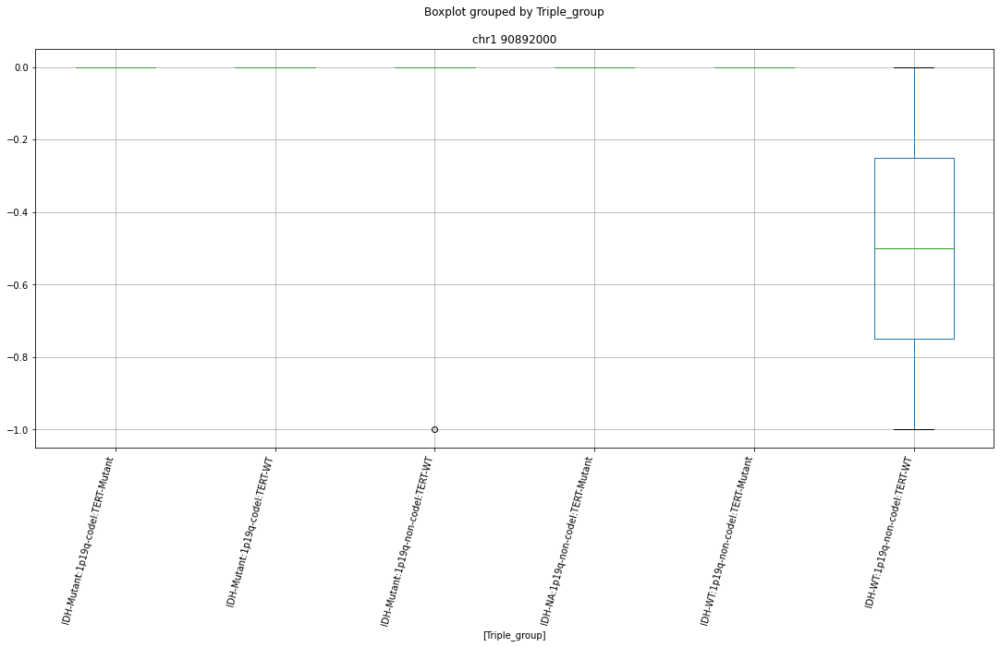

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr6 87752000


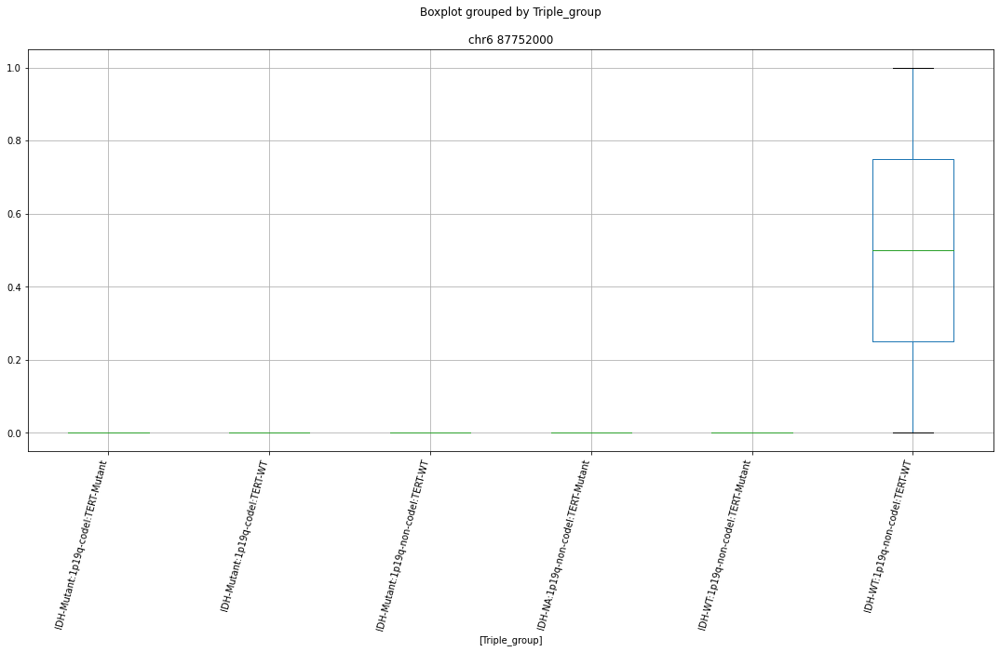

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 108490000


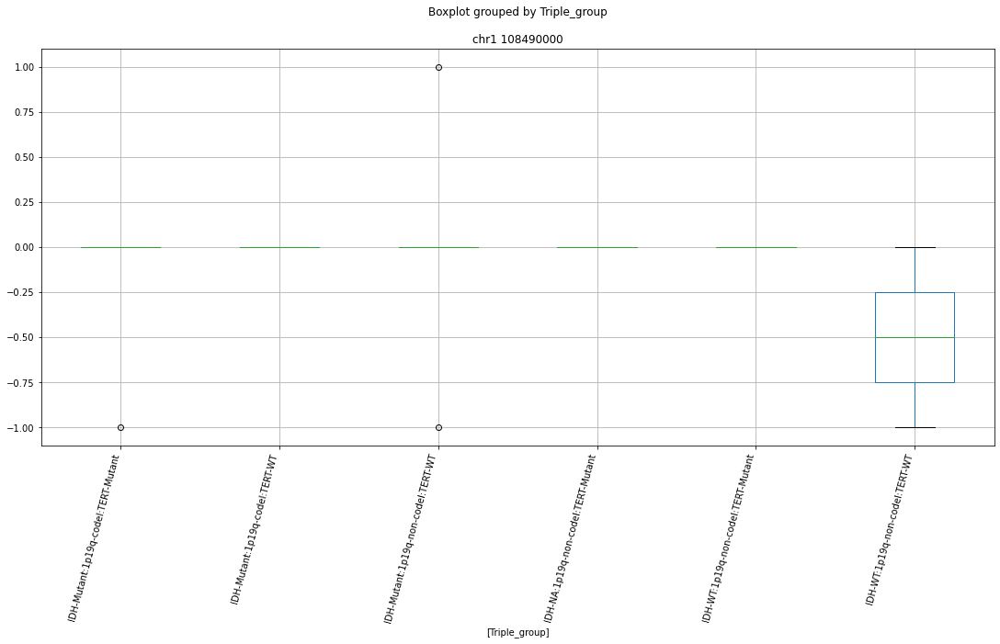

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr10 70688000


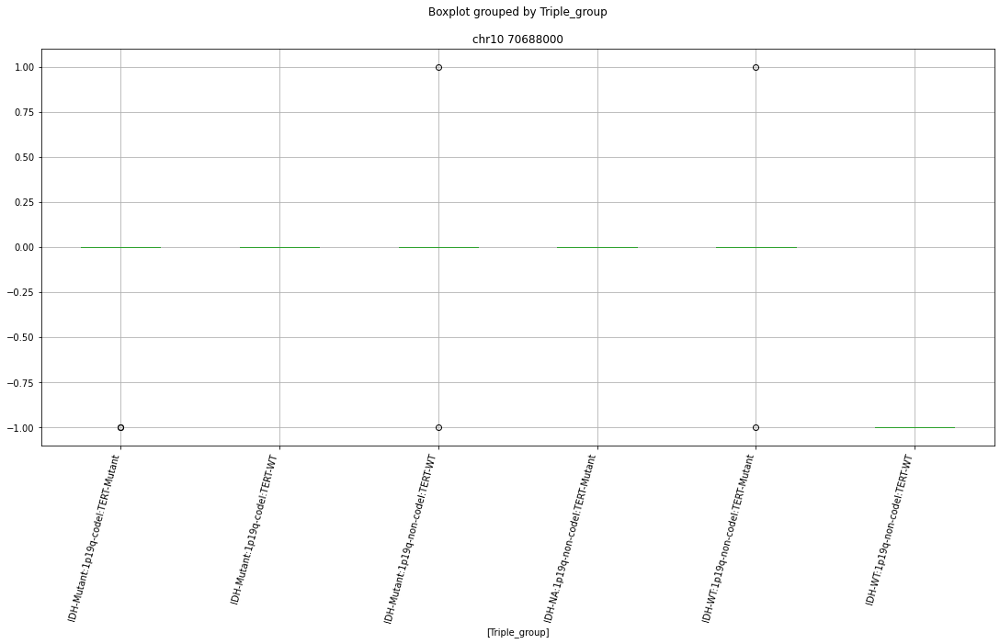

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr14 35978000


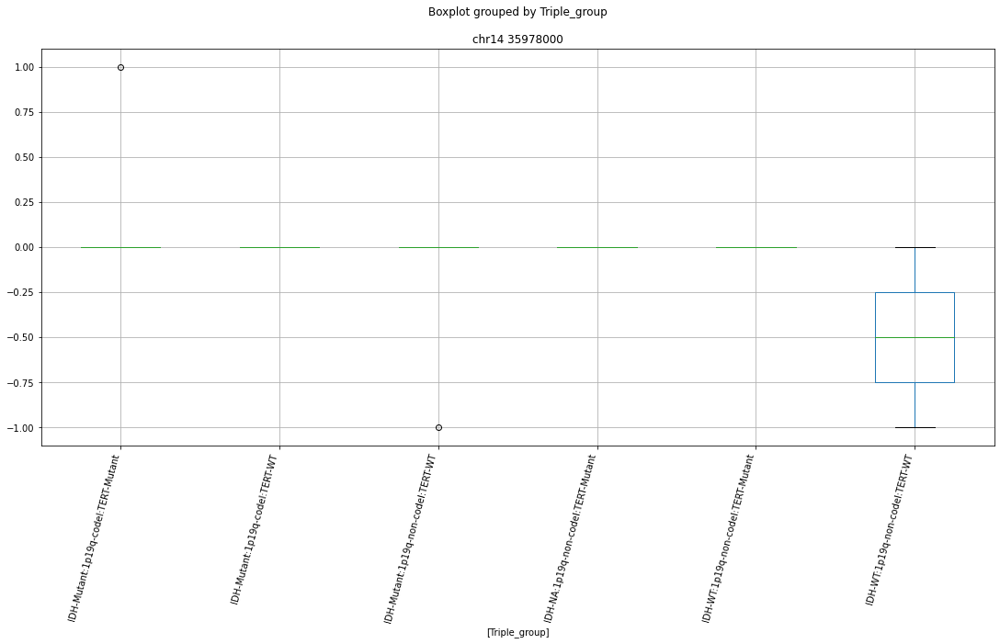

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr2 200684000


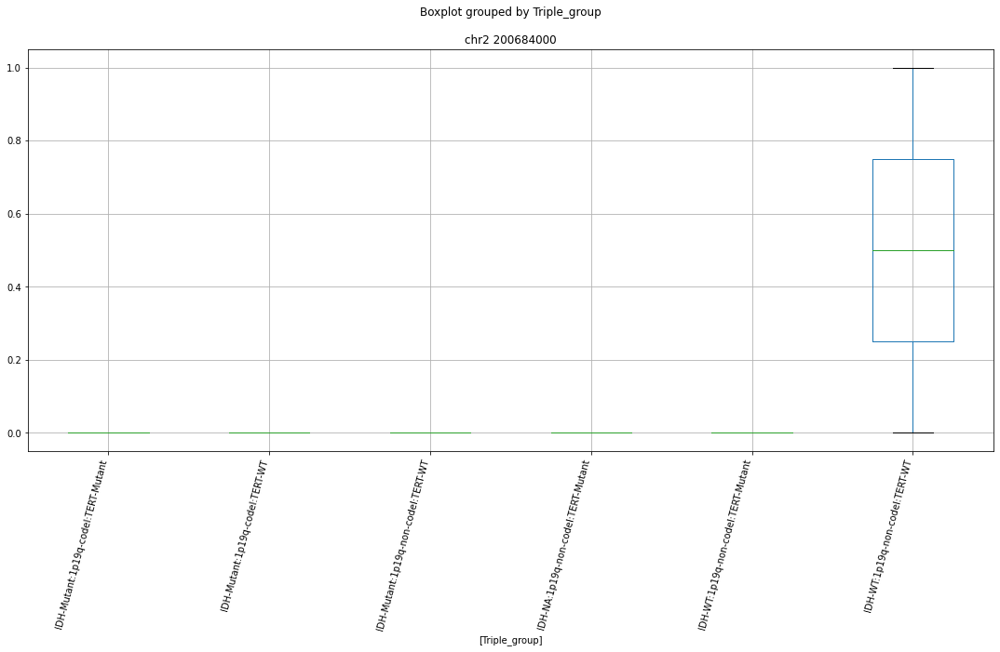

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 45042000


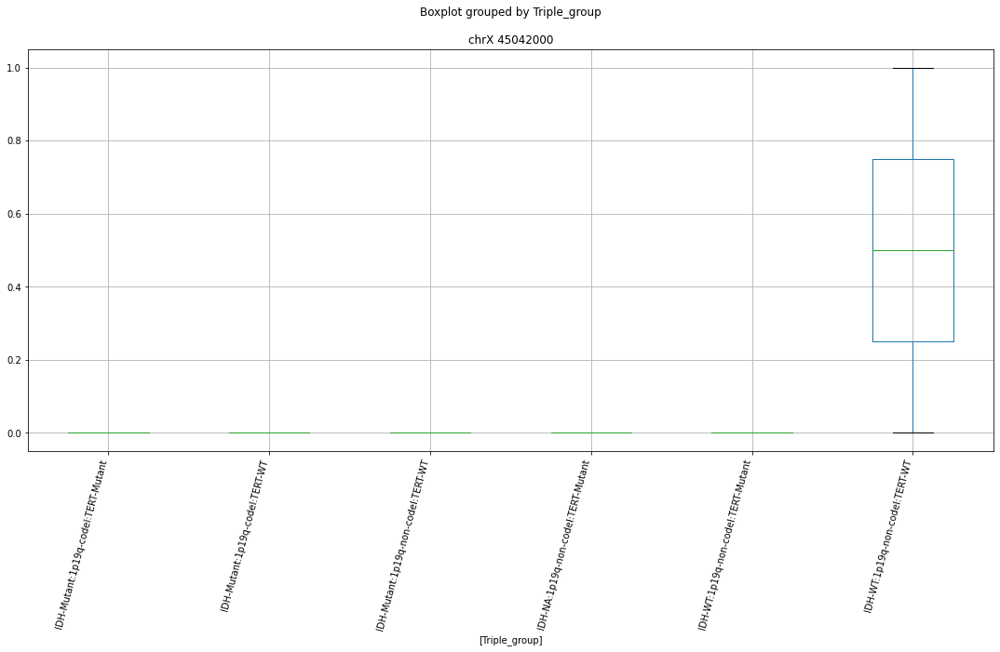

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr14 51468000


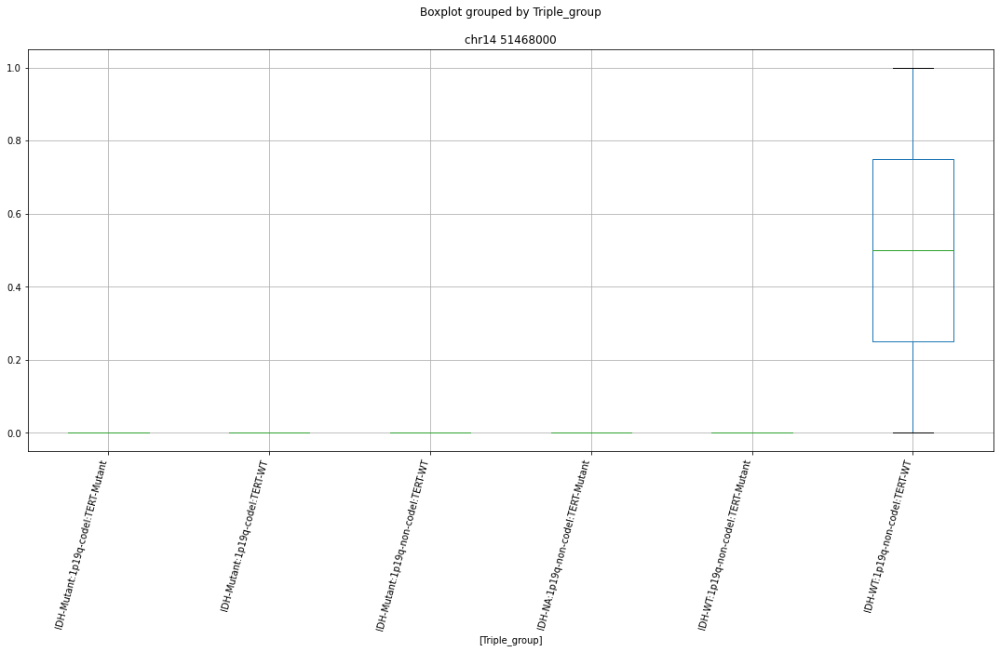

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr2 63808000


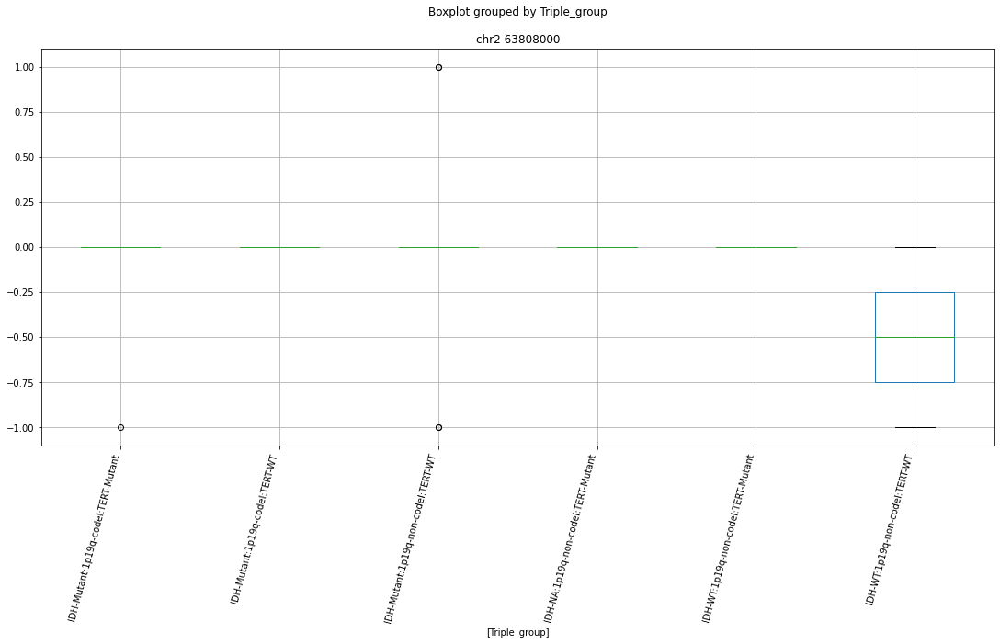

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr7 119611000


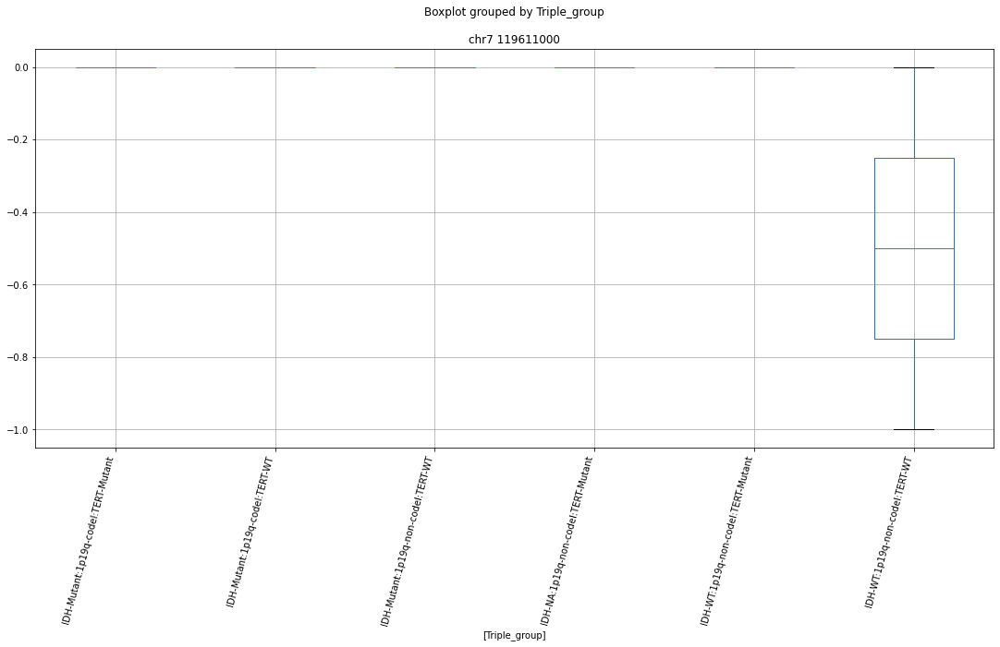

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr14 85830000


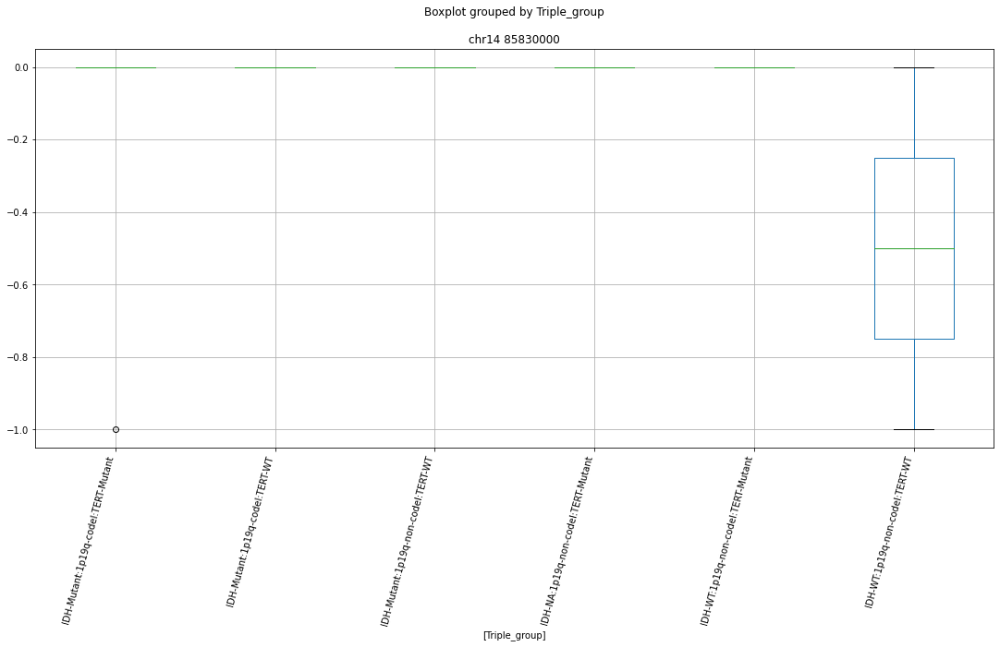

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 220467000


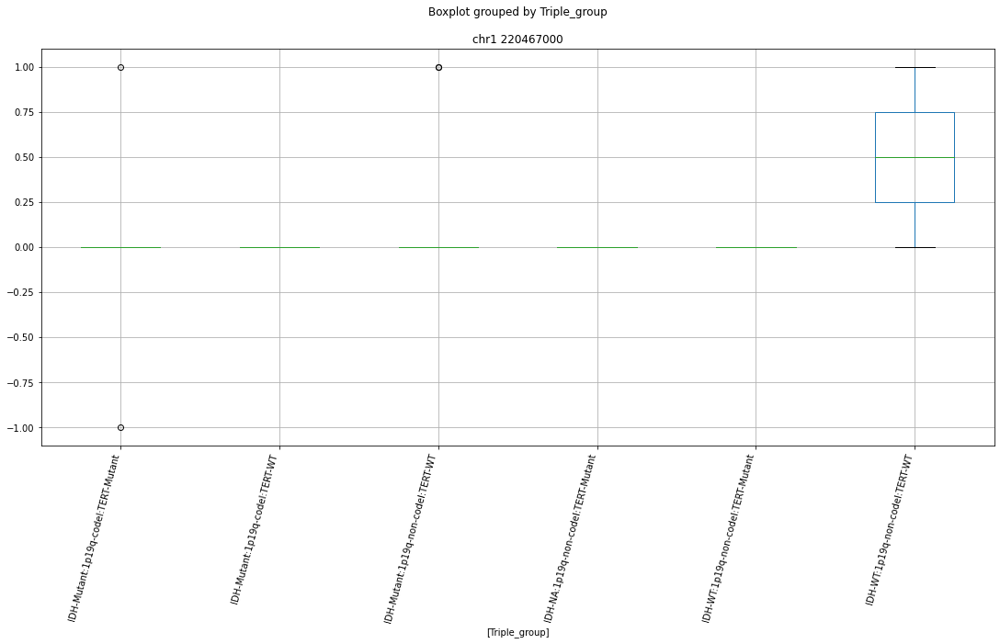

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 241416000


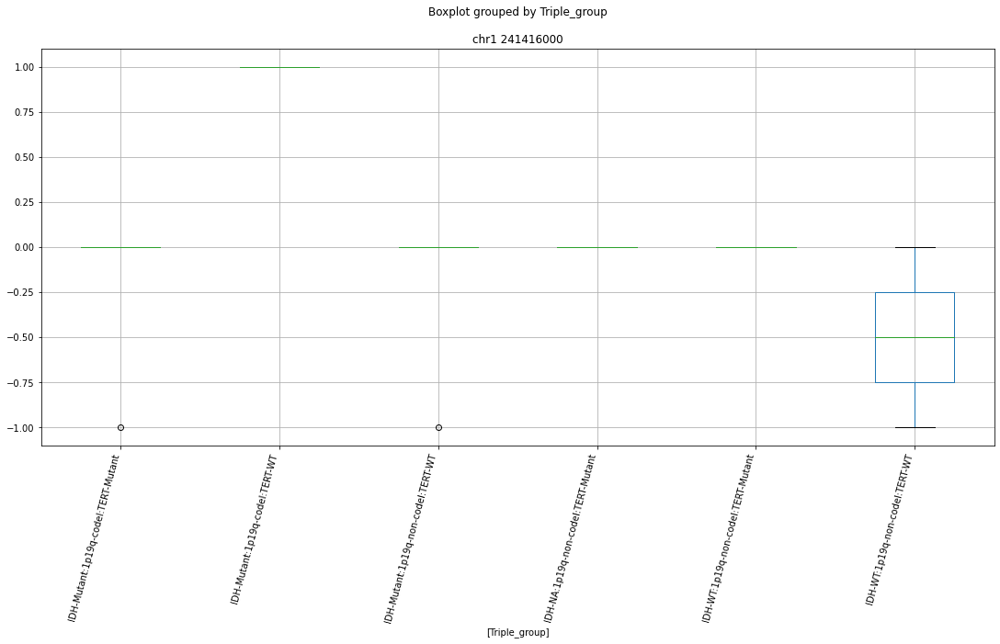

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr13 30840000


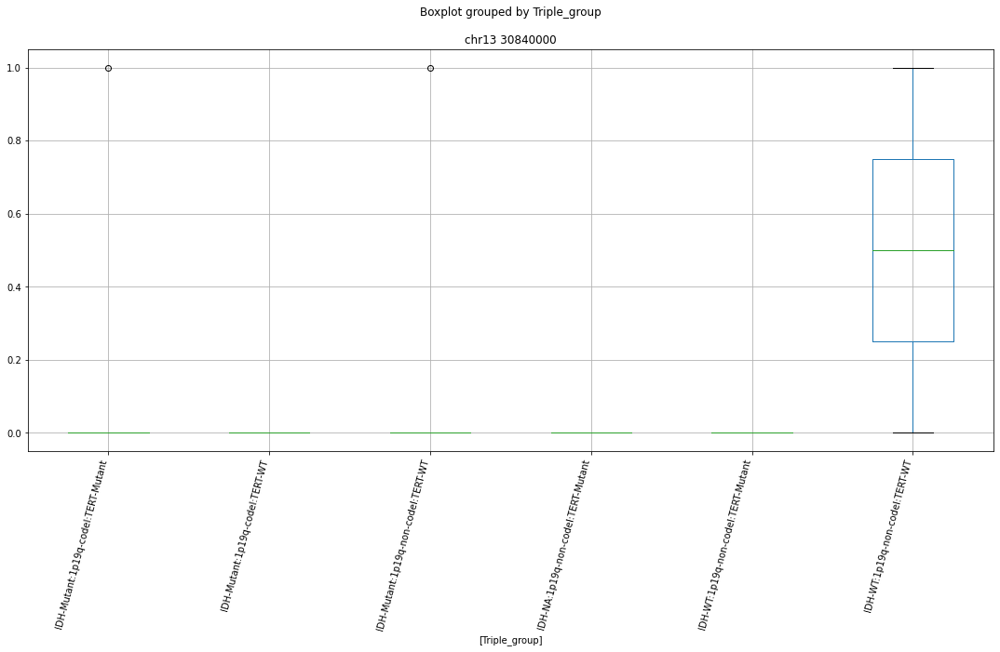

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr5 139169000


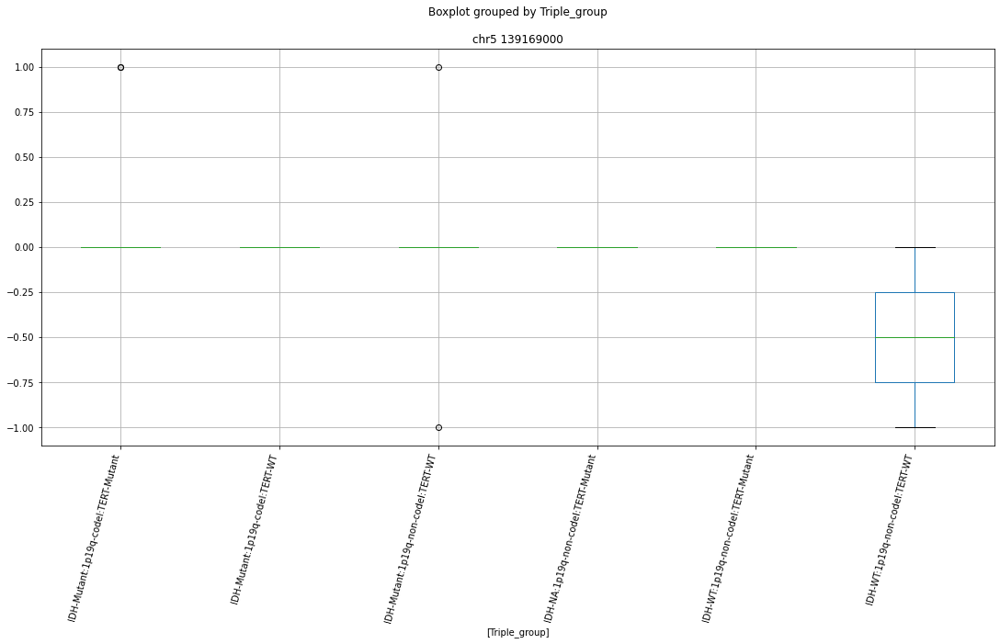

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr14 76898000


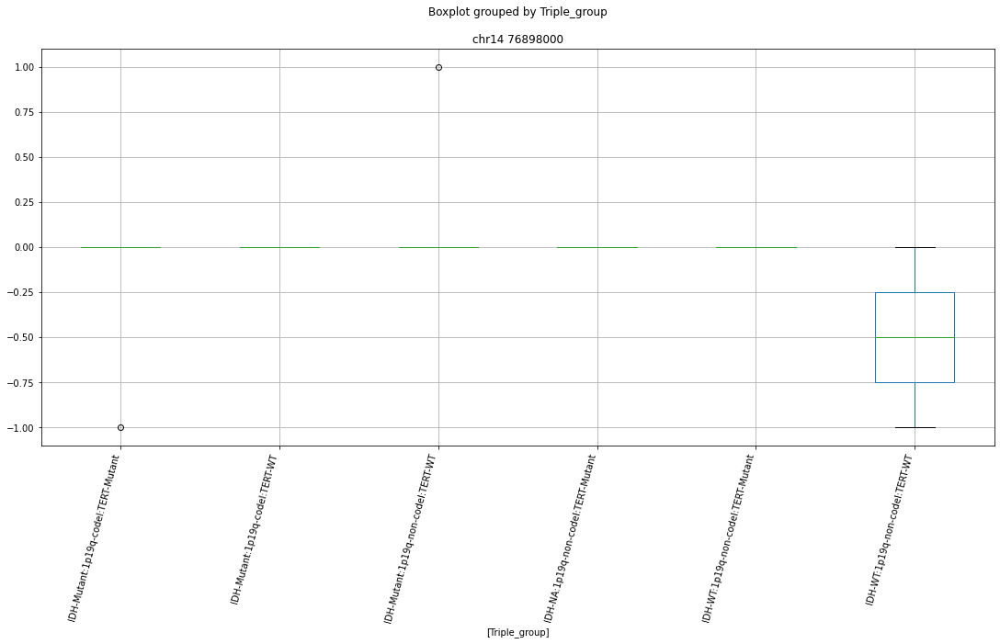

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr17 32923000


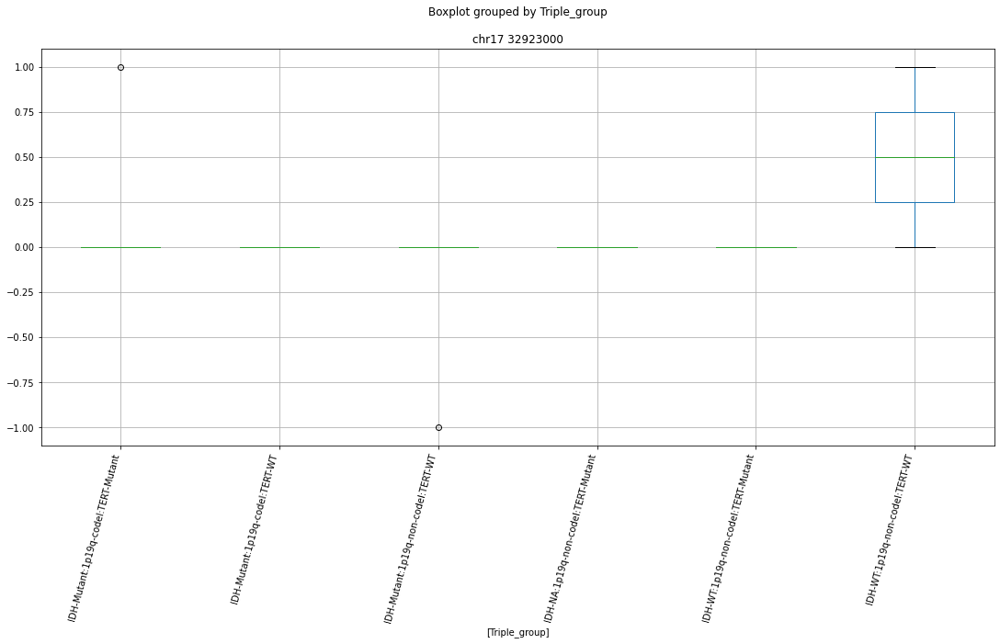

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 149420000


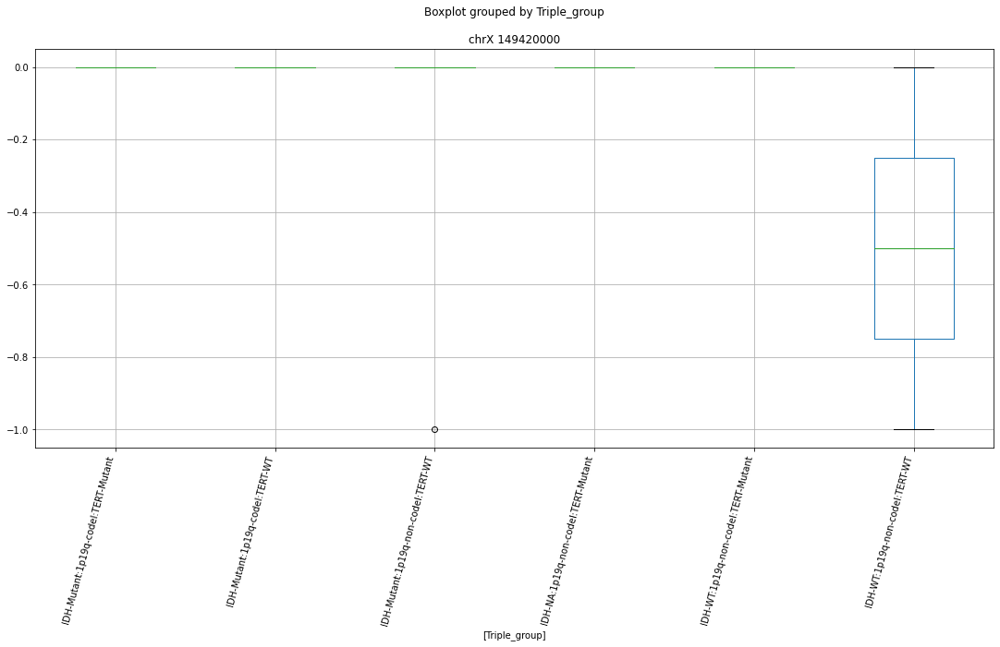

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 109670000


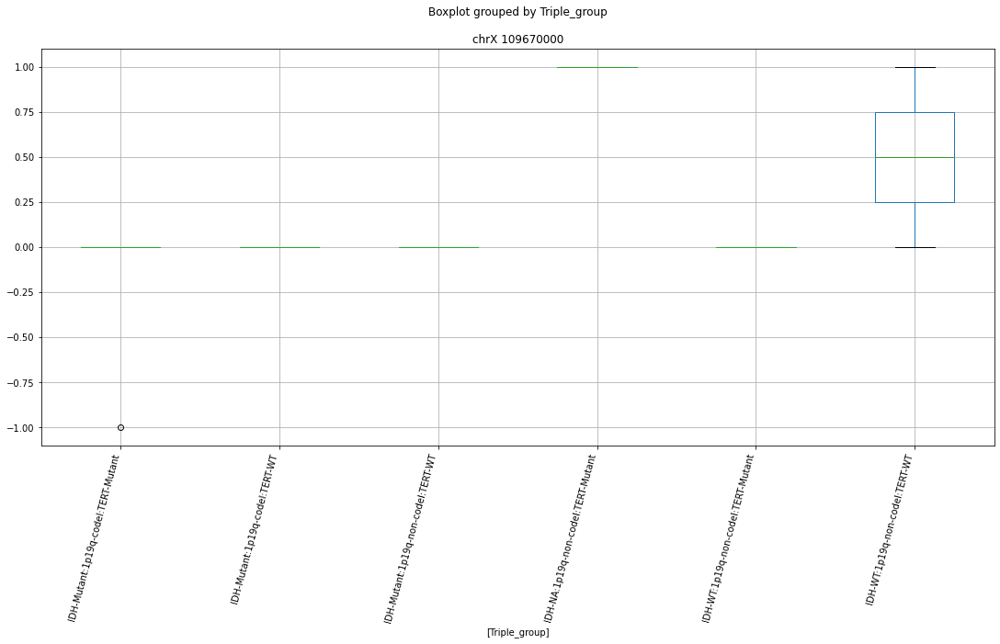

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr22 17560000


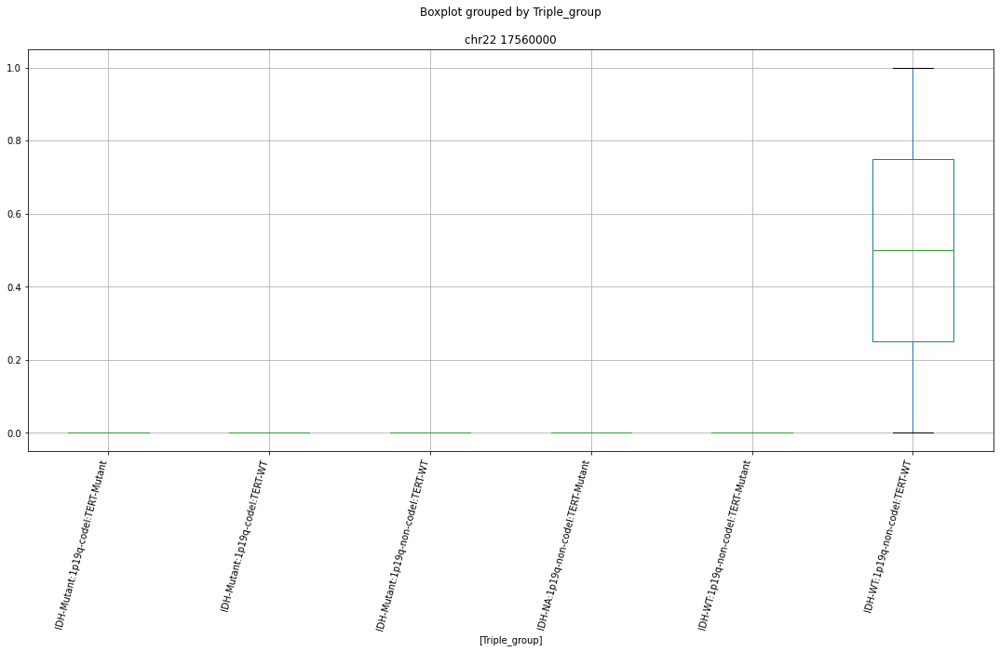

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr12 119919000


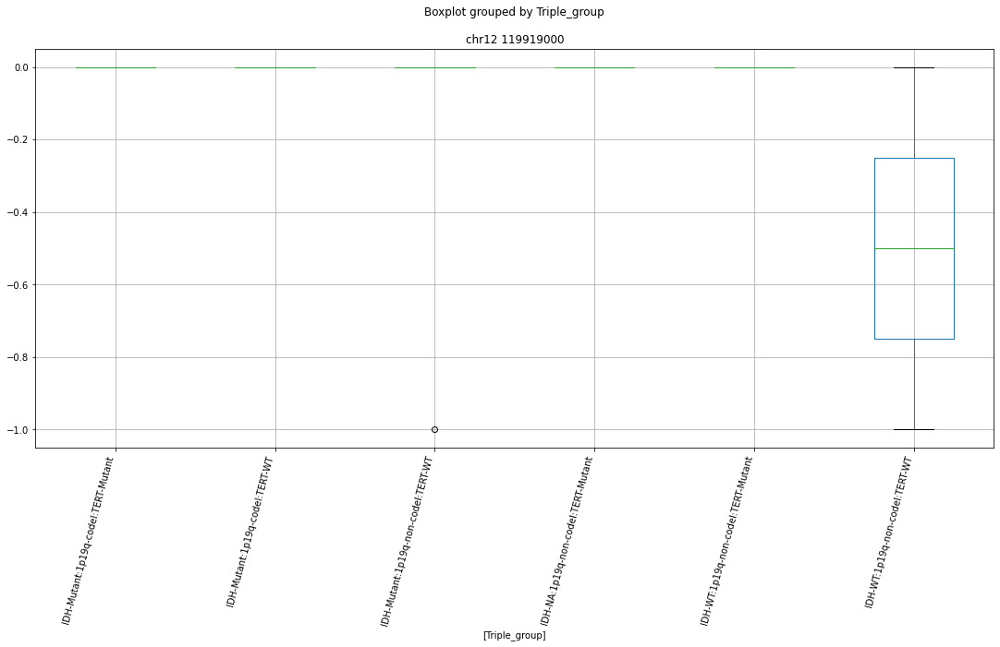

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 126640000


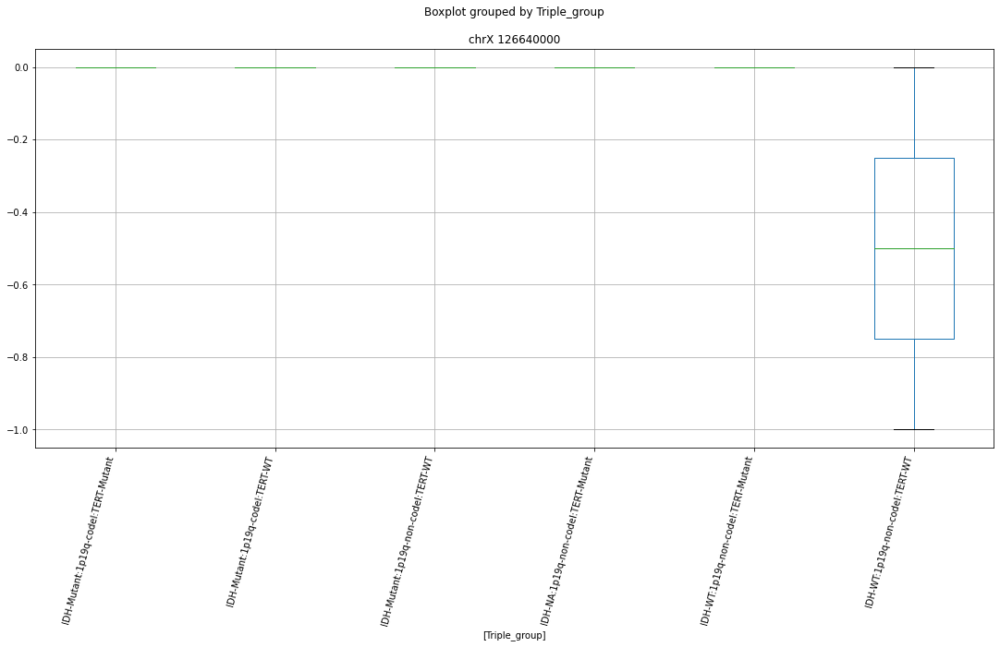

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr11 76583000


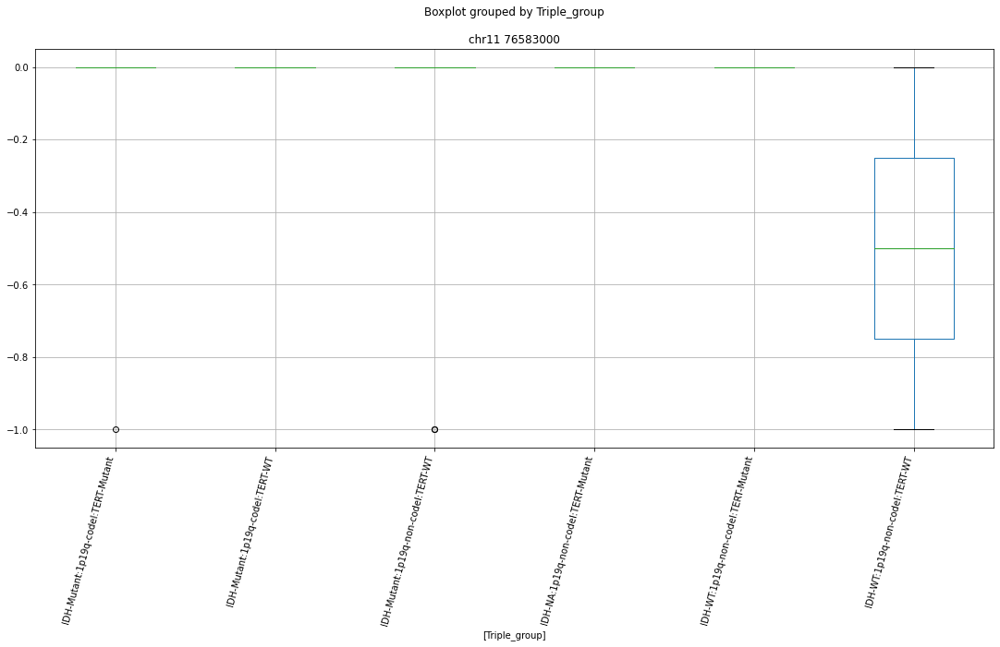

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 133484000


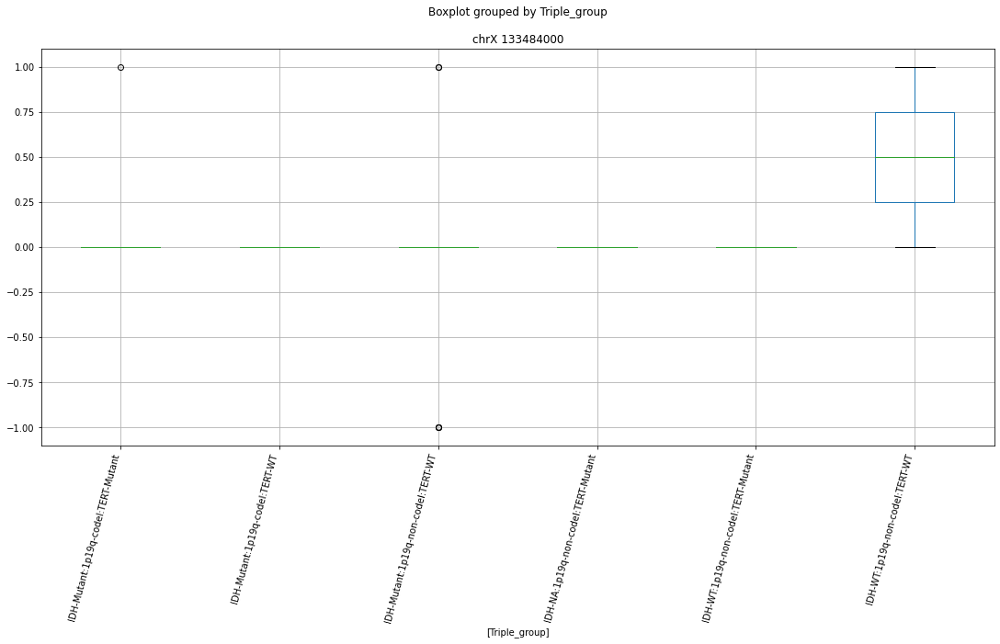

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr11 73937000


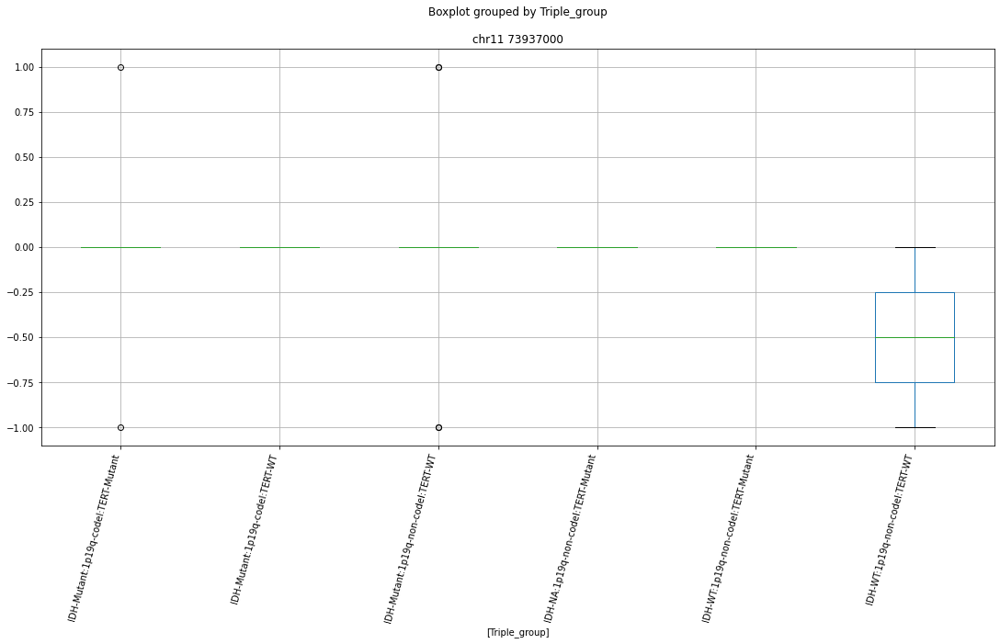

 p : 5.559732455007055e-06  ( t : 5.406345478099919 ) :  chr5 39333000


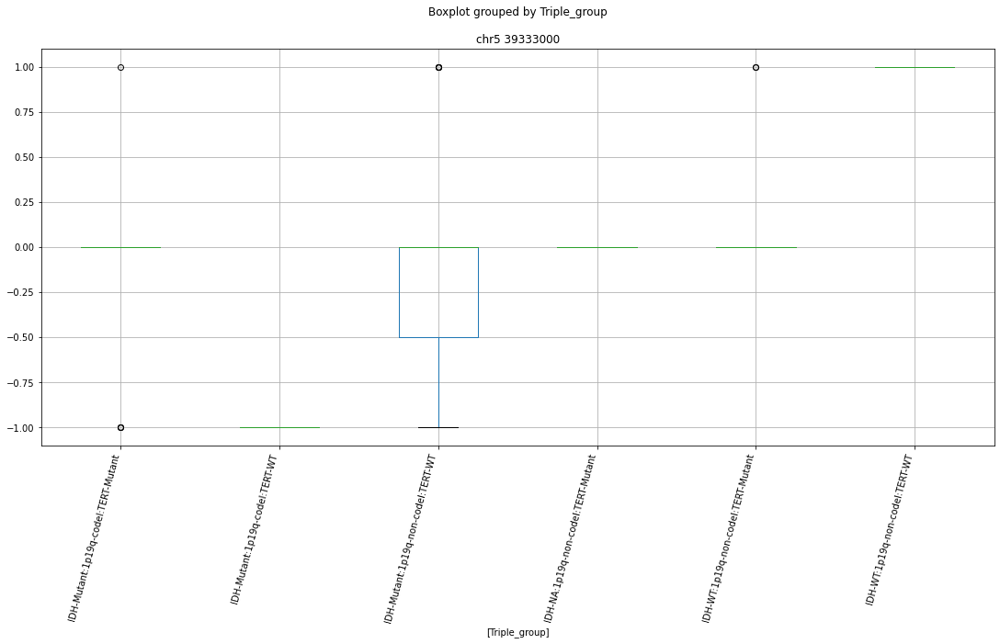

Clustermapping
['Triple_group' 'chr1 10427000' 'chr1 108490000' 'chr1 112729000'
 'chr1 114058000' 'chr1 114791000' 'chr1 117300000' 'chr1 12042000'
 'chr1 145763000' 'chr1 150780000' 'chr1 150850000' 'chr1 151768000'
 'chr1 151770000' 'chr1 152195000' 'chr1 155835000' 'chr1 156182000'
 'chr1 161617000' 'chr1 182742000' 'chr1 183427000' 'chr1 202451000'
 'chr1 203841000' 'chr1 211198000' 'chr1 21386000' 'chr1 217523000'
 'chr1 217524000' 'chr1 220467000' 'chr1 222486000' 'chr1 225616000'
 'chr1 231127000' 'chr1 231453000' 'chr1 234268000' 'chr1 235080000'
 'chr1 235310000' 'chr1 23689000' 'chr1 241416000' 'chr1 246363000'
 'chr1 247219000' 'chr1 248676000' 'chr1 248677000' 'chr1 248830000'
 'chr1 27829000' 'chr1 31177000' 'chr1 32803000' 'chr1 33510000'
 'chr1 34967000' 'chr1 36760000' 'chr1 39999000' 'chr1 43501000'
 'chr1 44875000' 'chr1 44877000' 'chr1 45107000' 'chr1 45739000'
 'chr1 46321000' 'chr1 48384000' 'chr1 64202000' 'chr1 65630000'
 'chr1 77871000' 'chr1 86900000' 'chr1 90

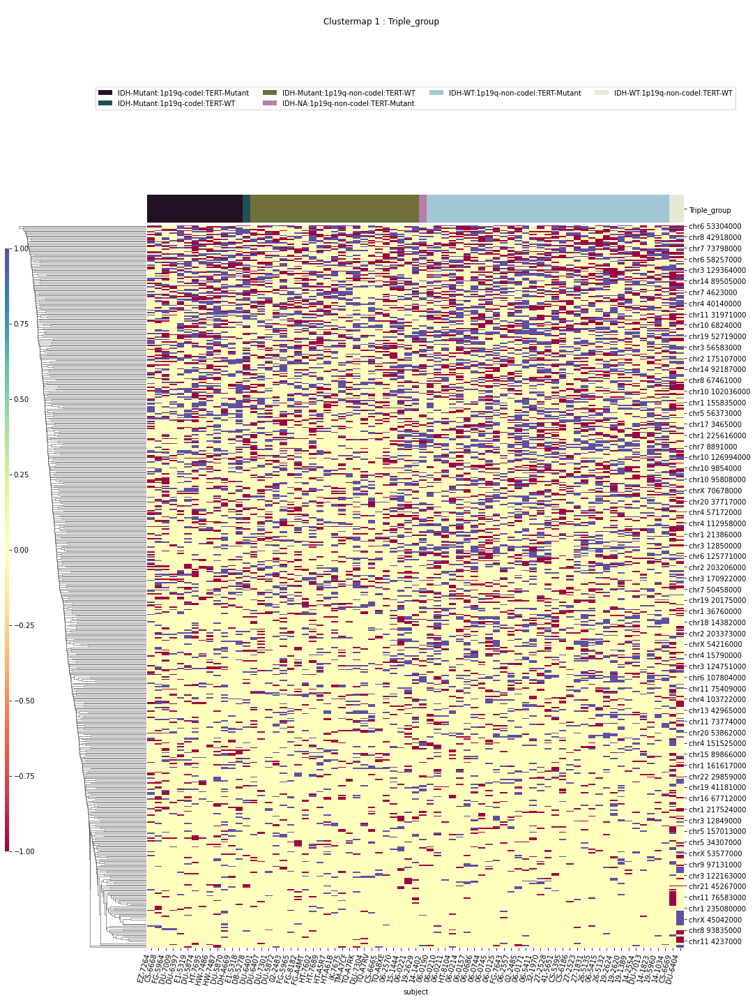

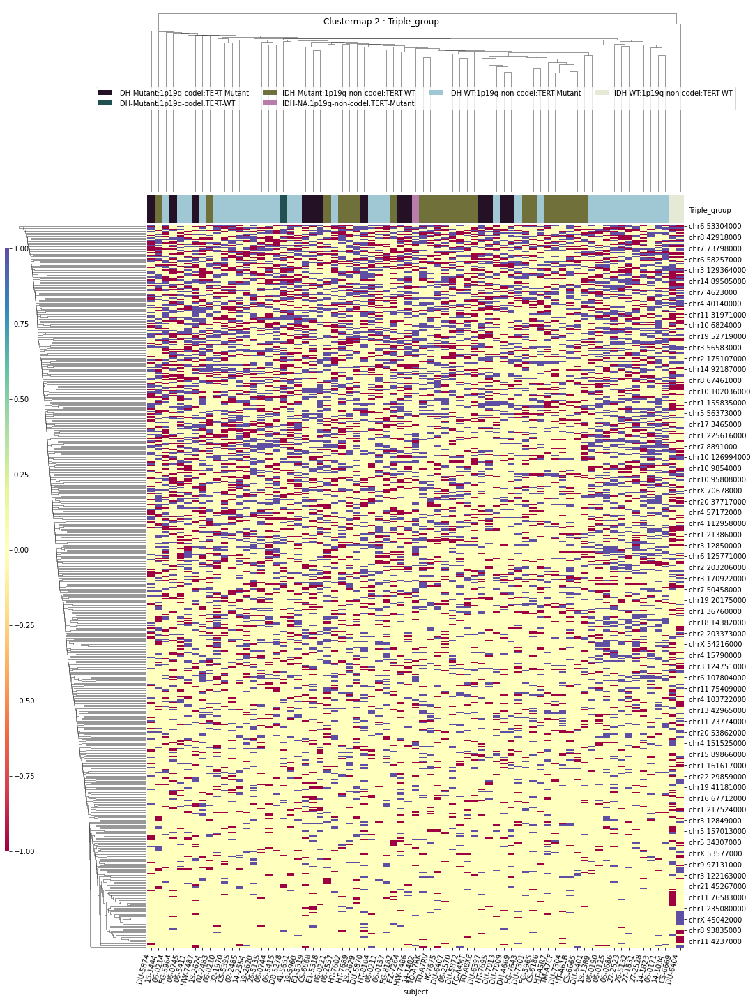

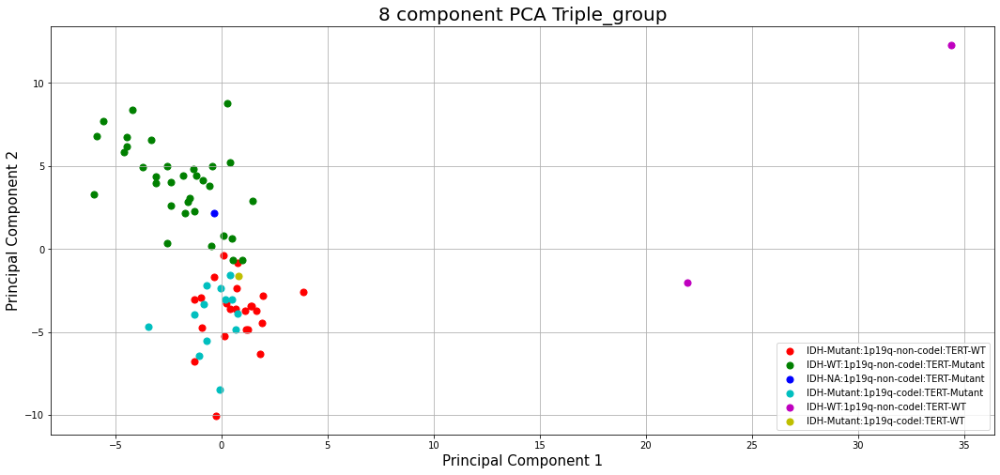

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 106413000' 'chr1 111234000' 'chr1 112729000'
 'chr1 117300000' 'chr1 159449000' 'chr1 179039000' 'chr1 183427000'
 'chr1 193436000' 'chr1 219546000' 'chr1 23854000' 'chr1 27829000'
 'chr1 34948000' 'chr1 36243000' 'chr1 40000000' 'chr1 45223000'
 'chr1 54561000' 'chr1 86217000' 'chr1 99824000' 'chr10 107801000'
 'chr10 119794000' 'chr10 120799000' 'chr10 12518000' 'chr10 2805000'
 'chr10 28772000' 'chr10 43464000' 'chr10 62928000' 'chr10 62949000'
 'chr10 80535000' 'chr10 9274000' 'chr11 112664000' 'chr11 17051000'
 'chr11 60511000' 'chr11 71166000' 'chr11 75876000' 'chr11 86733000'
 'chr11 95481000' 'chr12 104322000' 'chr12 108657000' 'chr12 114484000'
 'chr12 46001000' 'chr12 56788000' 'chr12 67340000' 'chr12 69758000'
 'chr13 18673000' 'chr13 43040000' 'chr13 46163000' 'chr13 49761000'
 'chr14 31559000' 'chr14 44602000' 'chr14 51605000' 'chr14 63166000'
 'chr14 65632000' 'chr14 76735000' 'chr14 84098000' 'chr15 41321000'
 'chr1

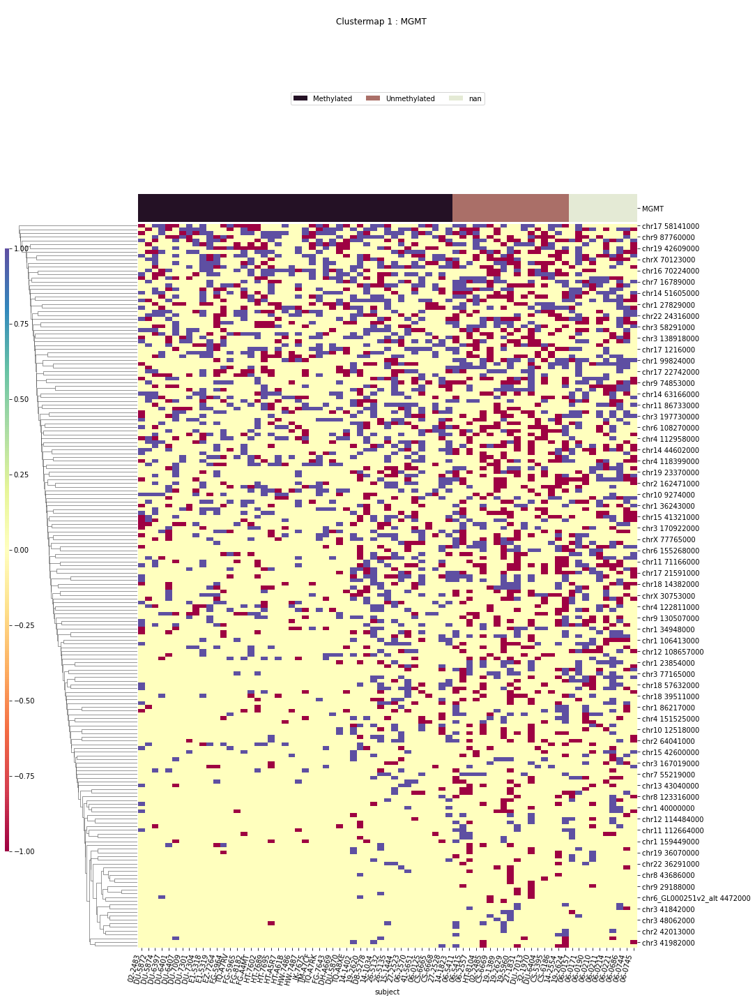

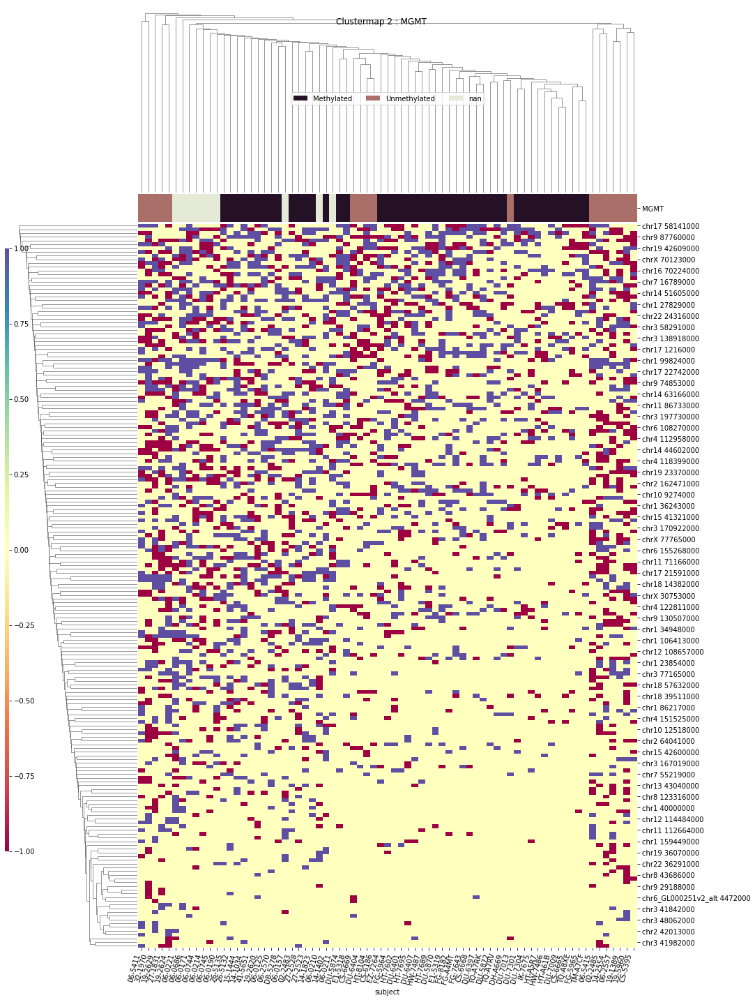

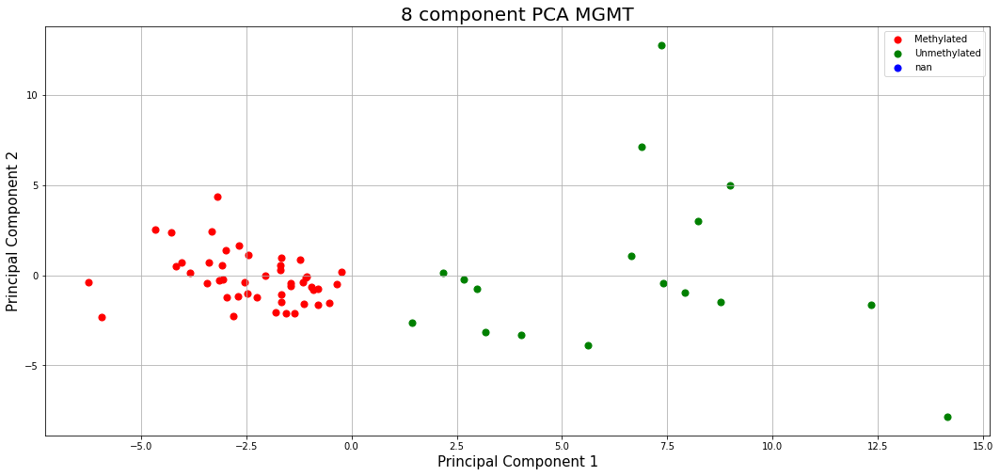

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 111607000' 'chr1 114803000' 'chr1 145765000' 'chr1 150850000'
 'chr1 179039000' 'chr1 182740000' 'chr1 23854000' 'chr1 27829000'
 'chr1 43501000' 'chr1 45739000' 'chr1 86900000' 'chr1 99824000'
 'chr10 119794000' 'chr10 120216000' 'chr10 12518000' 'chr10 126995000'
 'chr10 28772000' 'chr10 45511000' 'chr10 45513000' 'chr10 69992000'
 'chr10 70688000' 'chr11 131085000' 'chr11 31971000' 'chr11 4136000'
 'chr11 60816000' 'chr11 74329000' 'chr11 77097000' 'chr11 78880000'
 'chr12 119920000' 'chr12 131927000' 'chr12 14354000' 'chr12 15912000'
 'chr12 6474000' 'chr12 69852000' 'chr13 18673000' 'chr13 35967000'
 'chr13 69615000' 'chr13 95845000' 'chr14 44602000' 'chr14 51605000'
 'chr14 64037000' 'chr14 66544000' 'chr14 92187000' 'chr14 94658000'
 'chr15 20203000' 'chr15 27003000' 'chr15 68965000' 'chr15 72806000'
 'chr16 13890000' 'chr16 19004000' 'chr16 61506000' 'chr16 70224000'
 'chr17 19442000' 'chr17 2508000' 'chr17 2547000' 'chr17 295

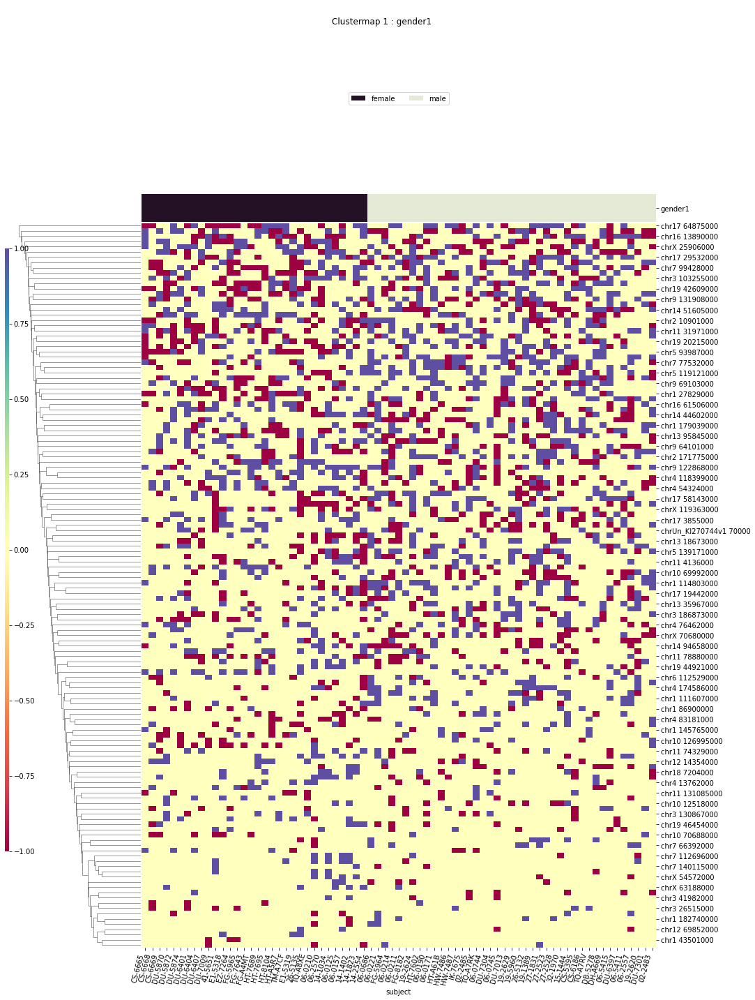

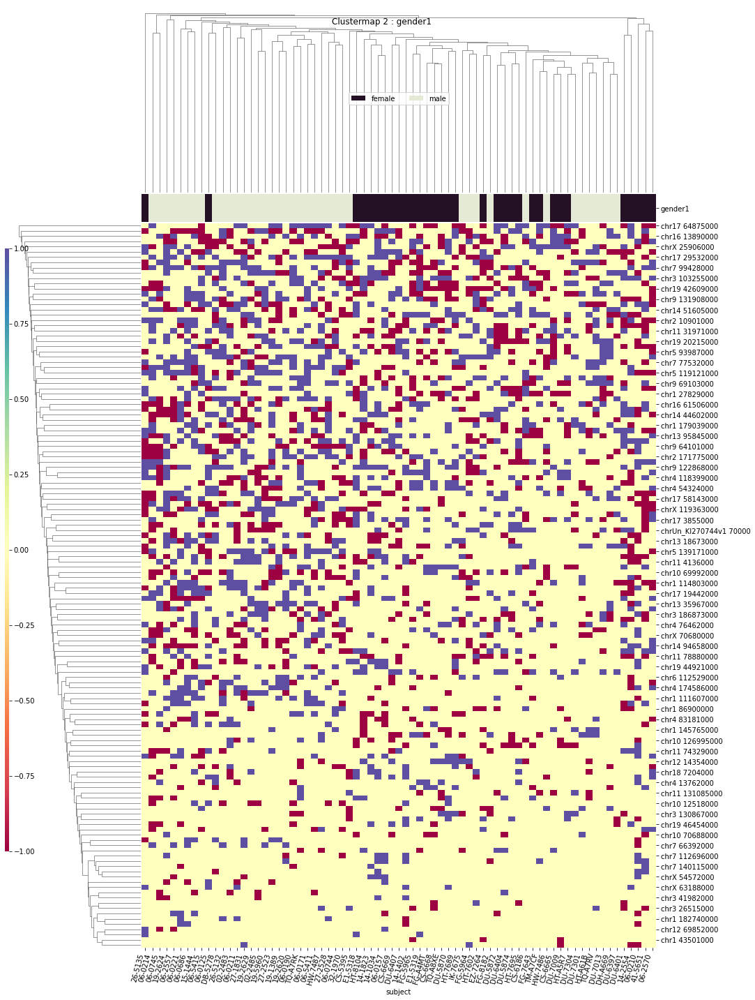

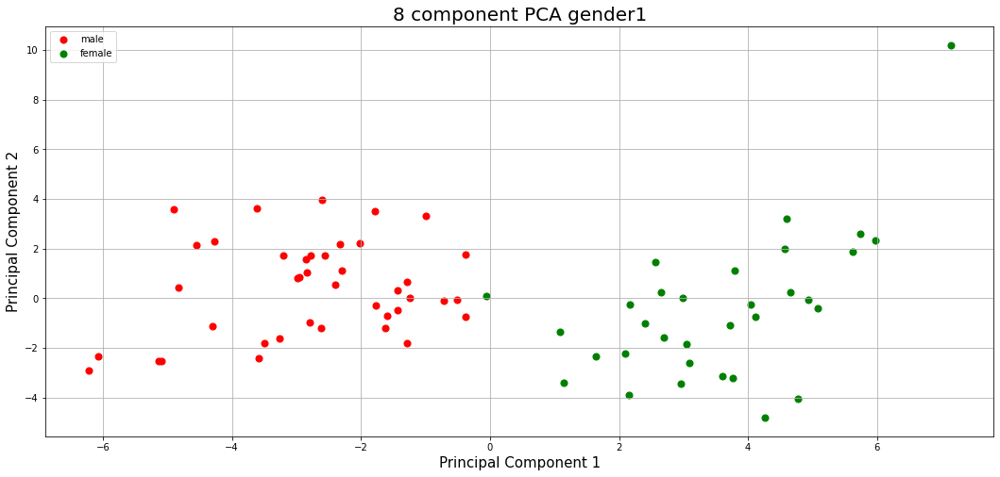

In [111]:
for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-5,heat_p=0.05)

In [112]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 13:41:56'

primary_diagnosis
T-Testing
Boxplotting
 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr20 33537000


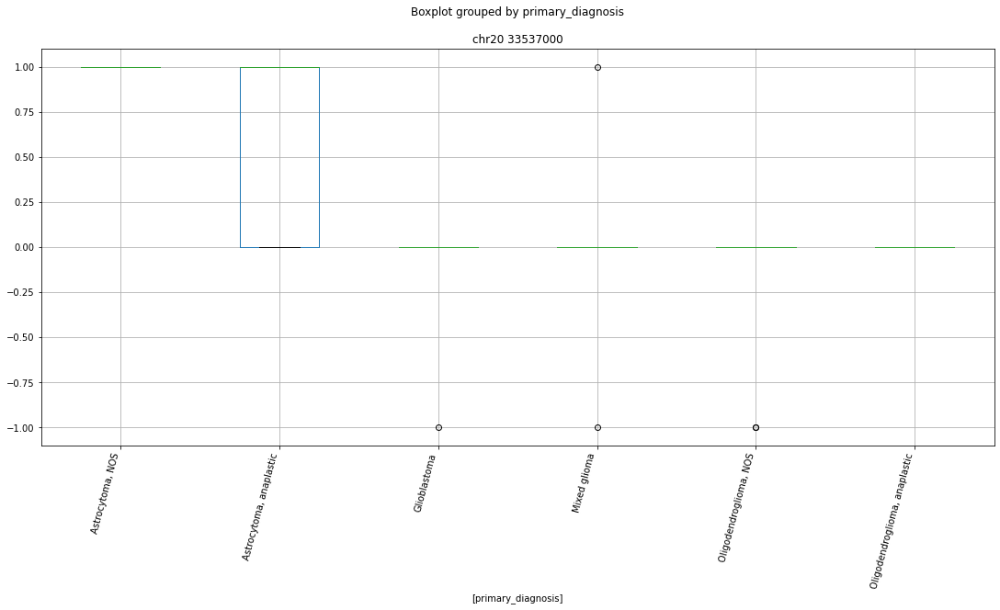

 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr22 19083000


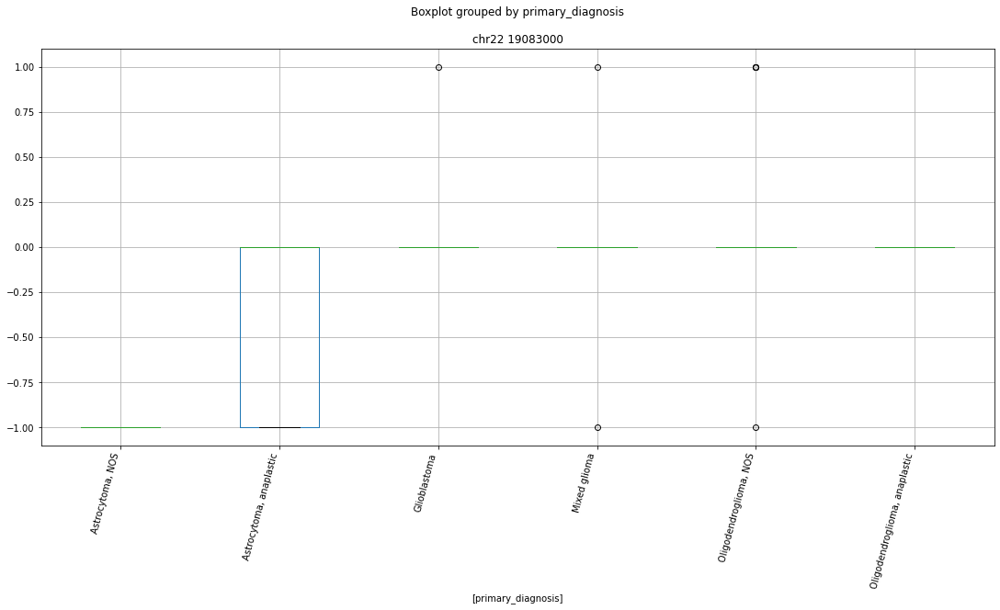

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 146095000


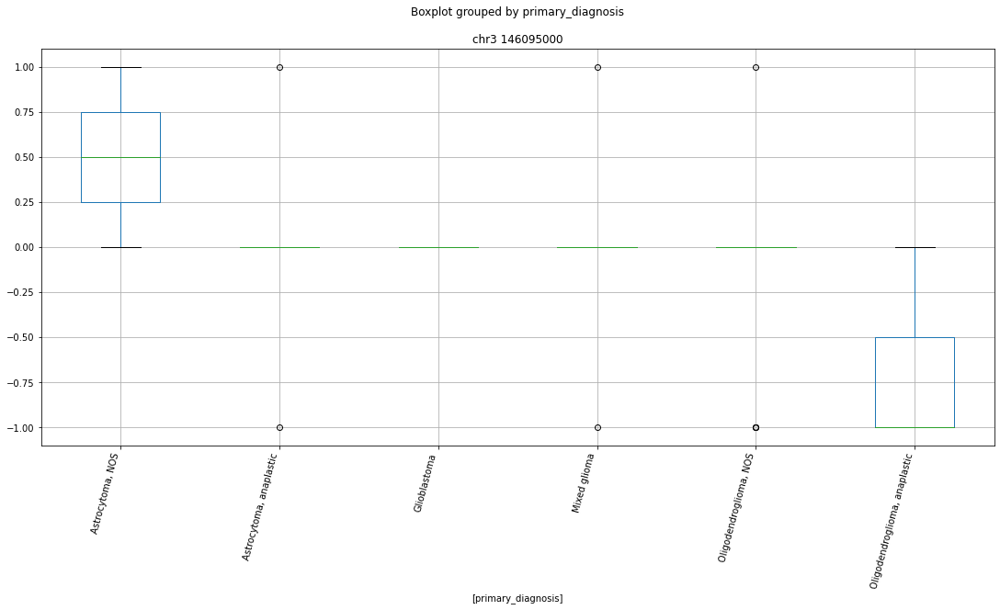

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 58454000


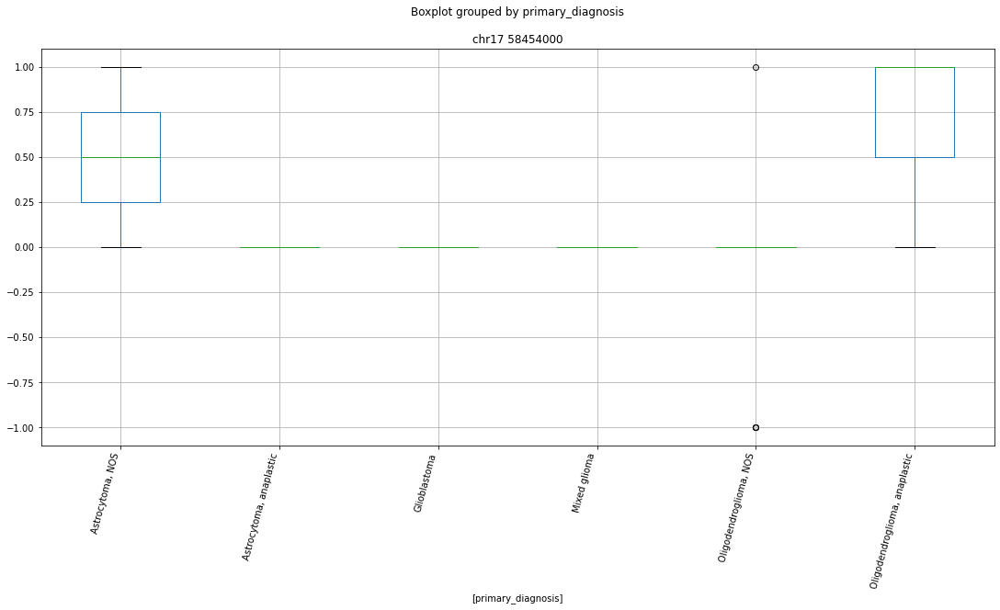

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chrX 133484000


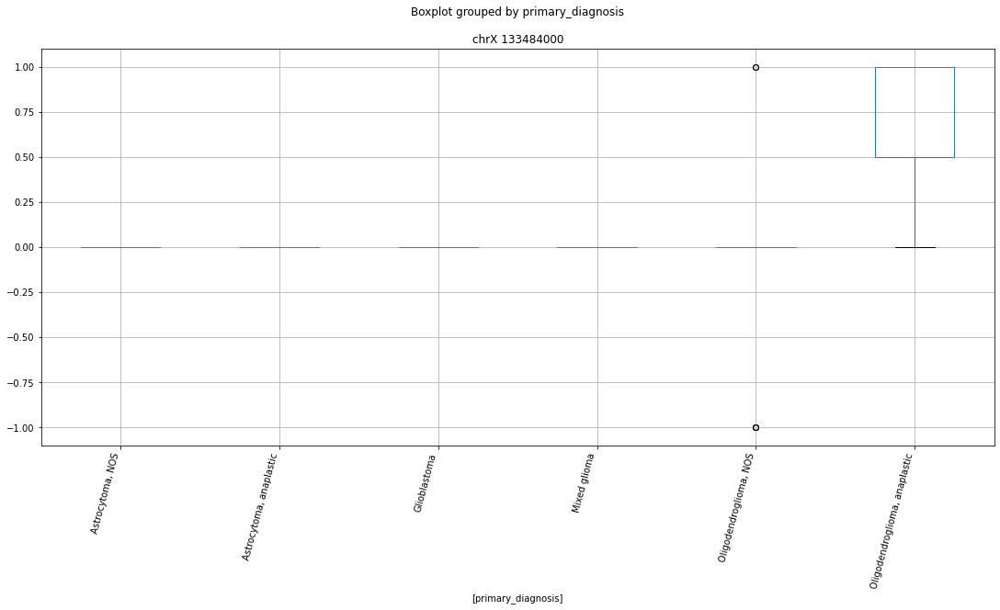

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 28838000


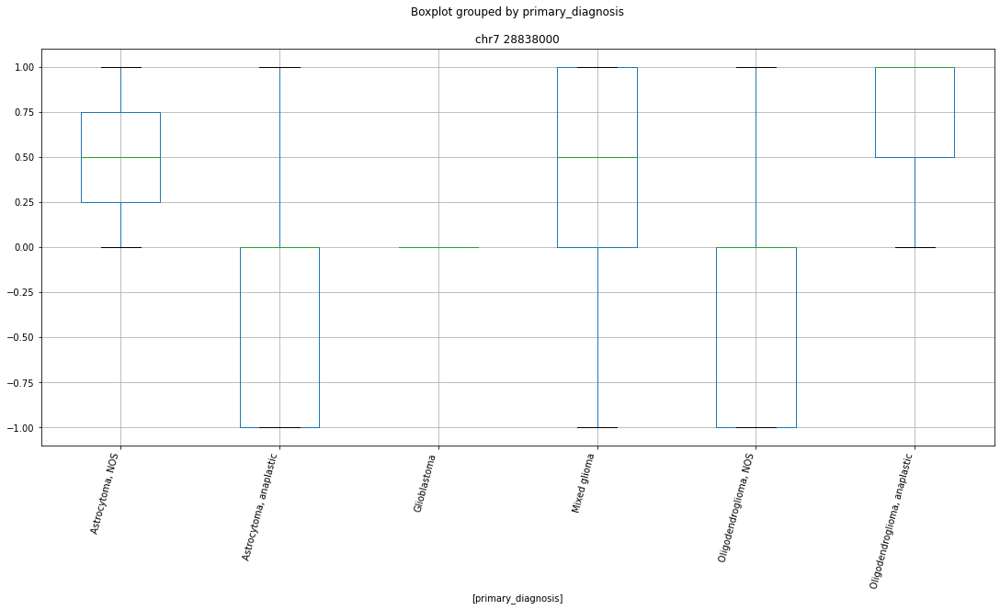

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 63808000


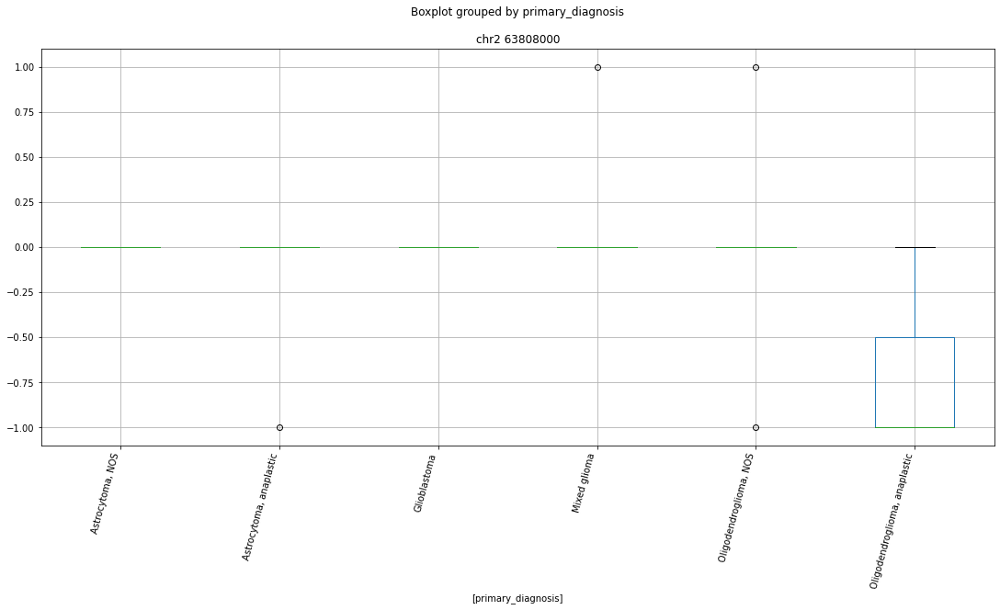

Clustermapping
['chr1 10029000' 'chr1 10427000' 'chr1 106413000' ... 'chrY 8917000'
 'primary_diagnosis' 'subject']


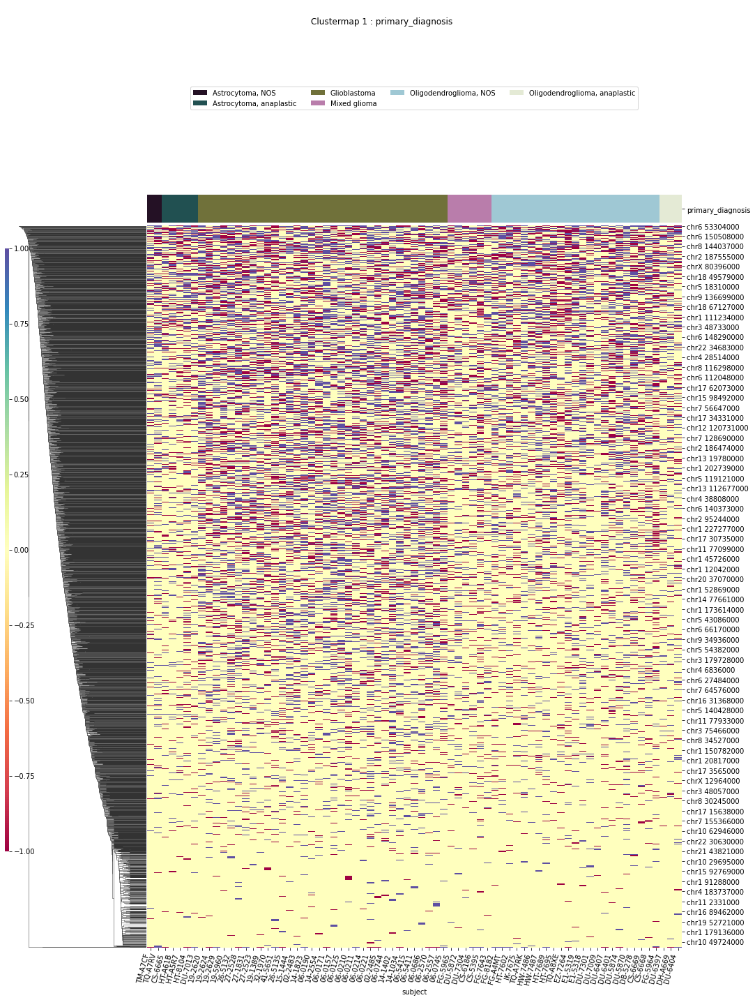

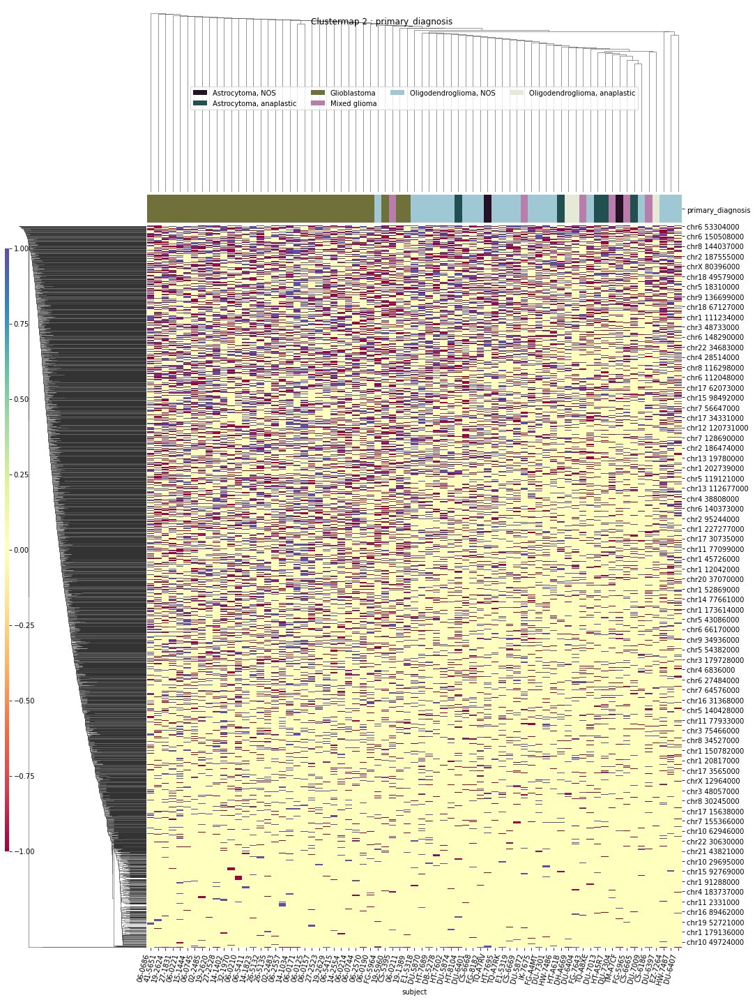

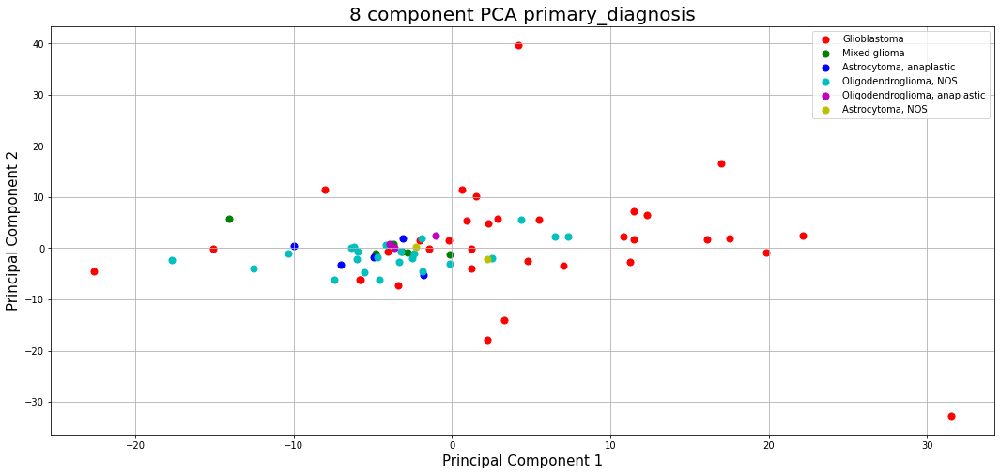

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 10427000' 'chr1 109074000' ... 'chrY 7180000' 'chrY 8917000'
 'subject']


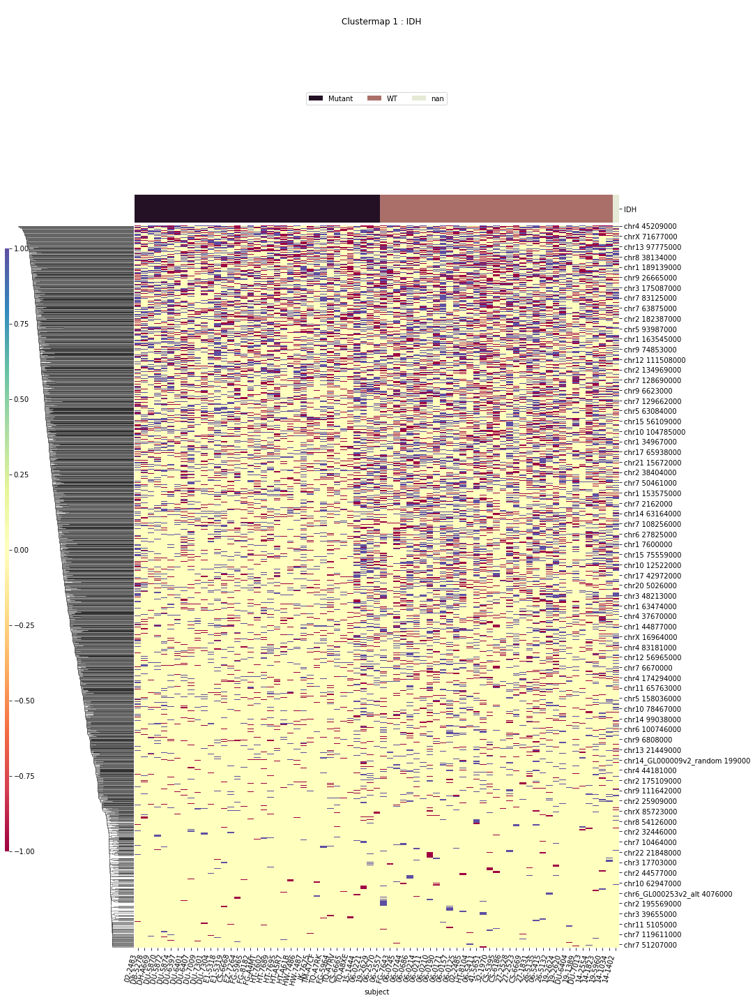

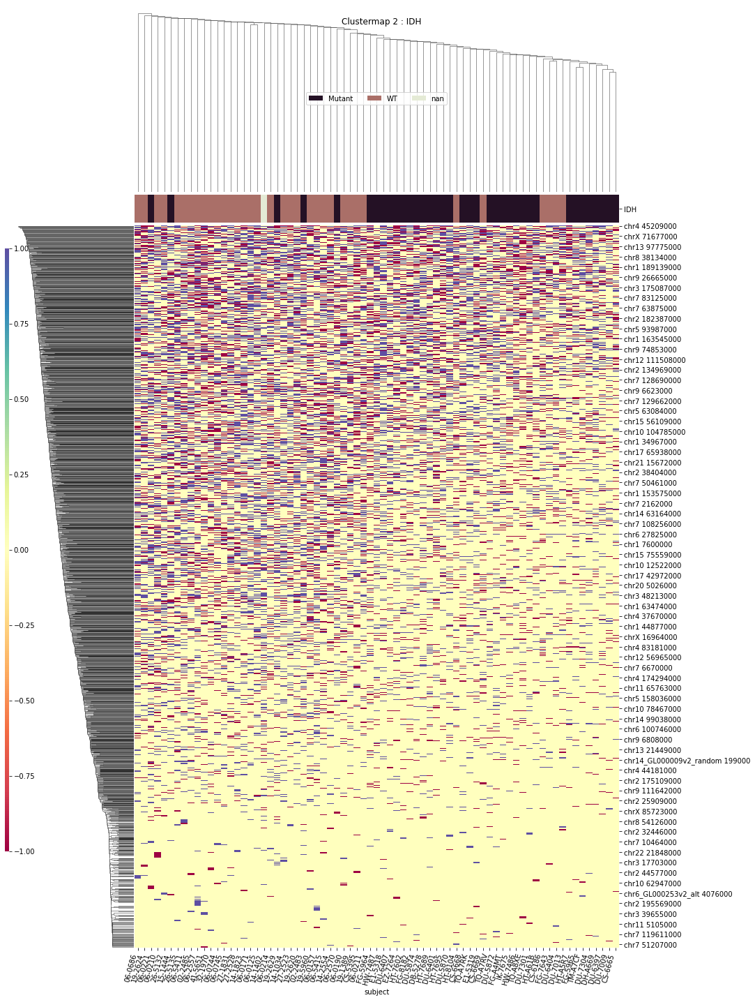

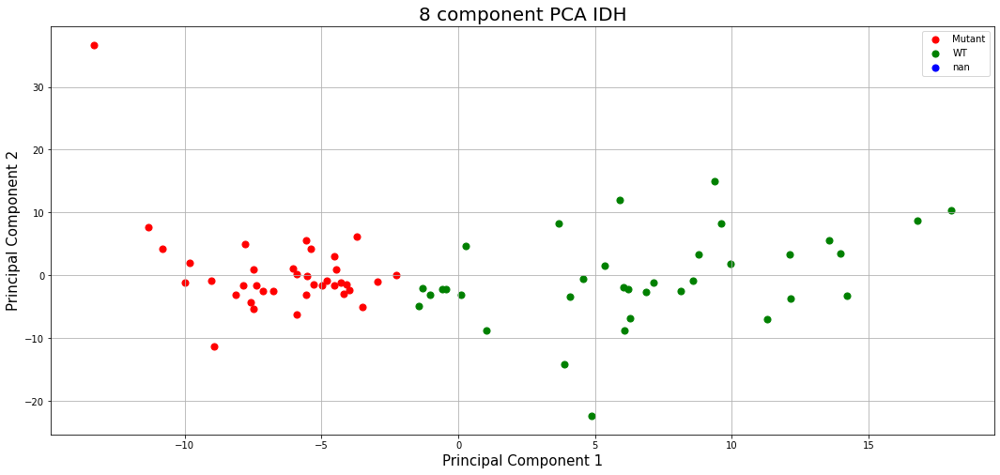

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 10427000' 'chr1 108490000' 'chr1 109176000' ... 'chrY 12878000'
 'subject' 'x1p19q']


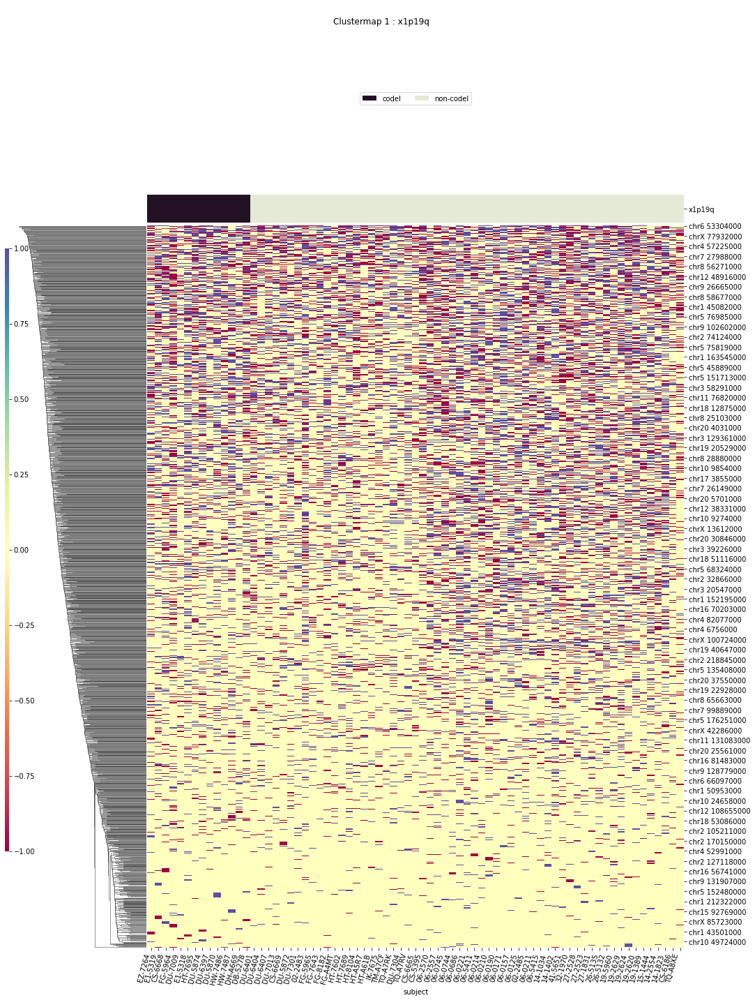

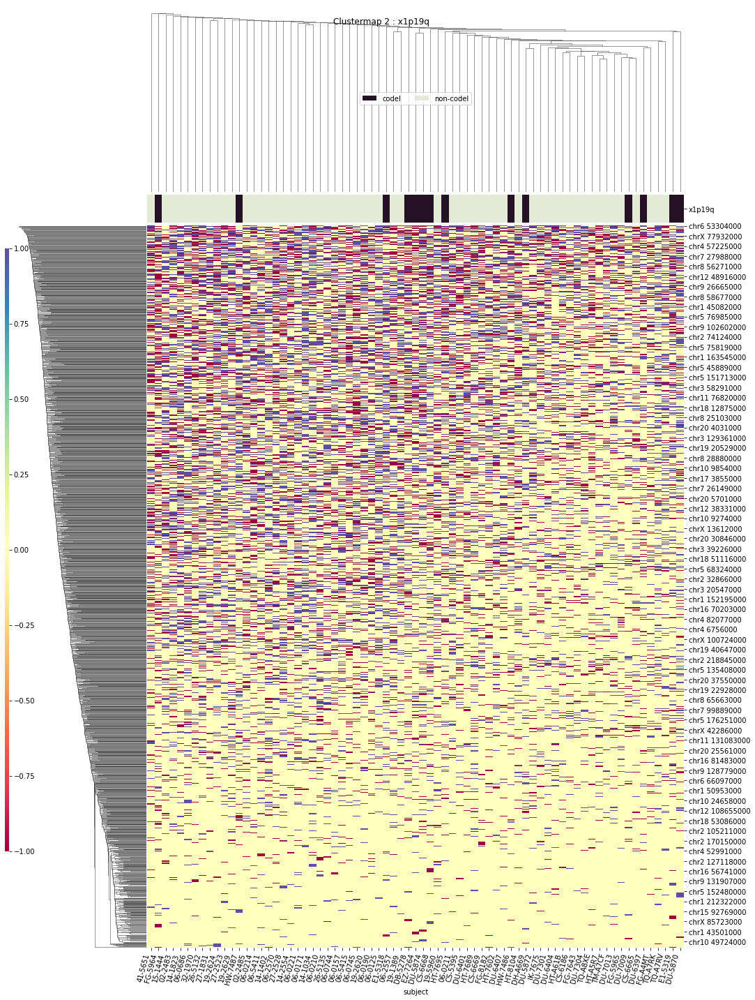

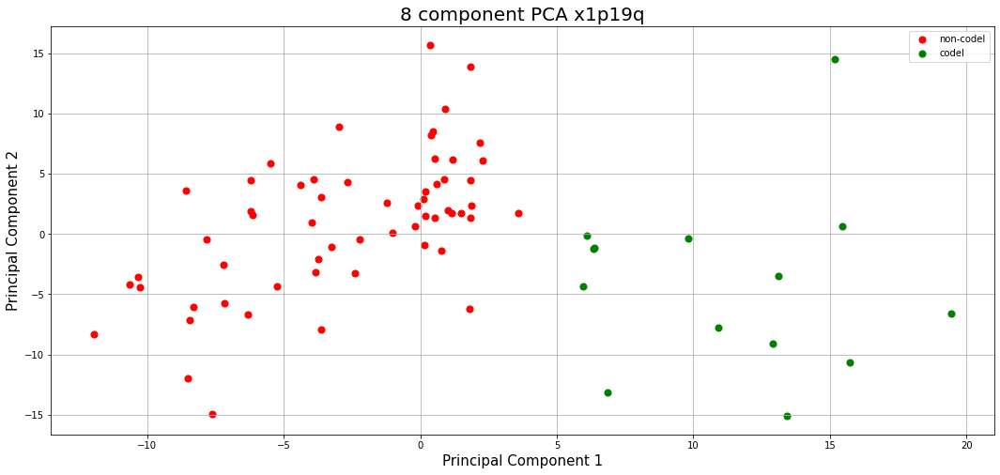

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 10427000' 'chr1 109054000' ... 'chrY 19536000'
 'chrY 8917000' 'subject']


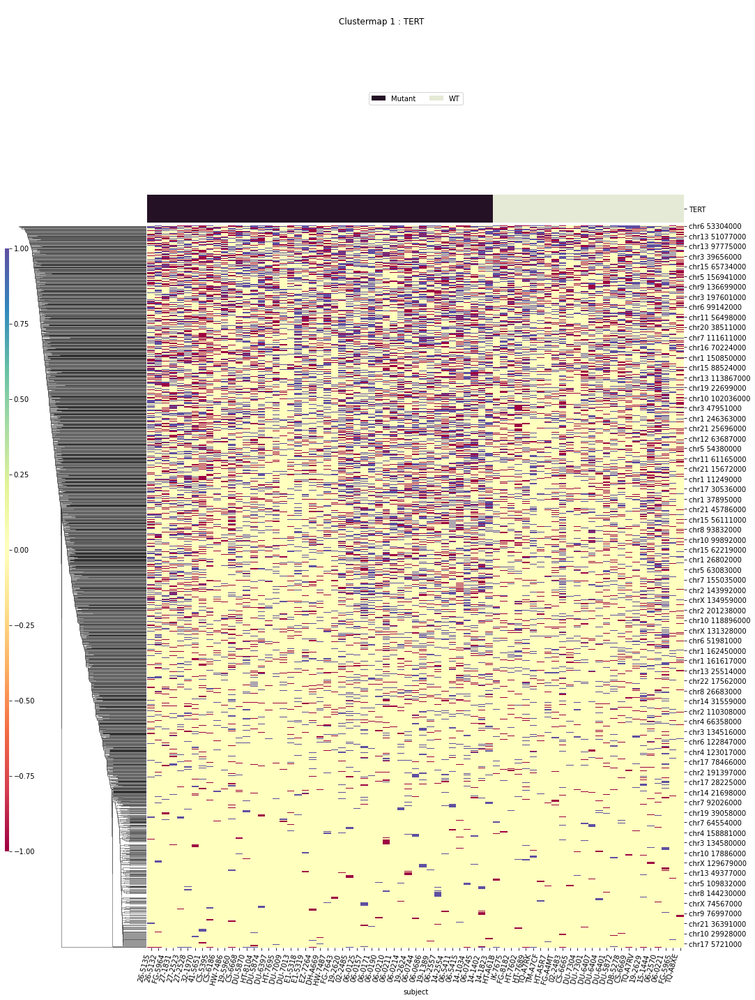

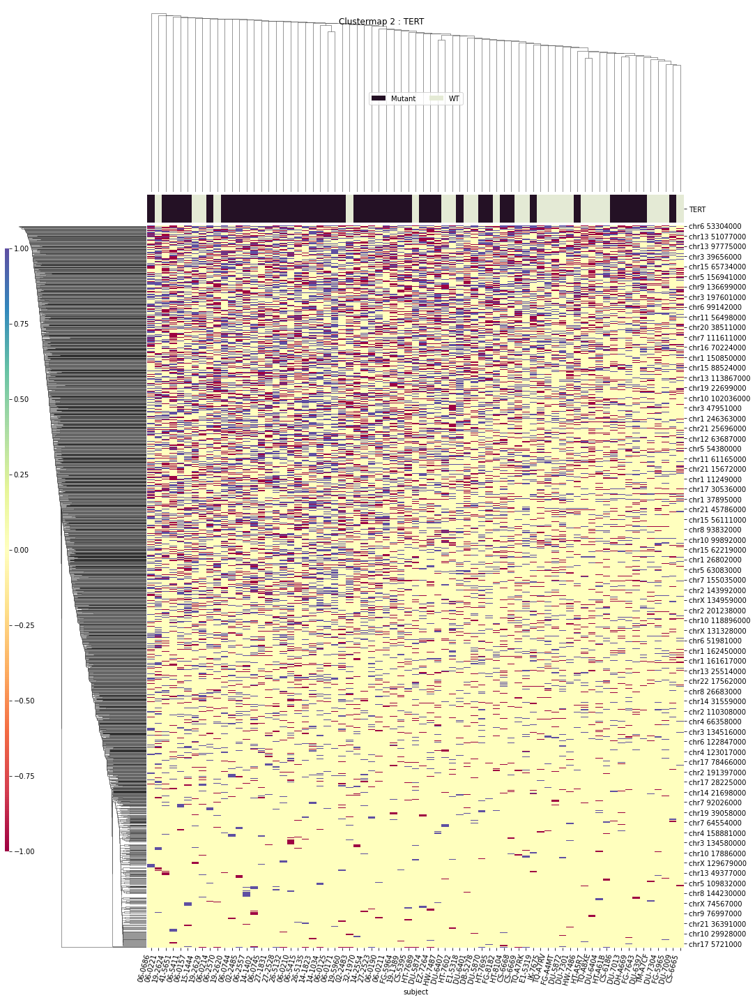

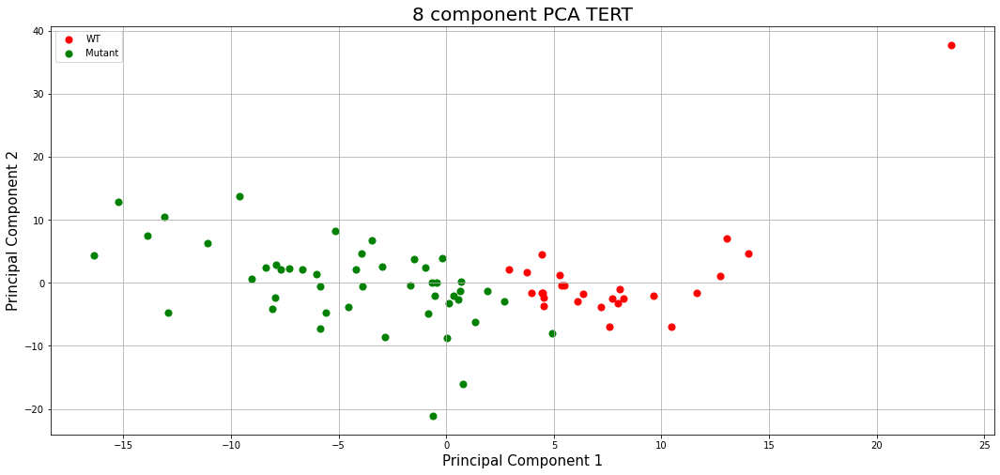

disease_type
T-Testing
Boxplotting
Clustermapping
['chr1 10427000' 'chr1 106413000' 'chr1 108490000' ... 'chrY 8917000'
 'disease_type' 'subject']


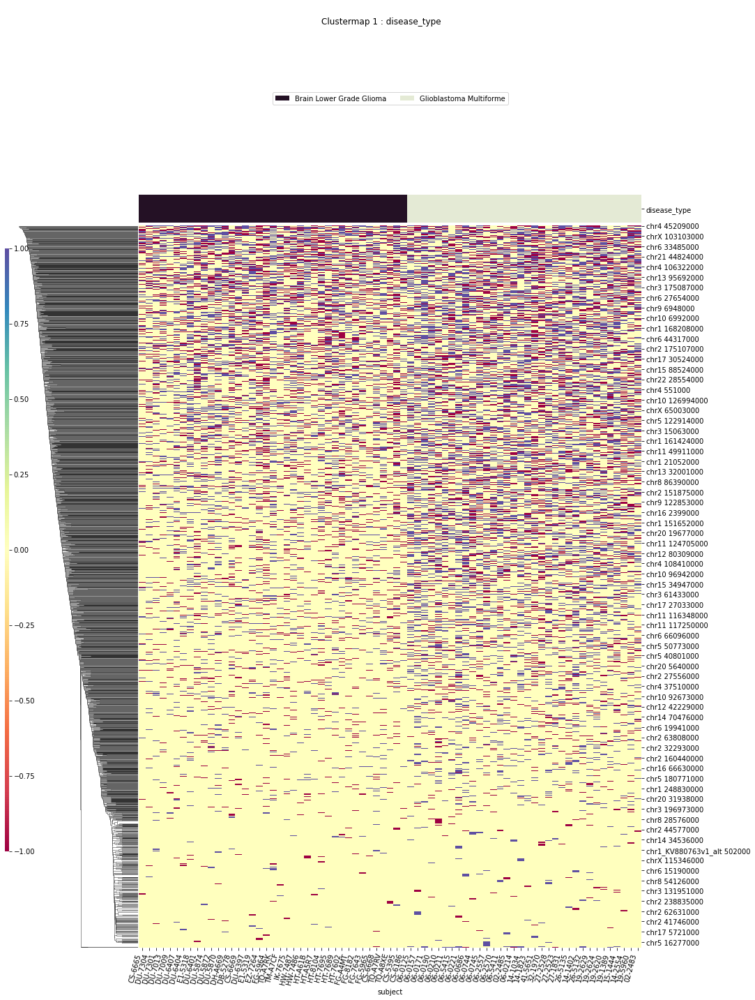

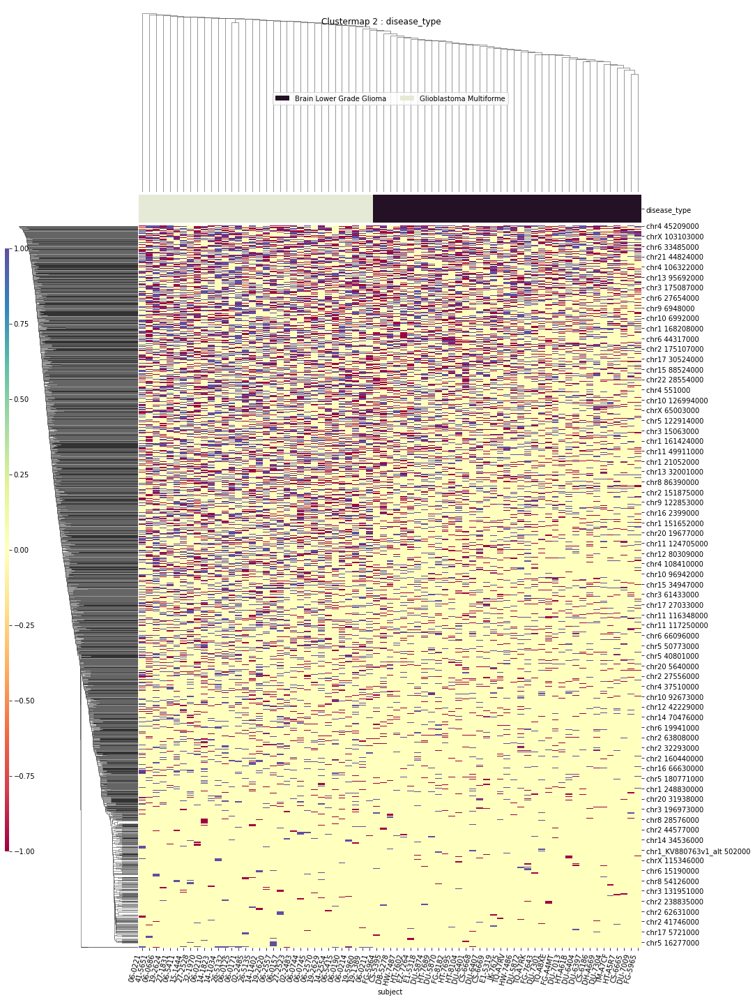

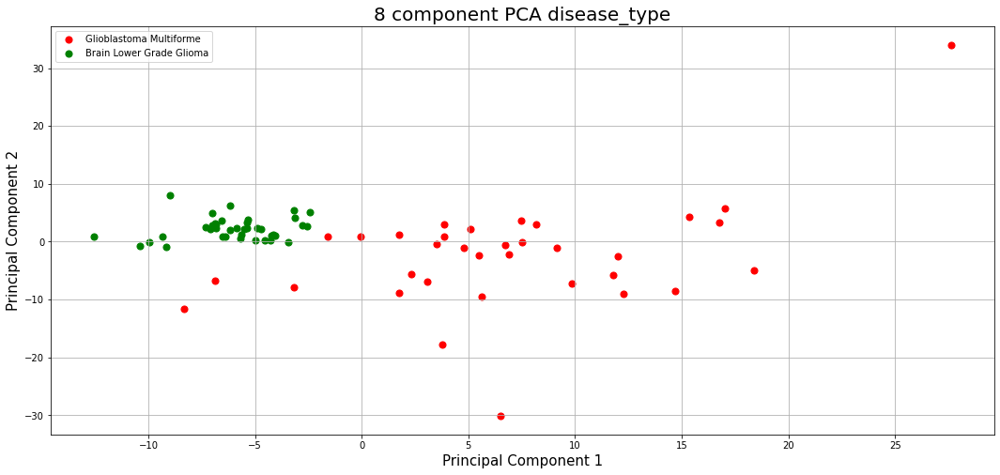

IDH_1p19q_status
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 10427000' 'chr1 106413000' ... 'chrY 7180000'
 'chrY 8917000' 'subject']


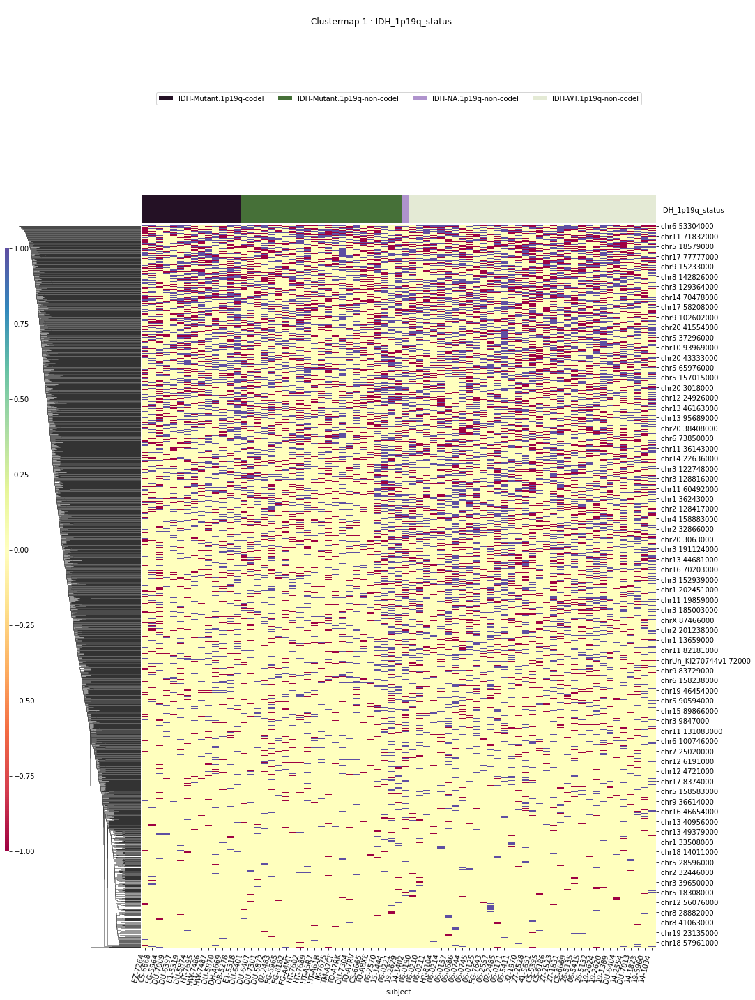

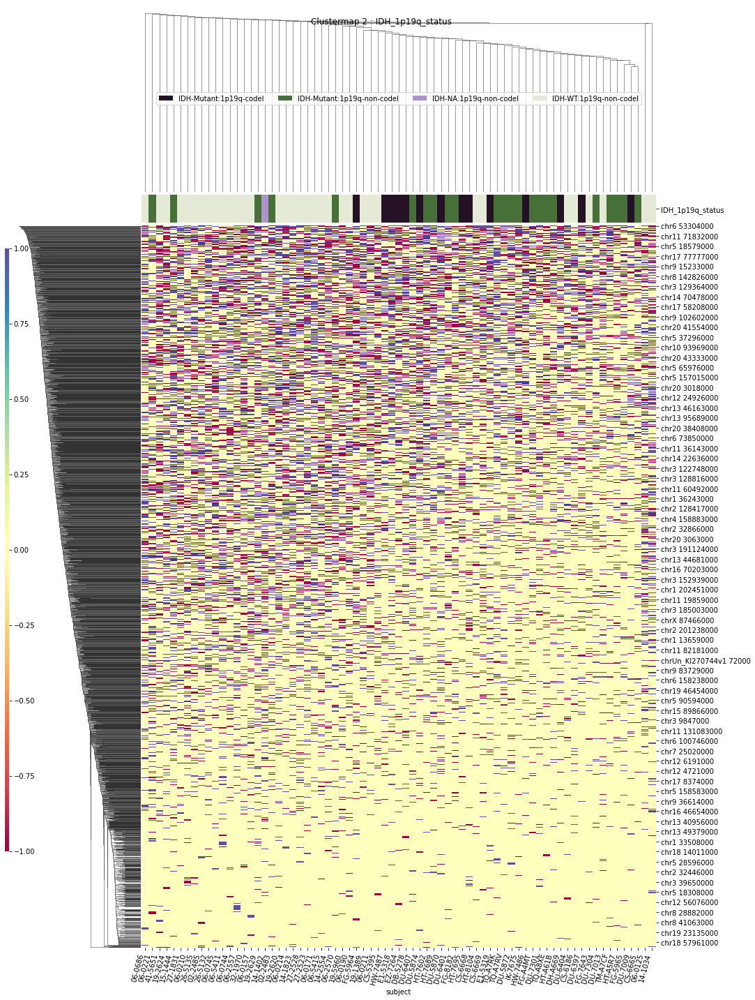

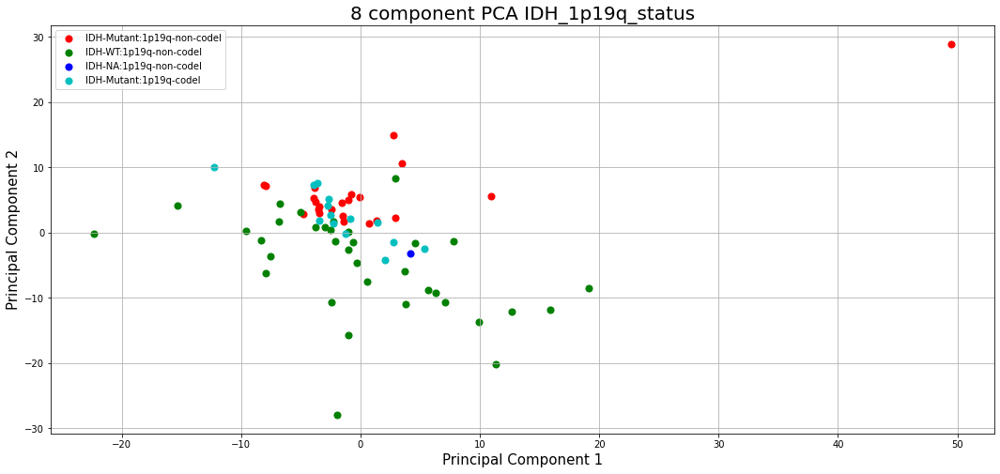

WHO_groups
T-Testing
Boxplotting
Clustermapping
['WHO_groups' 'chr1 10029000' 'chr1 10427000' ... 'chrY 7180000'
 'chrY 8917000' 'subject']


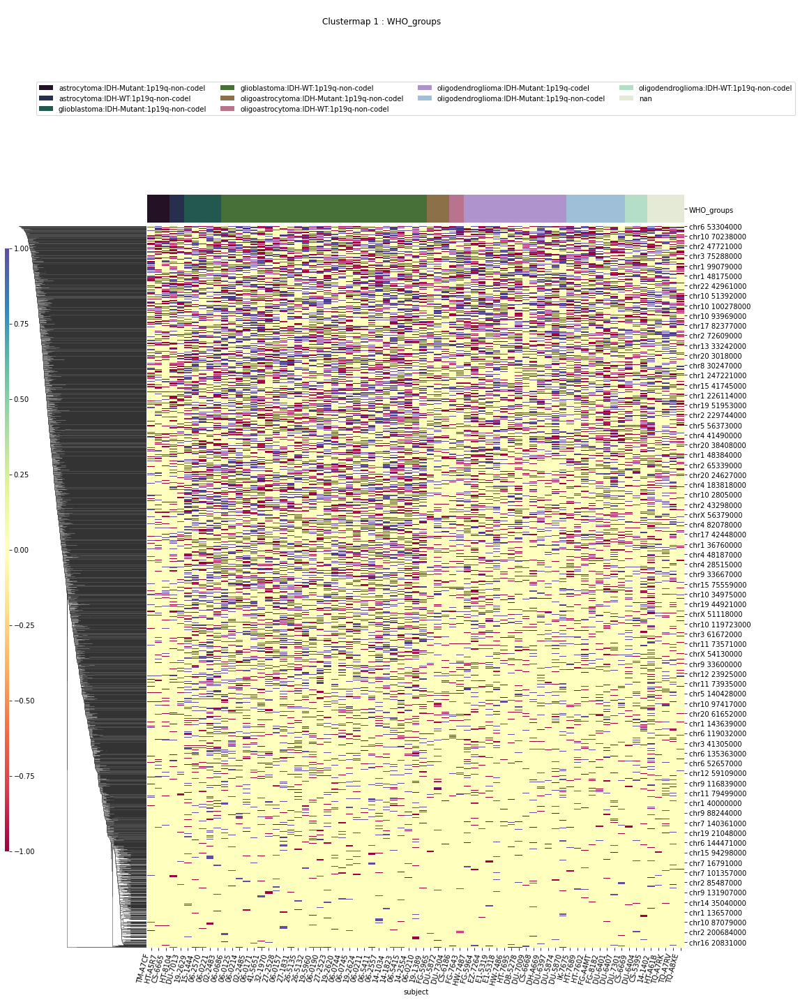

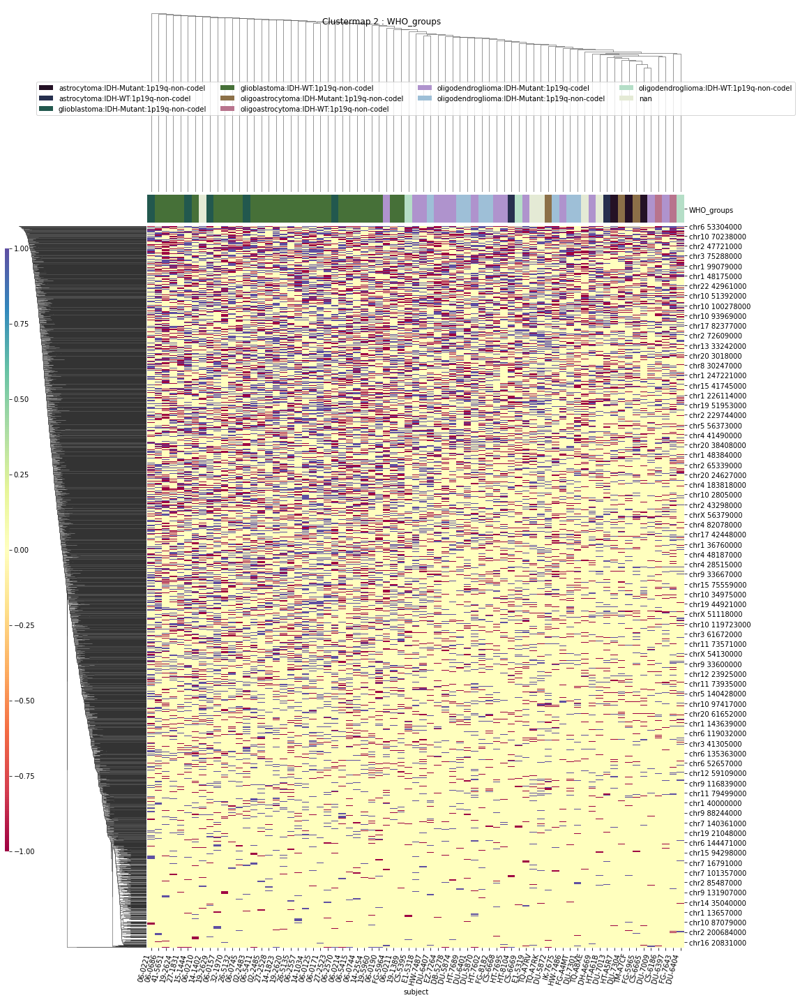

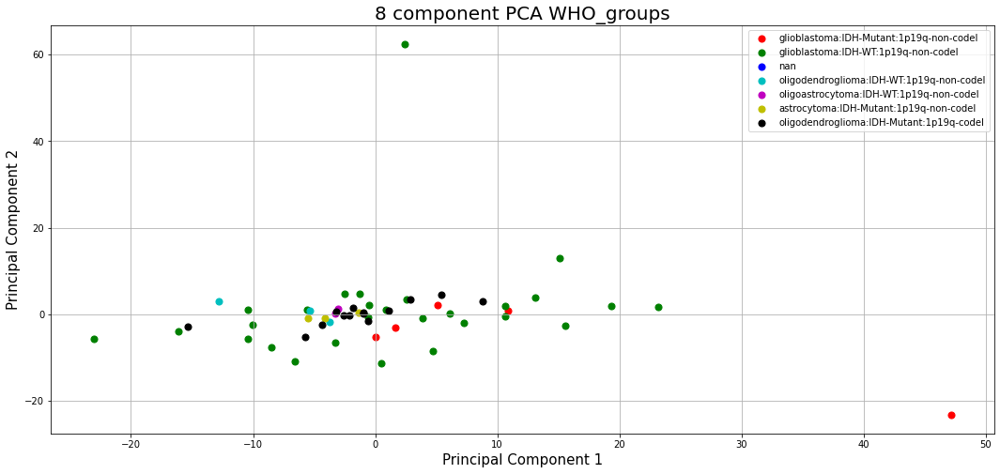

Triple_group
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
 p : 5.980116350794693e-09  ( t : 7.768066499641796 ) :  chr21 45267000


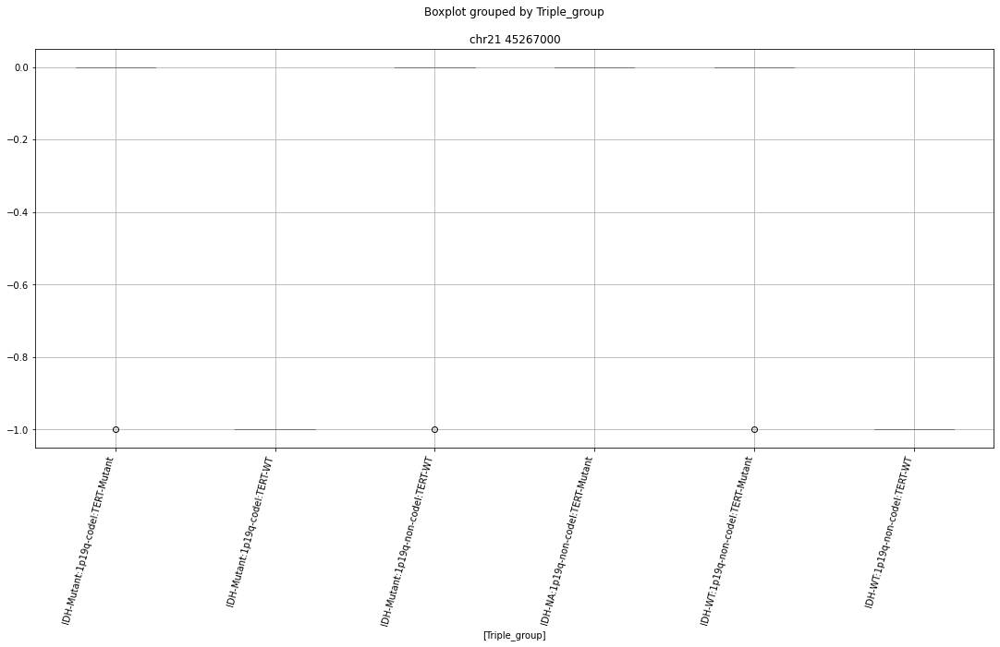

Clustermapping
['Triple_group' 'chr1 10427000' 'chr1 106413000' ... 'chrY 7180000'
 'chrY 8917000' 'subject']


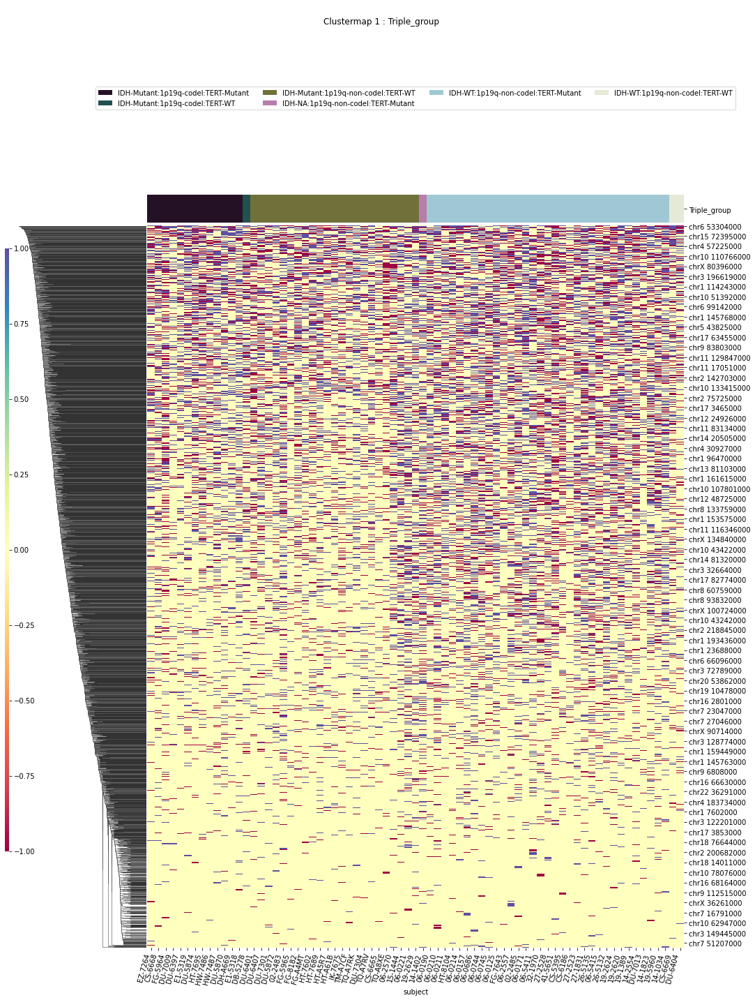

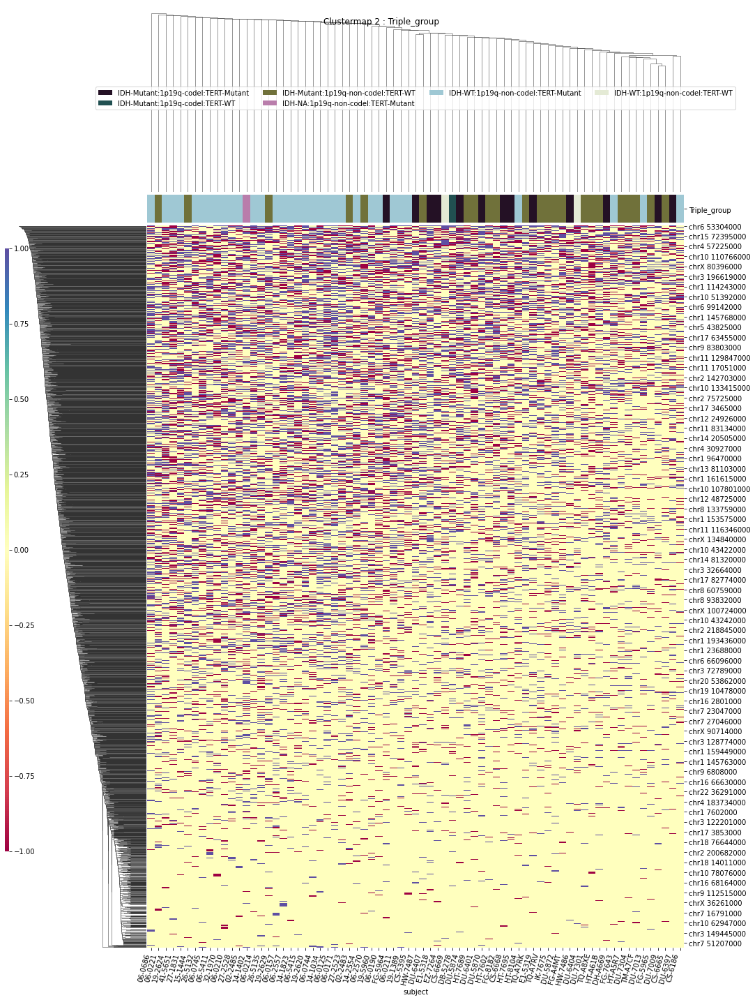

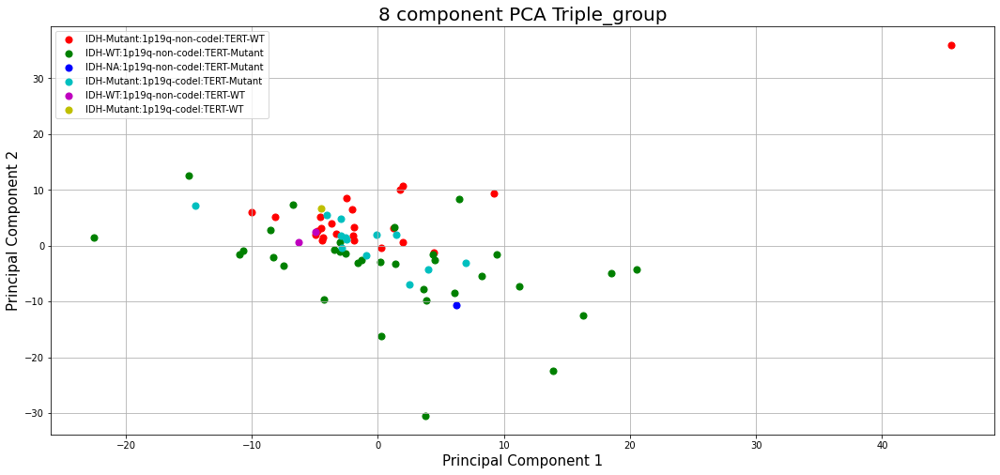

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 10029000' 'chr1 106413000' ... 'chrY 4296000' 'chrY 8917000'
 'subject']


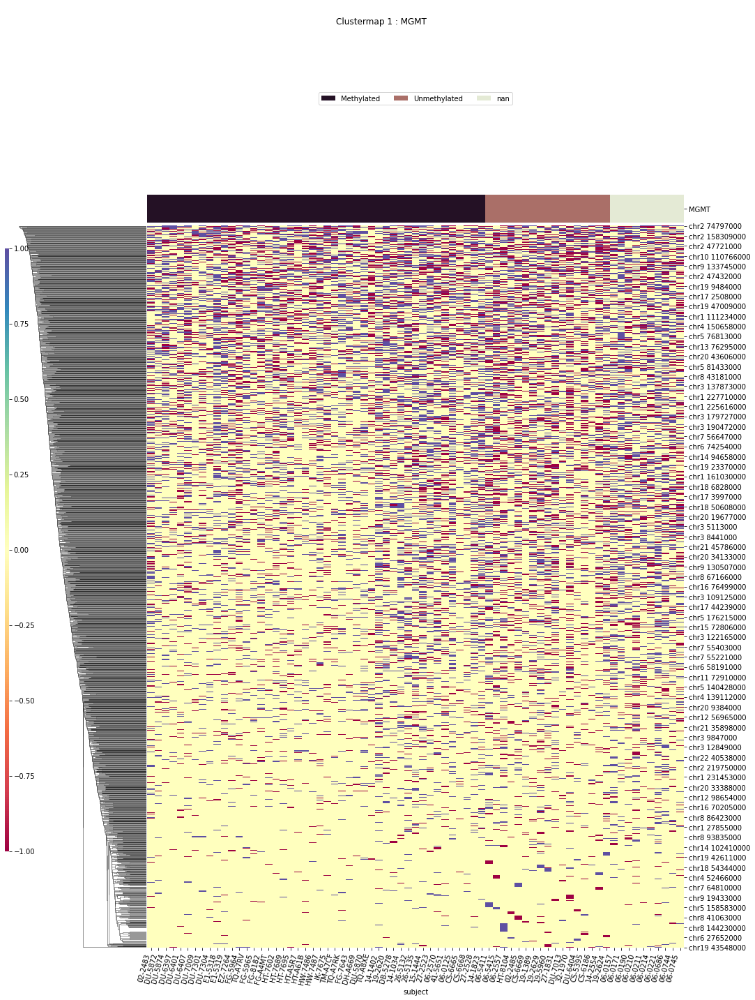

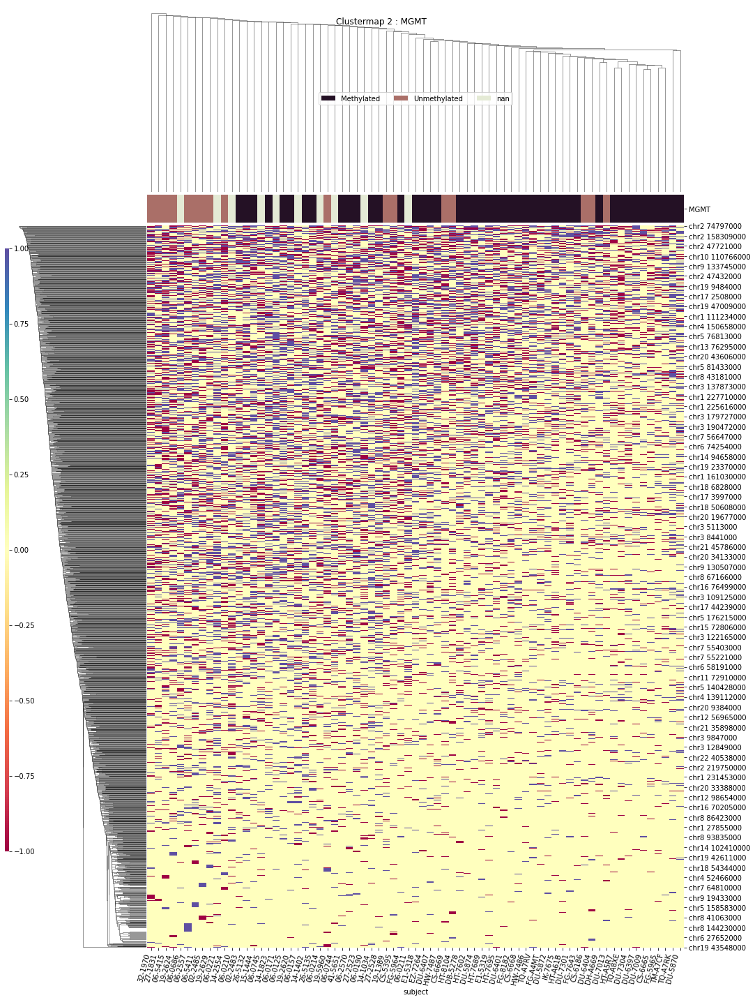

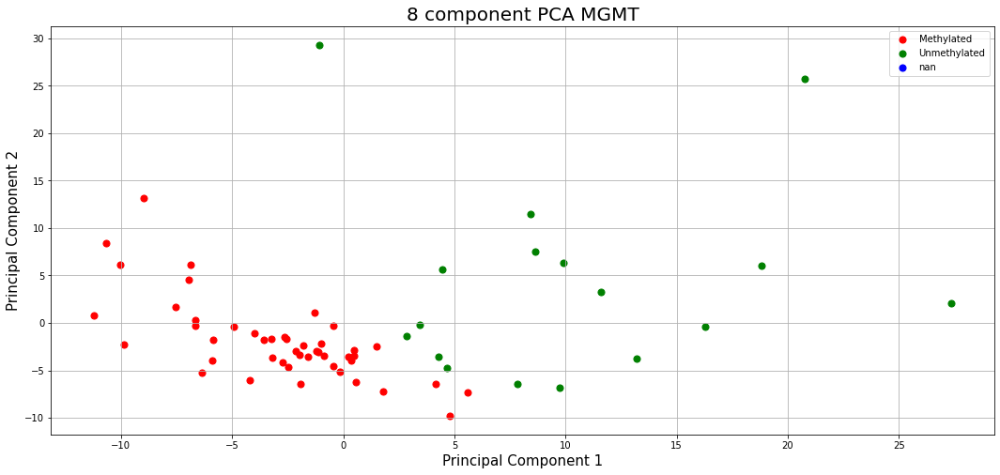

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 10029000' 'chr1 106413000' 'chr1 108676000' ... 'chrY 8917000'
 'gender1' 'subject']


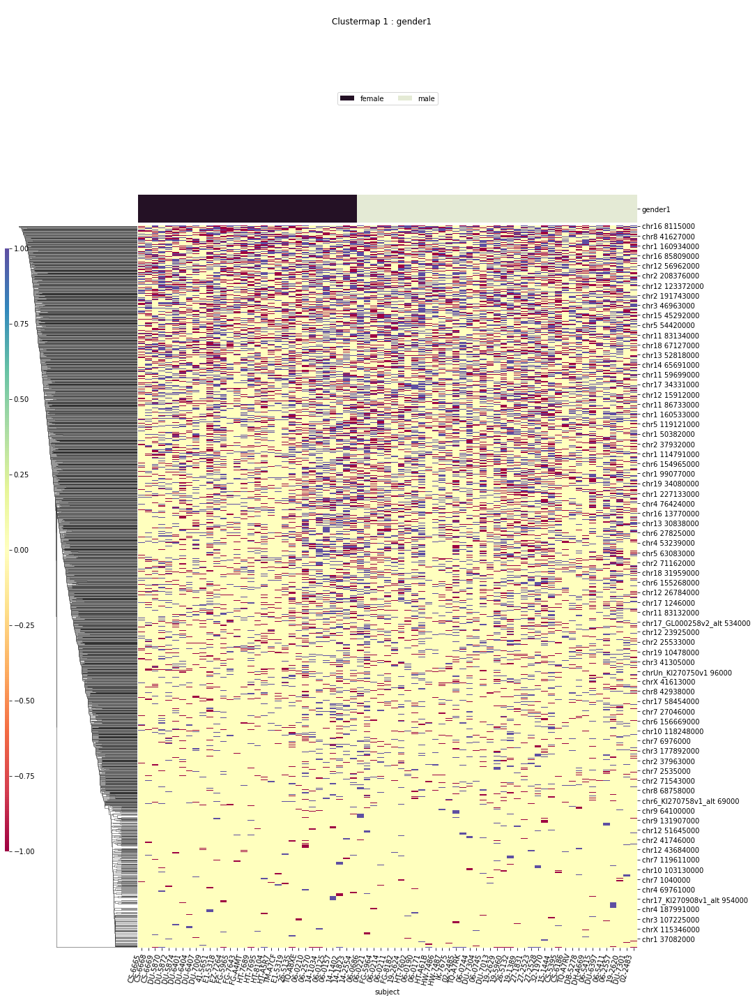

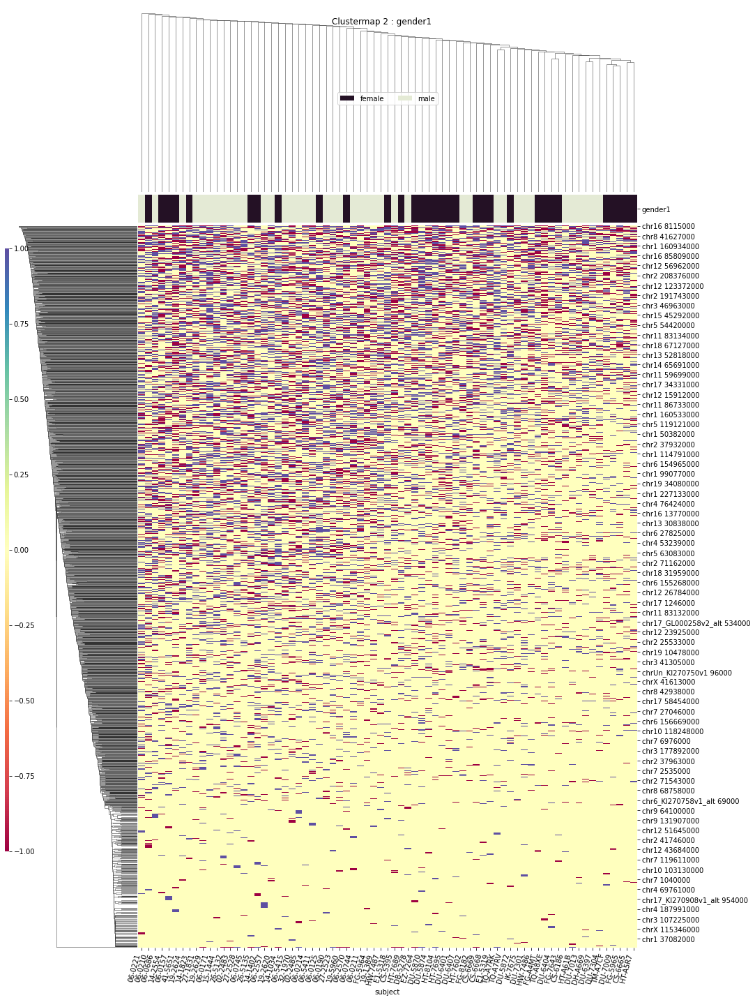

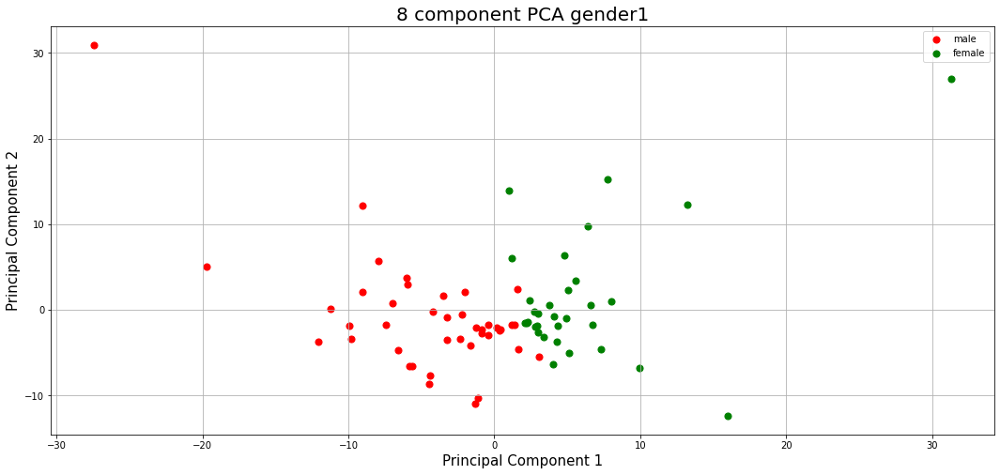

In [113]:
for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-8,heat_p=0.5)

In [114]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 13:59:23'

In [115]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [116]:
pd.set_option('display.max_columns', default_max_columns)

In [117]:
pd.set_option('display.max_rows',default_max_rows)

In [118]:
pd.set_option('display.precision', default_precision)